<a href="https://colab.research.google.com/github/limited-fion/ee3-ml/blob/main/Fion_ML_Perceptron_learning_algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Perceptron

This tutorial explores the perceptron. The perceptron as a concept is relatively simple and is thus not often used on its own as a method in modern machine learning. However it serves as an important building block for more capable machine learning models, such as neural networks which have led to the advanced field of deep learning. 

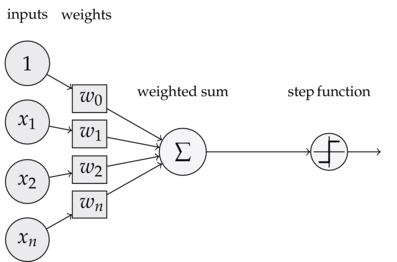

The perceptron (illustrated in the figure above) is a binary classifier which takes as input a vector, $\mathbf{x} = [x_1, x_2, \dotsc, x_n]^T$, and outputs a binary prediction $y \in \{-1, +1\}$. It does this by first producing a scalar value by multiplying each element in the input vector with a learned weight of the perceptron, $\mathbf{w} = [w_1, w_2, \dotsc, w_n]^T$ and then summing all the resulting elements together. This operation can be expressed as a vector dot product $\mathbf{w}^T \mathbf{x}$. The perceptron then checks if this scalar value $\mathbf{w}^T \mathbf{x}$ is greater or smaller than a threshold $t$. If the value is greater than the threshold then the perceptron predicts $y = +1$ otherwise it predicts $y = -1$. This can be expressed as a linear predictor where

$y  = \begin{cases}
          +1, & \text{if} & \mathbf{w}^T \mathbf{x} \ge t \\
          -1, & \text{if} & \mathbf{w}^T \mathbf{x} \lt t
      \end{cases}
$

This formulation is inconvenient as it includes an extra threshold parameter that is not part of the model. A common trick is to include it as a so called bias. We prepend $x_0 = 1$ to the input $\mathbf{x}$ such that $\mathbf{x} = [x_0, x_1, x_2, \dotsc, x_n]^T$ and $\mathbf{w} = [w_0, w_1, w_2, \dotsc, w_n]^T$. The weight $w_0$ will now represent the threshold (more precisely $w_0 = -t$) as $\mathbf{w}^T \mathbf{x} = \sum_{i=1}^n w_i x_i + w_0 x_0$ where $x_0 = 1$. 

With the bias, the linear predictor turns into

$y  = \begin{cases}
          +1, & \text{if} & \mathbf{w}^T \mathbf{x} \ge 0 \\
          -1, & \text{if} & \mathbf{w}^T \mathbf{x} \lt 0
      \end{cases} = sign(\mathbf{w}^T \mathbf{x})
$

This is the mathematical formulation of the perceptron. However, this does not discuss how the weights $\mathbf{w}$ are learned. For this we need to go into the learning algorithms that are associated with the perceptron. To get a better understanding of these algorithms, this tutorial will show the python (currently the most commonly used language in machine learning) code needed to run these algorithms together with visualisations that provides more clarification.

The learning process in perceptron happens iteratively by updating the weights until a decision boundary is reached (in case we are dealing with linearly seperable data). Initial weights of the perceptron can be set to a vector of zeros, i.e. $\mathbf{w} = \mathbf{0}$. The algorithm takes each data point $x_i$ and classifies it using the current perceptron weights as either $+1$ or $-1$ using $sign(\mathbf{w}^T \mathbf{x})$. If the classification is incorrect such that the predicted value does not match the corresponding label, i.e. $sign(\mathbf{w}^T \mathbf{x}) \ne y_i$ then we stop iterating through the dataset and we update the learned weights of our perceptron such that the rule is given as $\mathbf{w} \leftarrow \mathbf{w} + y_i x_i$. We can also specify for the algorithm the number of iterations that it will run for. For this we need to go into the learning algorithms that are associated with the perceptron. To get a better understanding of these algorithms, this tutorial will show the python (currently the most commonly used language in machine learning) code needed to run these algorithms together with visualisations that provides more clarification.

## This Code is from "Python Machine Learning," Sebastian Raschka, Packt Publishing, 2015 (page 25), with modifications.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from matplotlib.colors import ListedColormap
from pandas.plotting import scatter_matrix
import warnings
warnings.filterwarnings('ignore')

In this tutorial, we will be using the famous Iris flower  dataset for testing our perceptron. The Iris flowers dataset contains four features (length and width of sepals and petals) of 50 samples of three species of Iris - Versicolor, Virginica and Setosa.

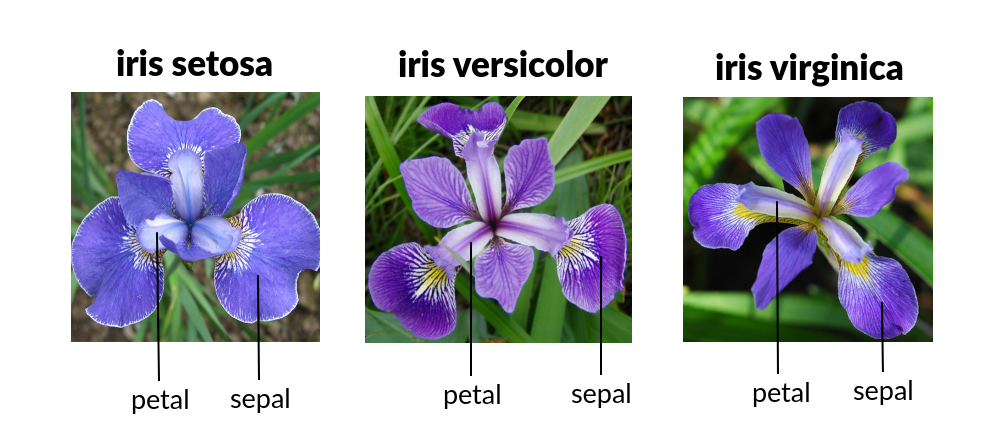

In [ ]:
# We can use the sklearn package in order to import the data directly. Or you can dowload it as csv file and import it.
from sklearn.datasets import load_iris
iris = load_iris()

# This command generates a decsription of the dataset if you need more information 
print(iris['DESCR'])

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


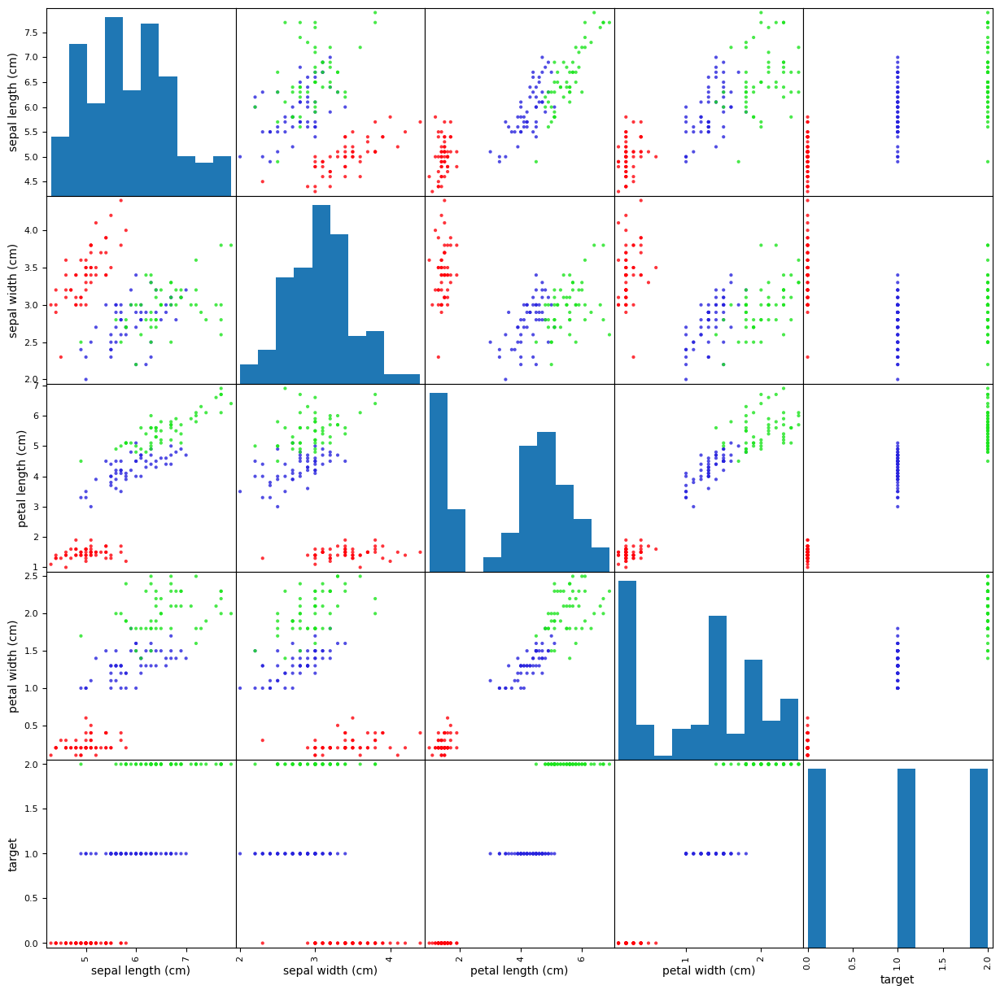

In [ ]:
# You can visulaise the Iris data using the following cell for better understanding 
# Note: the last column of this data represesent the labels, where 0 -> Setosa, 1 -> Versicolor, 2 -> Virginica

from pandas.plotting import scatter_matrix
import pandas as pd

iris_data = pd.DataFrame(data=iris['data'],columns=iris['feature_names'])
iris_data["target"] = iris['target']
color_dictionary = {1: "#FE010A", 2: "#2722DD", 3: "#1BE41D"}
colors = iris_data["target"].map(lambda x: color_dictionary.get(x + 1))
ax = scatter_matrix(iris_data, color=colors, alpha=0.8, figsize=(15, 15), diagonal='hist')

iris_data

#scroll down to see the plots

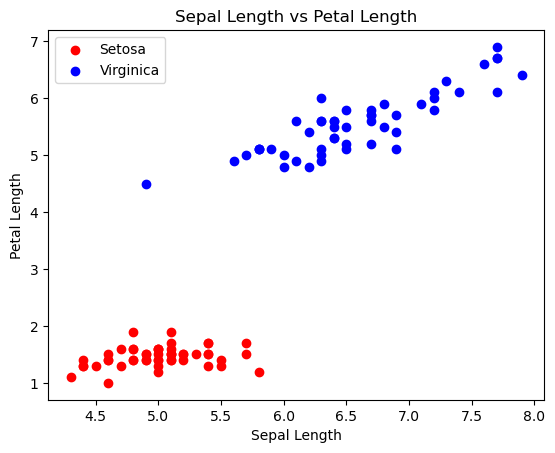

In [ ]:
# We will use the perceptron as binary classifier, therefore we will choose two classes from the three. Let it be Setosa 
# and Virginica. Furthermore, for better data visualisation, we will consider two features; petal length and sepal length
# this will make us see the features in 2D plot. 


# The following line of code will include the labels for Setosa and Virginica classes in one array and discard the Versicolor.
setosa_label = iris_data.iloc[0:50,4].values
virginica_label = iris_data.iloc[100:150,4].values
labels = np.concatenate((setosa_label,virginica_label))

# Note that from the original data Setosa is labelled as 0 and Virginica is labelled as 2. In order to match the labels 
# with our defined sign function for binary classification, we change the labels such as Setosa class has label -1 and 
# Virginica has a label 1 using the following code

y = np.where(labels == 0, -1, 1)

# The following line of code will consider the two features (petal length and sepal length only) for the Setosa and Virginica
# classes and combine the features in one array.

X_setosa = iris_data.iloc[0:50, [0,2]]
X_virginica = iris_data.iloc[100:150, [0,2]]
X = np.concatenate((X_setosa,X_virginica))

# We can plot the features in 2D plot such that the sepal length feature is represented by x-axis 
# and petal length  is represented by y-axis

plt.scatter(X[:50,0],X[:50,1],color='red',marker='o',label='Setosa')
plt.scatter(X[50:100,0],X[50:100,1],color='blue',marker='o',label='Virginica') 
plt.title("Sepal Length vs Petal Length")
plt.xlabel('Sepal Length')    
plt.ylabel('Petal Length')
plt.legend(loc='upper left')
plt.show()

# Perceptron Learning Algorithm (PLA)

Having prepared our data, we are now ready to take a look at our first learning algorithm - the Perceptron Learning Algorithm (PLA). The PLA is an iterative algorithm which iterates over each data points from the dataset.

Initial weights of the perceptron can be set to a vector of zeros, i.e. $\mathbf{w} = \mathbf{0}$. PLA then takes each data point $x_i$ and classifies it using the current perceptron weights as either $+1$ or $-1$ using $sign(\mathbf{w}^T \mathbf{x})$. The perceptron update rule is given as $\mathbf{w} \leftarrow \mathbf{w} + y_i x_i$. Note that the update is done only if the predicted label is incorrect and the weights are updated in the opposite direction to the prediction i.e., the predicted label was $+1$ while the true one was $-1$ and vice versa. In this way the error should decrease in the next iteration. After the update of the  weights, we go back to the first data point and start iterating through the points again. If the dataset is separable i.e. all data points can be classified correctly, then the algorithm will eventually iterate through all the  data points without any misclassification.

In [ ]:
def predict(W, X):
        """ Return class label after each setp """
        return np.where(net_input(W, X) >= 0.0, 1, -1)      

In [ ]:
def net_input(W, X):
        """ Calculate net input """
        return np.dot(X, W[1:]) + W[0]

In [ ]:
def plot_boundary(W,X):
        """Function to plot the boundary defined by the weights. Given equation."""
        """w0 + w1*x1 + w2*x2 = 0, used to generate the line."""
        x_vals = []
        y_vals = []
        for i in range(0,10):
            x_vals.append(i) 
            result = (-1)*(W[1]*i + W[0])/W[2] #Uses the equation to find y_vals using x_vals as input and weights. 
            y_vals.append(result)
            
    # This part here define the x-axis and y-axis style according to the data we are using (Iris data).
    # Hence: you can edit the names depends on the features/labels you are using 
         
        plt.scatter(X[:50,0],X[:50,1],color='red',marker='o',label='Setosa')
        plt.scatter(X[50:100,0],X[50:100,1],color='blue',marker='o',label='Virginica') 
        plt.title("Sepal Length vs Petal Length")
        plt.xlabel('Sepal Length')    
        plt.ylabel('Petal Length')
        plt.legend(loc='upper left')
        plt.plot(x_vals,y_vals, 'black') #Plot using found values that form the line. 
        plt.show()
        

In [ ]:
def plot_errors(error):
    plt.plot(range(1, len(error) + 1), error,marker='o')
    plt.xlabel('Iterations')
    plt.ylabel('Number of misclassifications')
    plt.show()   
        

In [ ]:
def fit(n_iter, X, y):
        W = np.zeros(1 + X.shape[1])
        errors_ = []       
        weights0_ = [] 
        weights1_ = []
        weights2_ = []  
        for i in range(n_iter):
            for j, (xi, target) in enumerate(zip(X,y)):
                update = target - predict(W, xi)
                W[1:] += update*xi
                W[0] += update
            # errors on whole dataset 
            errors = 0
            for j, (xi, target) in enumerate(zip(X, y)):
                if predict(W, xi) != target:
                    errors += 1
            # -------------------------------------------
            errors_.append(errors) 
            i += 1
            print ("Iteration: ", i)
            weights0_.append(W[0])
            weights1_.append(W[1])
            weights2_.append(W[2])
            print("Weights: ", W)
            plot_boundary(W,X) #When weights are updated we plot the boundary
        plot_errors(errors_)
            

Iteration:  1
Weights:  [0.  2.4 9.2]


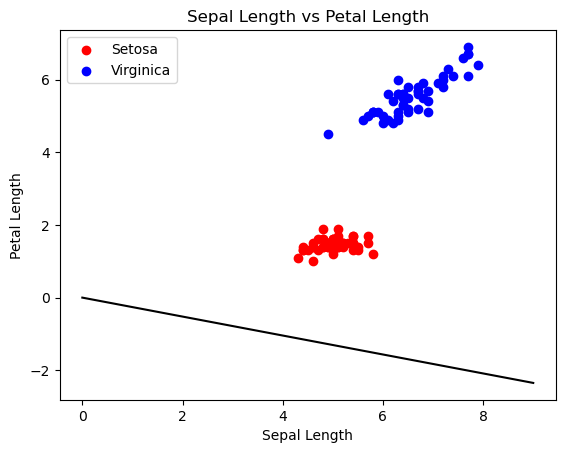

Iteration:  2
Weights:  [ 0.   4.8 18.4]


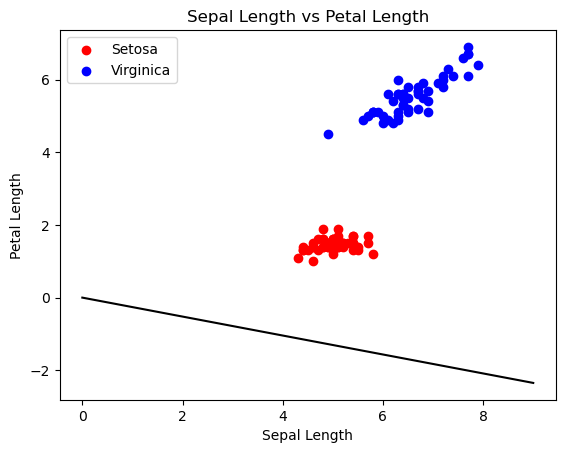

Iteration:  3
Weights:  [-2.  -2.4 23.8]


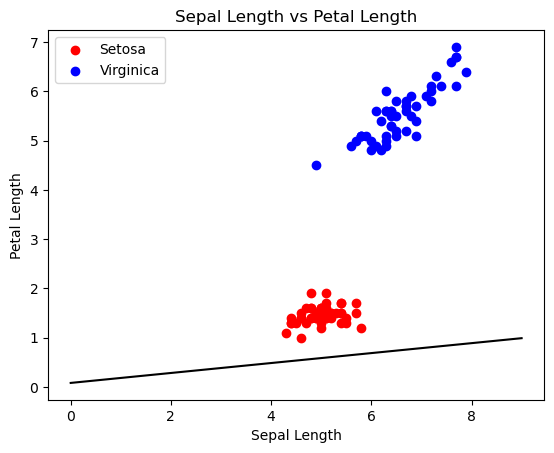

Iteration:  4
Weights:  [ -4.  -12.6  21. ]


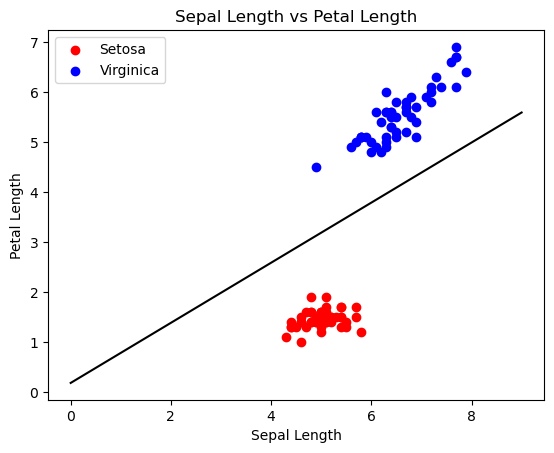

Iteration:  5
Weights:  [ -4.  -12.6  21. ]


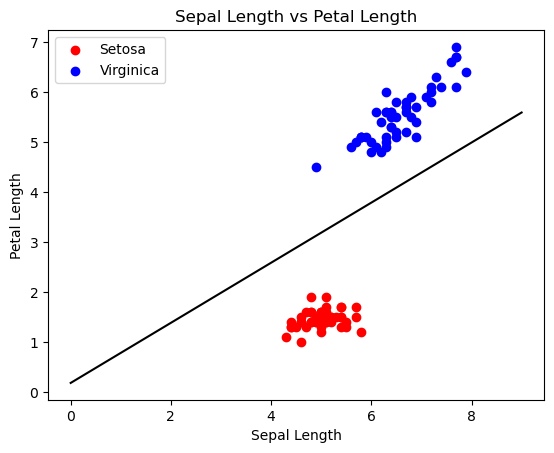

Iteration:  6
Weights:  [ -4.  -12.6  21. ]


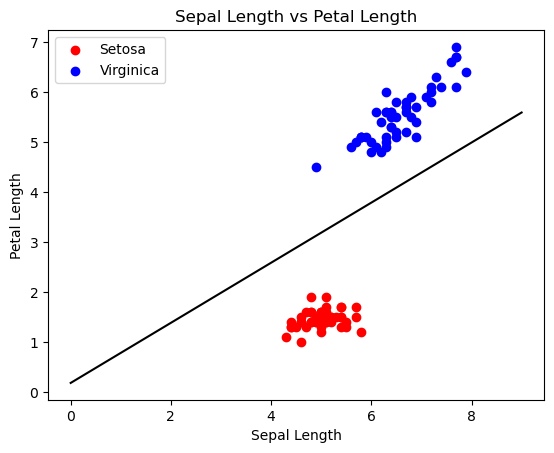

Iteration:  7
Weights:  [ -4.  -12.6  21. ]


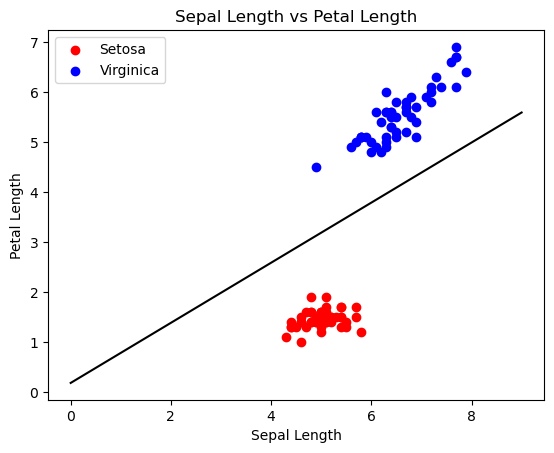

Iteration:  8
Weights:  [ -4.  -12.6  21. ]


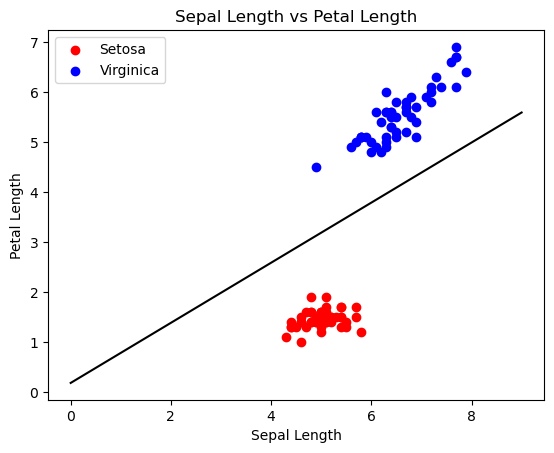

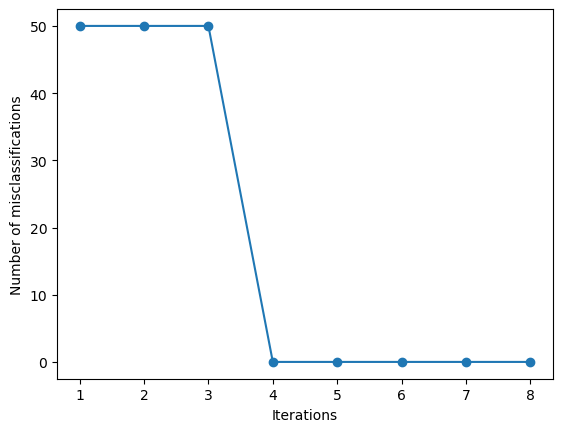

In [ ]:
n_iter=8
fit(n_iter, X, y)

# Coursework:

## Task 1:

Insted of using the Setosa and Virginica as in the tutorial, repeat the previous steps for classifying the Setosa  and Versicolor classes while using the same two features that where used previousely (petal length and sepal length). Include in your report:

- Plot the graph that shows the classes can be linearly seperable.
- Run the perceptron algorithm for specific number of iterations.
- Plot the misclassification error.
- Report the final weights for the classifier.
- Show the codes you modified in each task of the above in your report.

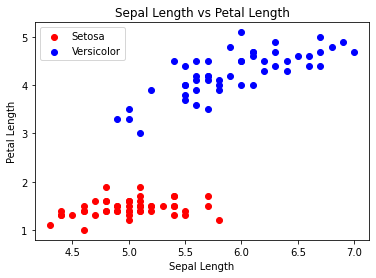

In [ ]:
# Plot the graph that shows the classes can be linearly seperable

# Setosa and Versicolor
# Consider two features; petal length and sepal length

# Include the labels for Setosa and Versicolor
setosa_label = iris_data.iloc[0:50,4].values
versicolor_label = iris_data.iloc[50:100,4].values
labels = np.concatenate((setosa_label,versicolor_label))

# From the original data Setosa is labelled as 0 and Versicolor is labelled as 1. 
# Setosa class has label -1 and 
# Versicolor has a label 1 

y = np.where(labels == 0, -1, 1)

# Consider the two features (petal length and sepal length only) for the Setosa and Versicolor
# Combine the features in one array.

X_setosa = iris_data.iloc[0:50, [0,2]]
X_versicolor = iris_data.iloc[50:100, [0,2]]
X = np.concatenate((X_setosa,X_versicolor))

# Plot the features in 2D plot such that 
# Sepal length feature is represented by x-axis 
# Petal length  is represented by y-axis

plt.scatter(X[:50,0],X[:50,1],color='red',marker='o',label='Setosa')
plt.scatter(X[50:100,0],X[50:100,1],color='blue',marker='o',label='Versicolor') 
plt.title("Sepal Length vs Petal Length")
plt.xlabel('Sepal Length')    
plt.ylabel('Petal Length')
plt.legend(loc='upper left')
plt.show()

Iteration:  1
Weights:  [0.  3.8 6.6]


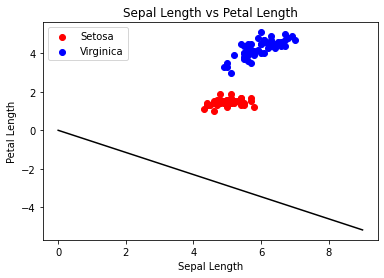

Iteration:  2
Weights:  [ 0.   7.6 13.2]


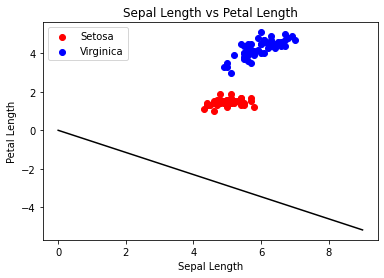

Iteration:  3
Weights:  [-2.   2.2 16.8]


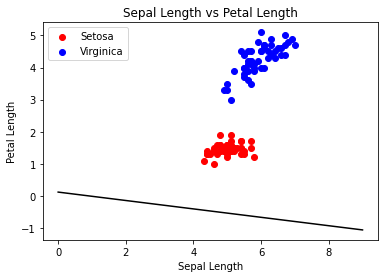

Iteration:  4
Weights:  [-2.   3.4 21. ]


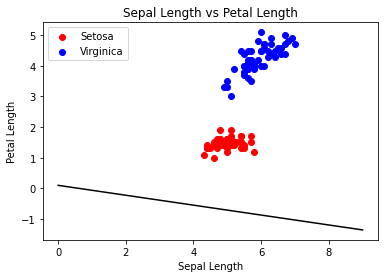

Iteration:  5
Weights:  [-4.  -6.8 18.2]


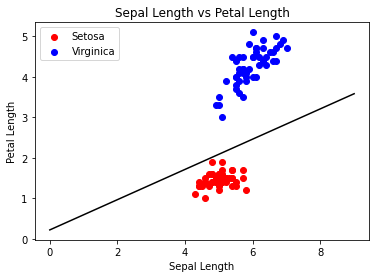

Iteration:  6
Weights:  [-4.  -6.8 18.2]


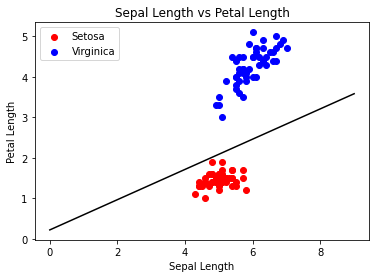

Iteration:  7
Weights:  [-4.  -6.8 18.2]


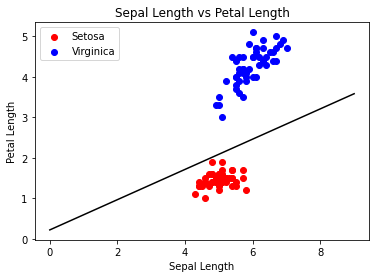

Iteration:  8
Weights:  [-4.  -6.8 18.2]


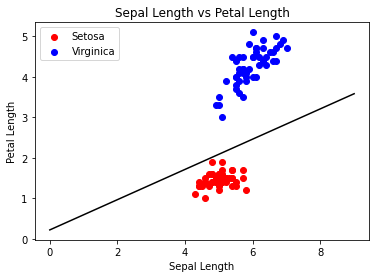

Iteration:  9
Weights:  [-4.  -6.8 18.2]


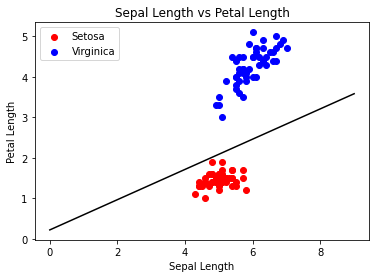

Iteration:  10
Weights:  [-4.  -6.8 18.2]


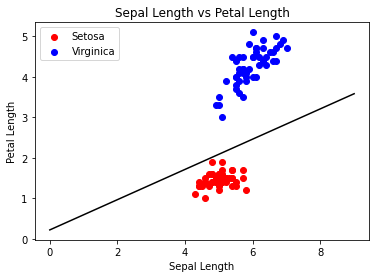

Iteration:  11
Weights:  [-4.  -6.8 18.2]


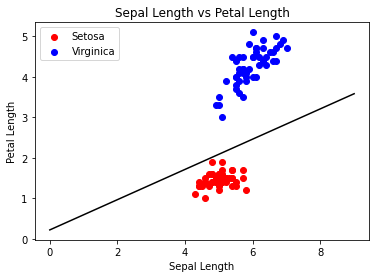

Iteration:  12
Weights:  [-4.  -6.8 18.2]


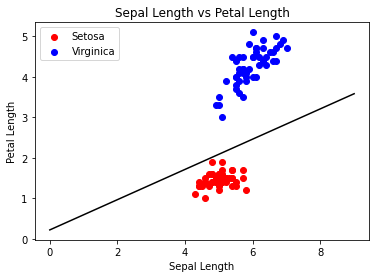

Iteration:  13
Weights:  [-4.  -6.8 18.2]


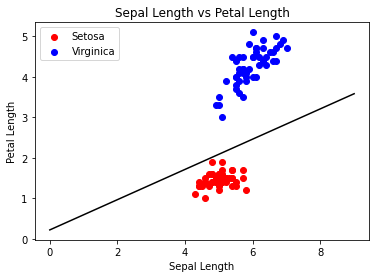

Iteration:  14
Weights:  [-4.  -6.8 18.2]


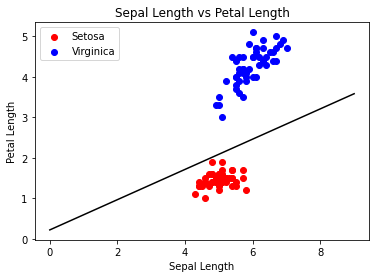

Iteration:  15
Weights:  [-4.  -6.8 18.2]


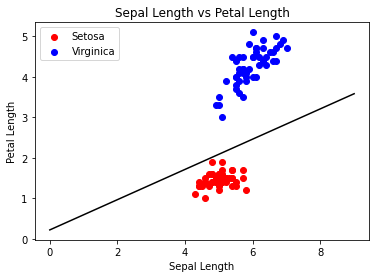

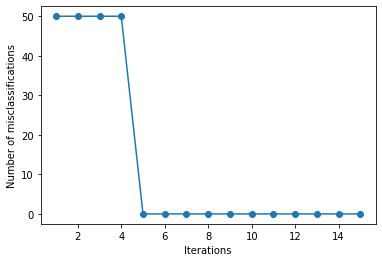

In [ ]:
# Run the perceptron algorithm for specific number of iterations
# Plot the misclassification error

n_iter=15
fit(n_iter, X, y)


---

**Report the final weights for the classifier.**
> Final weights: [-4.0, -6.9, 18.2]


---





## Task 2:

Consider now the Versicolor and Virginica classes while using the same two features that where used previousely (petal length and sepal length). Note: these classes are not linearly seperable, therefore the perceptron classifier cannot perfectly seperate the classes with a line as the case in the previous cases. Include in your report:

- Plot the graph that shows the classes are not linearly seperable.

- Revisit the code and adjust it such that it can choose the best iteration and weights according to the minimal misclassification error (this is called pocket algorithm). 

- Run the perceptron algorithm for specific number of iterations (*** Hint : choose larger number of iterations for this problem (e.g. 100).).

- Show how the decision boundary is changing while the weights are being updated.

- Plot the misclassification error.
- Report the best weights for the classifier.
- Show the codes you modified in each task of the above in your report.

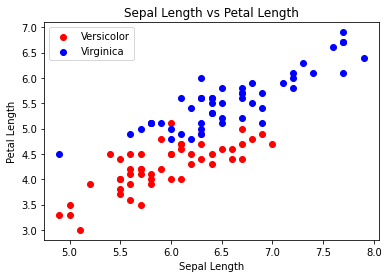

In [ ]:
# Plot the graph that shows the classes are not linearly seperable

# Versicolor and Virginica
# Consider two features; petal length and sepal length

# Include the labels for Versicolor and Virginica
labels = np.concatenate((versicolor_label, virginica_label))

# From the original data Versicolor is labelled as 1 and Virginica is labelled as 2
# Versicolor has a label 1 
# Virginica has a label -1

y = np.where(labels == 2, -1, 1)

# Consider the two features (petal length and sepal length only) for the Versicolor and Virginica
# Combine the features in one array.

X = np.concatenate((X_versicolor, X_virginica))

# Plot the features in 2D plot such that 
# Sepal length feature is represented by x-axis 
# Petal length  is represented by y-axis

plt.scatter(X[:50,0],X[:50,1],color='red',marker='o',label='Versicolor')
plt.scatter(X[50:100,0],X[50:100,1],color='blue',marker='o',label='Virginica') 
plt.title("Sepal Length vs Petal Length")
plt.xlabel('Sepal Length')    
plt.ylabel('Petal Length')
plt.legend(loc='upper left')
plt.show()



> Not linearly separable



In [ ]:
def plot_weights(weight):
    plt.plot(range(1, len(weight) + 1), weight, marker='o')
    plt.xlabel('Iterations')
    plt.ylabel('Weights')
    plt.show()  

def fit(n_iter, X, y):
        W = np.zeros(1 + X.shape[1])
        errors_ = []       
        weights0_ = [] 
        weights1_ = []
        weights2_ = []  
        for i in range(n_iter):
            for j, (xi, target) in enumerate(zip(X,y)):
                update = target - predict(W, xi)
                W[1:] += update*xi
                W[0] += update
            # errors on whole dataset 
            errors = 0
            for j, (xi, target) in enumerate(zip(X, y)):
                if predict(W, xi) != target:
                    errors += 1
            # -------------------------------------------
            errors_.append(errors) 
            i += 1
            print ("Iteration: ", i)
            weights0_.append(W[0])
            weights1_.append(W[1])
            weights2_.append(W[2])
            print("Weights: ", W)
            plot_boundary(W,X) #When weights are updated we plot the boundary
        plot_errors(errors_)
        plot_weights(weights0_)
        plot_weights(weights1_)
        plot_weights(weights2_)


Iteration:  1
Weights:  [ -2.  -12.6 -12. ]


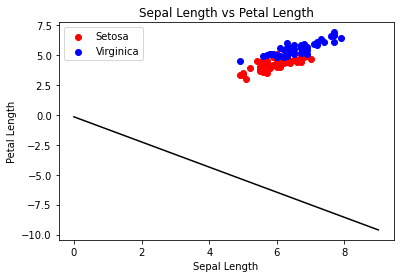

Iteration:  2
Weights:  [ 0.   1.6 -5.6]


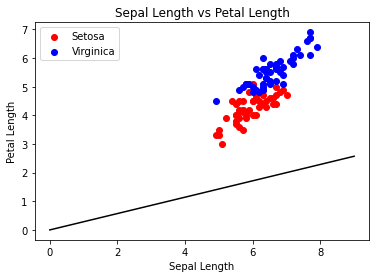

Iteration:  3
Weights:  [ 0.   3.  -8.2]


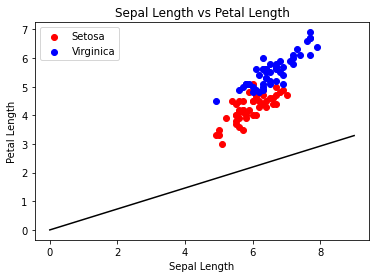

Iteration:  4
Weights:  [  0.    4.4 -10.8]


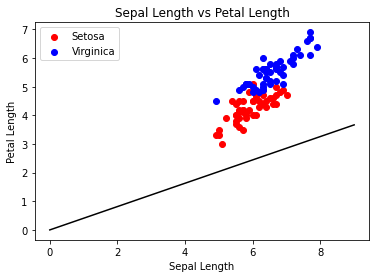

Iteration:  5
Weights:  [  0.    5.8 -13.4]


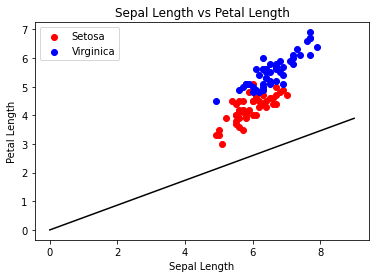

Iteration:  6
Weights:  [  0.    7.2 -16. ]


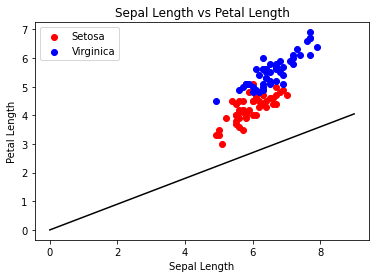

Iteration:  7
Weights:  [  0.    8.6 -18.6]


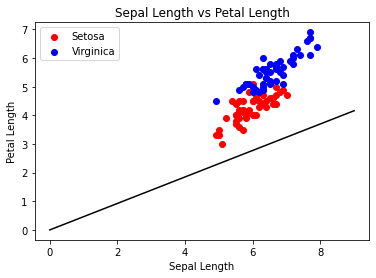

Iteration:  8
Weights:  [  0.   10.  -21.2]


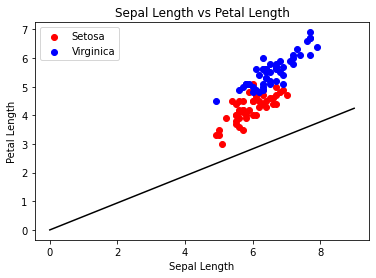

Iteration:  9
Weights:  [  0.   11.4 -23.8]


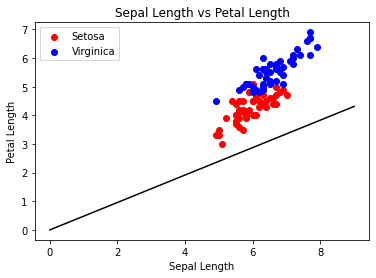

Iteration:  10
Weights:  [  0.   12.8 -26.4]


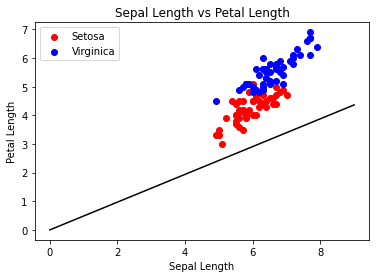

Iteration:  11
Weights:  [  0.   14.2 -29. ]


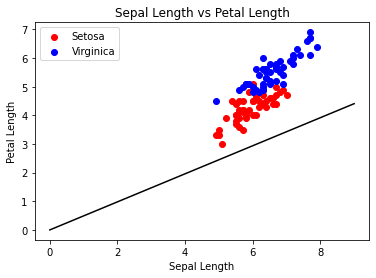

Iteration:  12
Weights:  [  0.   15.6 -31.6]


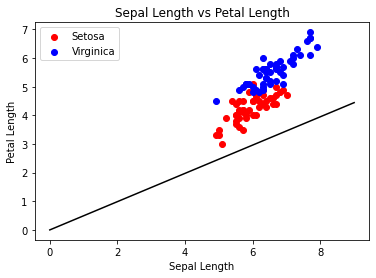

Iteration:  13
Weights:  [  0.   17.  -34.2]


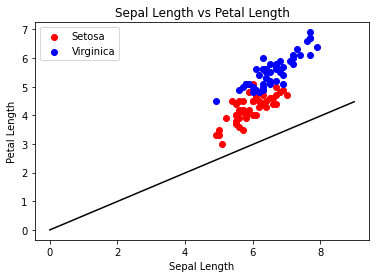

Iteration:  14
Weights:  [  0.   18.4 -36.8]


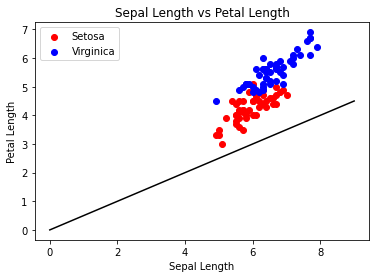

Iteration:  15
Weights:  [  0.   19.8 -39.4]


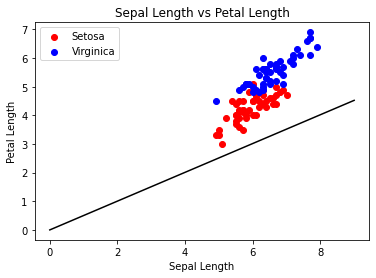

Iteration:  16
Weights:  [  0.   21.2 -42. ]


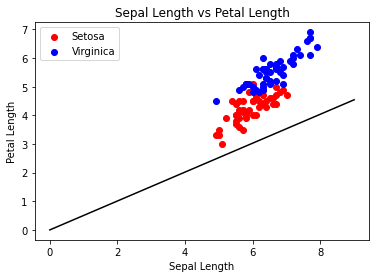

Iteration:  17
Weights:  [  0.   22.6 -44.6]


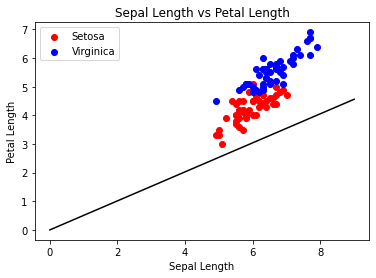

Iteration:  18
Weights:  [  0.   24.  -47.2]


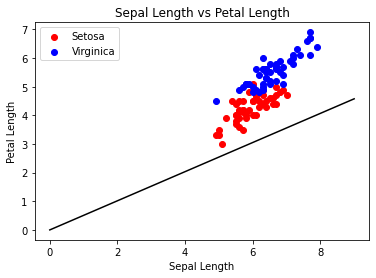

Iteration:  19
Weights:  [  0.   25.4 -49.8]


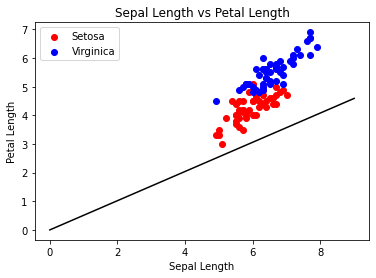

Iteration:  20
Weights:  [  0.   26.8 -52.4]


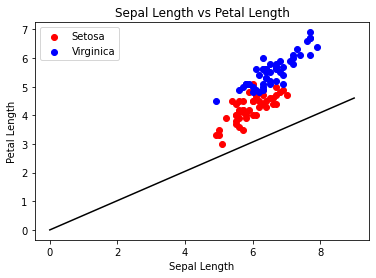

Iteration:  21
Weights:  [  0.   28.2 -55. ]


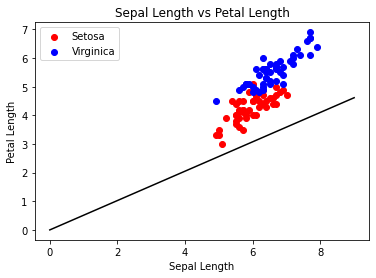

Iteration:  22
Weights:  [  0.   30.6 -55.8]


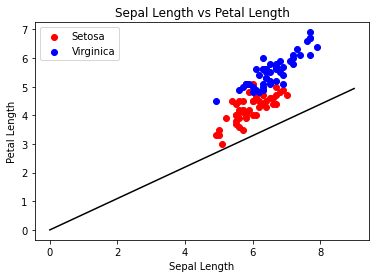

Iteration:  23
Weights:  [  0.   32.  -58.4]


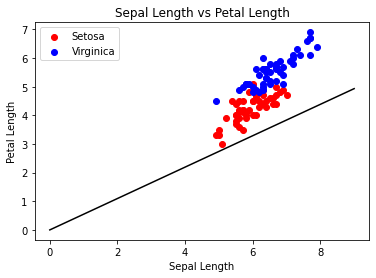

Iteration:  24
Weights:  [  0.   34.4 -59.2]


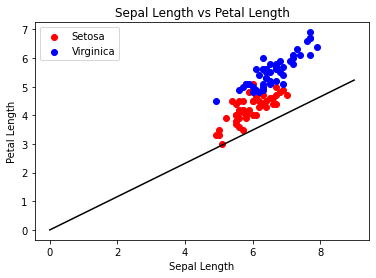

Iteration:  25
Weights:  [  0.   35.8 -61.8]


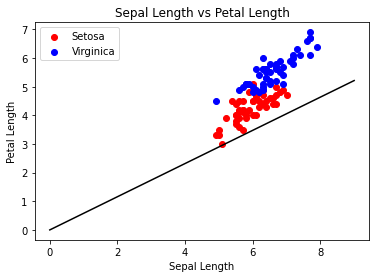

Iteration:  26
Weights:  [  0.   37.2 -64.4]


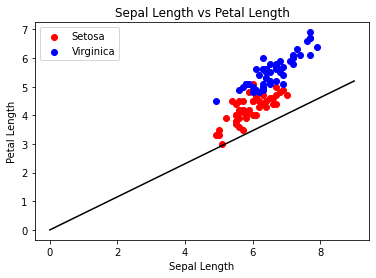

Iteration:  27
Weights:  [  0.   39.6 -65.2]


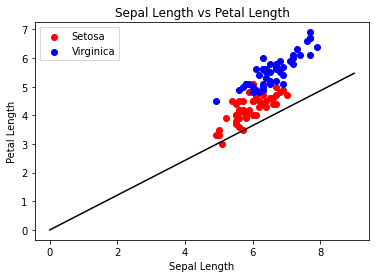

Iteration:  28
Weights:  [  0.   41.  -67.8]


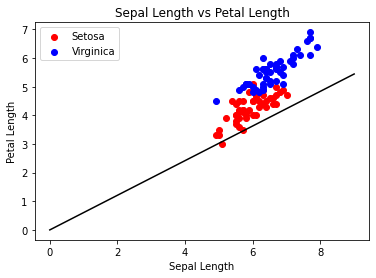

Iteration:  29
Weights:  [  0.   43.4 -68.6]


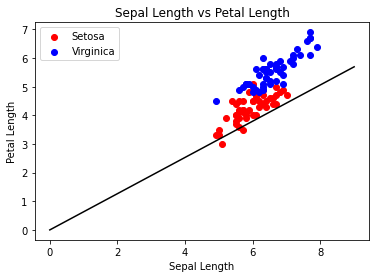

Iteration:  30
Weights:  [  0.   44.8 -71.2]


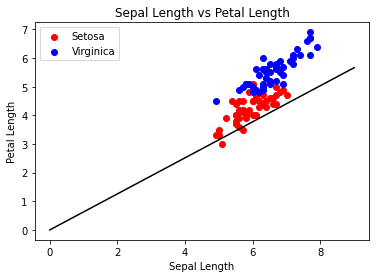

Iteration:  31
Weights:  [  0.   46.2 -73.8]


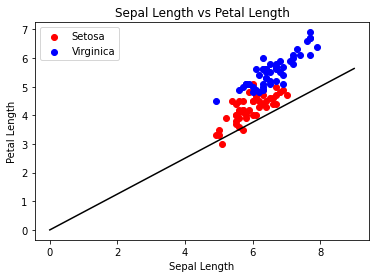

Iteration:  32
Weights:  [  0.   48.6 -74.6]


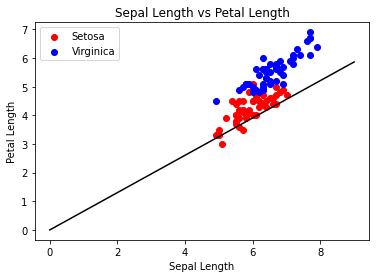

Iteration:  33
Weights:  [  0.   50.  -77.2]


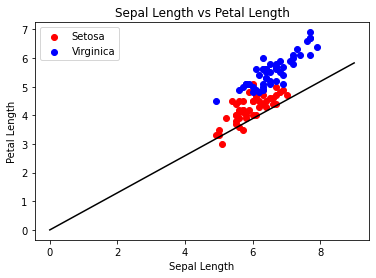

Iteration:  34
Weights:  [  0.   52.4 -78. ]


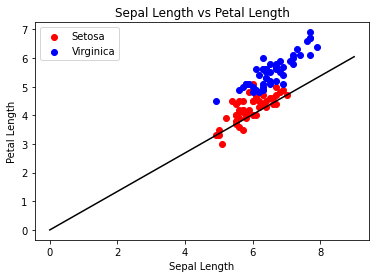

Iteration:  35
Weights:  [  0.   53.6 -79.2]


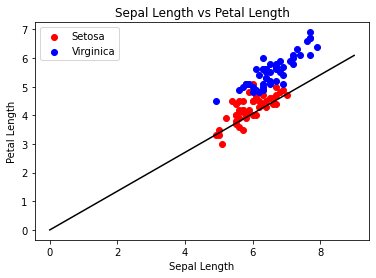

Iteration:  36
Weights:  [  0.   54.8 -80.4]


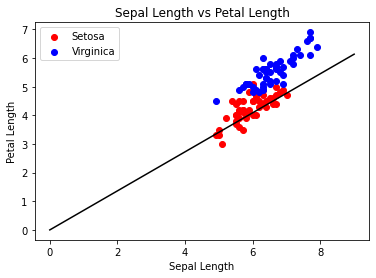

Iteration:  37
Weights:  [  0.   56.  -81.6]


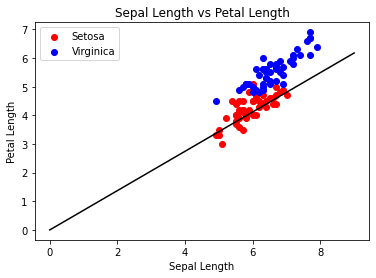

Iteration:  38
Weights:  [  0.   57.2 -82.8]


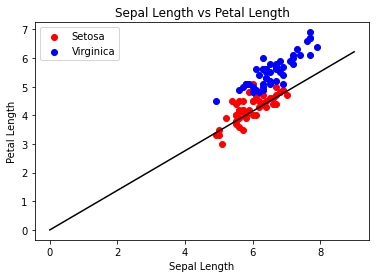

Iteration:  39
Weights:  [  0.   57.4 -85.8]


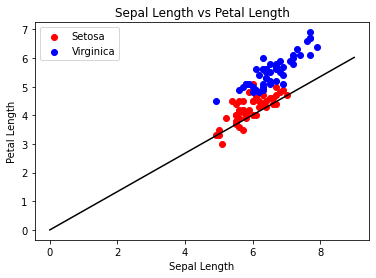

Iteration:  40
Weights:  [  0.   59.8 -86.6]


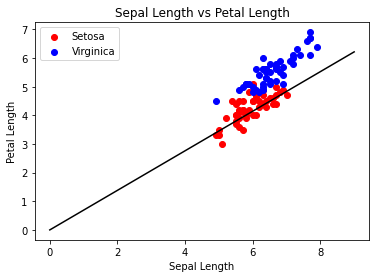

Iteration:  41
Weights:  [  0.   61.  -87.8]


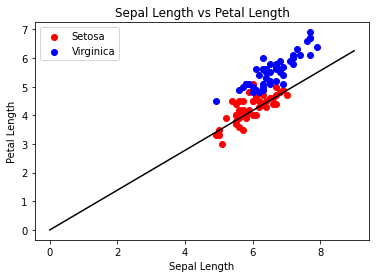

Iteration:  42
Weights:  [  0.   62.2 -89. ]


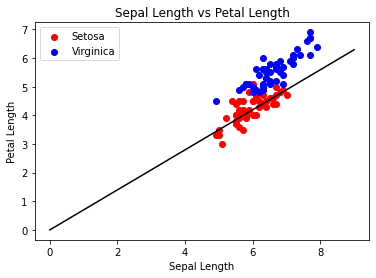

Iteration:  43
Weights:  [  0.   63.4 -90.2]


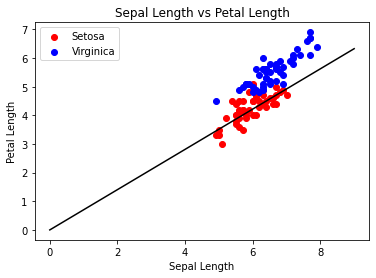

Iteration:  44
Weights:  [  0.   64.6 -91.4]


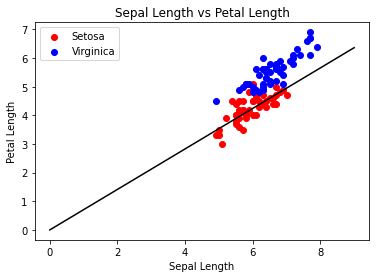

Iteration:  45
Weights:  [  0.   65.8 -93.6]


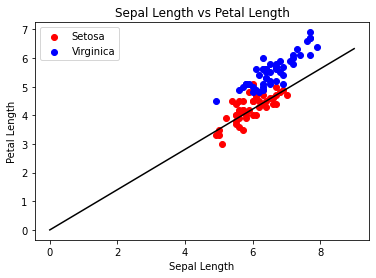

Iteration:  46
Weights:  [  0.   67.  -94.8]


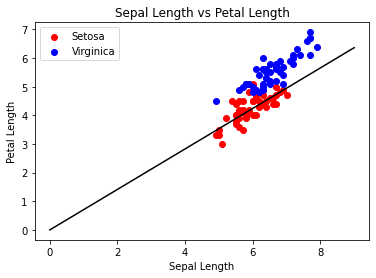

Iteration:  47
Weights:  [  0.   68.2 -97. ]


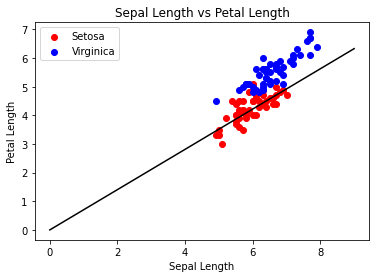

Iteration:  48
Weights:  [  0.   69.4 -98.2]


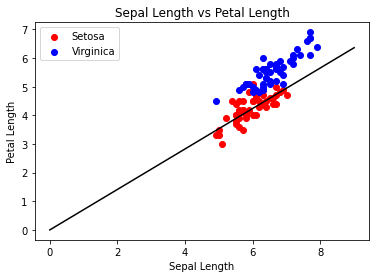

Iteration:  49
Weights:  [  0.   71.6 -98.6]


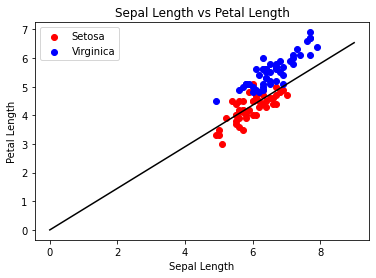

Iteration:  50
Weights:  [   0.    71.  -100.8]


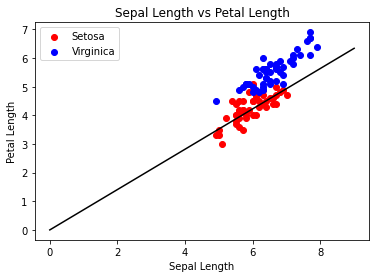

Iteration:  51
Weights:  [   0.    73.2 -101.2]


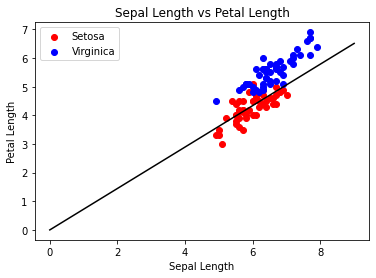

Iteration:  52
Weights:  [   0.    72.6 -103.4]


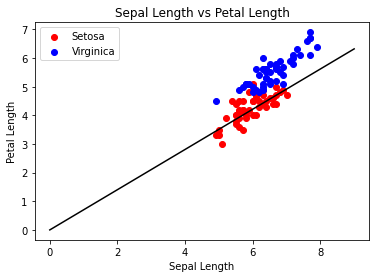

Iteration:  53
Weights:  [   0.    73.8 -104.6]


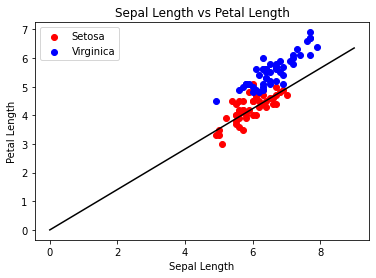

Iteration:  54
Weights:  [   0.   76. -105.]


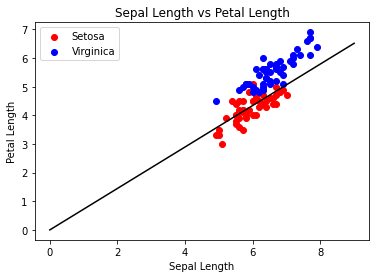

Iteration:  55
Weights:  [   0.    75.4 -107.2]


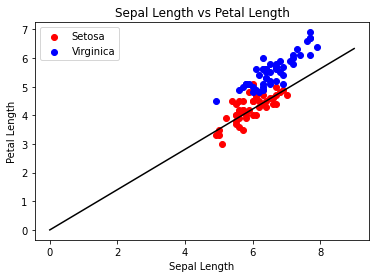

Iteration:  56
Weights:  [   0.    77.6 -107.6]


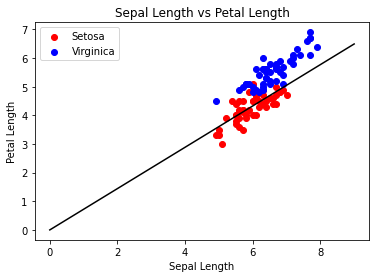

Iteration:  57
Weights:  [   0.    77.  -109.8]


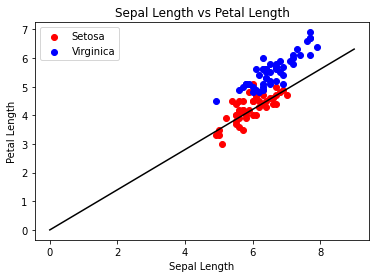

Iteration:  58
Weights:  [   0.    78.2 -111. ]


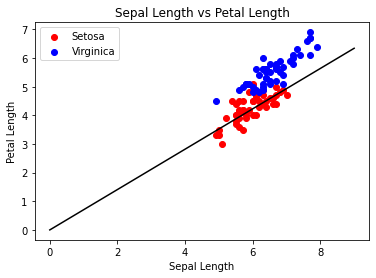

Iteration:  59
Weights:  [   0.    80.4 -111.4]


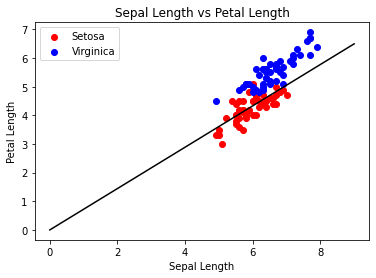

Iteration:  60
Weights:  [   0.    79.8 -113.6]


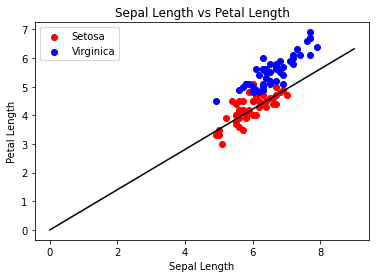

Iteration:  61
Weights:  [   0.    81.  -114.8]


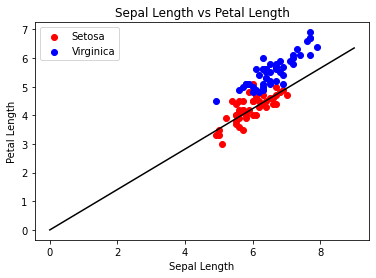

Iteration:  62
Weights:  [   0.    83.2 -115.2]


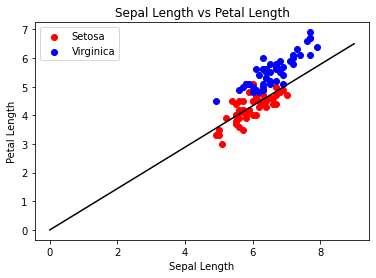

Iteration:  63
Weights:  [   0.    82.6 -117.4]


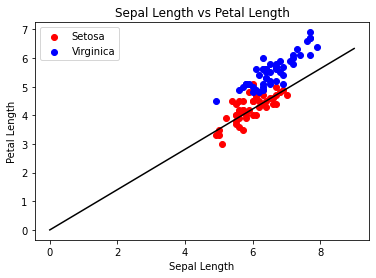

Iteration:  64
Weights:  [   0.    84.8 -117.8]


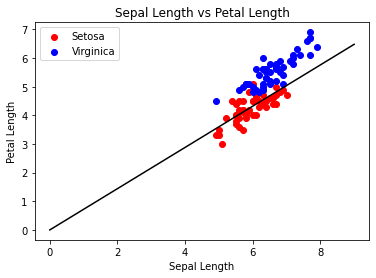

Iteration:  65
Weights:  [   0.    81.6 -121.6]


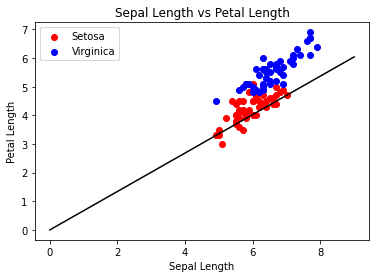

Iteration:  66
Weights:  [   0.    81.4 -124. ]


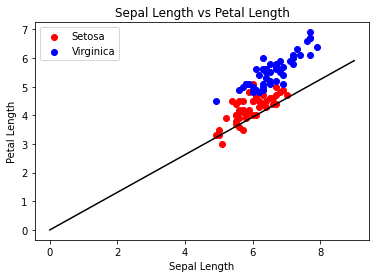

Iteration:  67
Weights:  [   0.    81.8 -126.6]


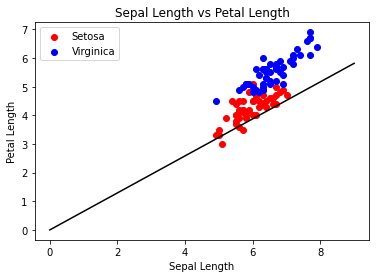

Iteration:  68
Weights:  [   0.    82.2 -129.2]


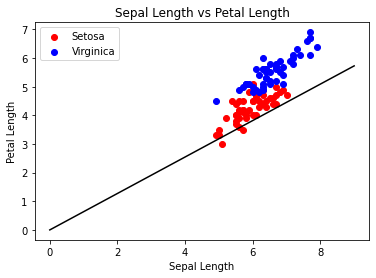

Iteration:  69
Weights:  [   0.    82.8 -132. ]


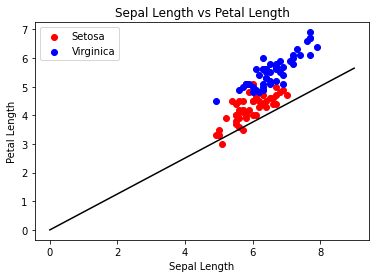

Iteration:  70
Weights:  [   0.    81.6 -135.8]


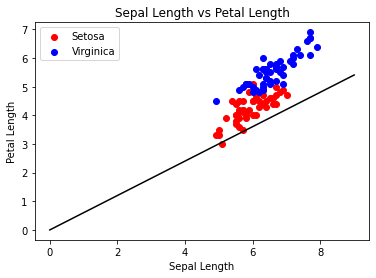

Iteration:  71
Weights:  [   0.    81.6 -137.8]


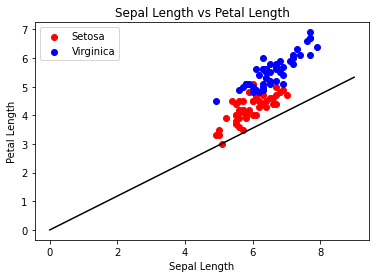

Iteration:  72
Weights:  [   2.    95.4 -129.6]


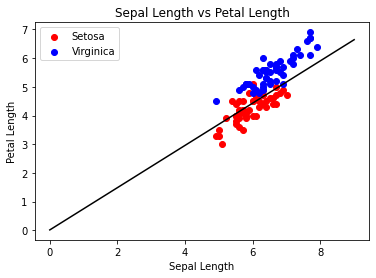

Iteration:  73
Weights:  [   2.    95.2 -130.8]


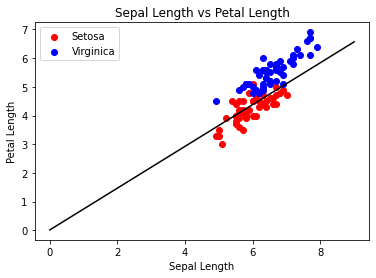

Iteration:  74
Weights:  [   2.   95. -132.]


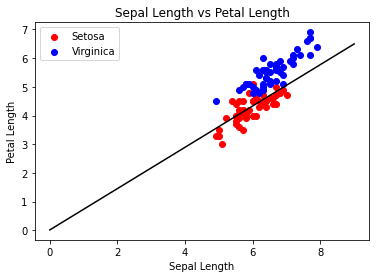

Iteration:  75
Weights:  [   2.    91.8 -135.8]


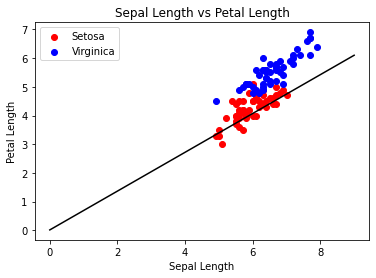

Iteration:  76
Weights:  [   2.    91.  -138.8]


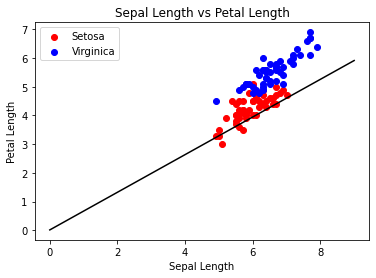

Iteration:  77
Weights:  [   2.    91.4 -141.4]


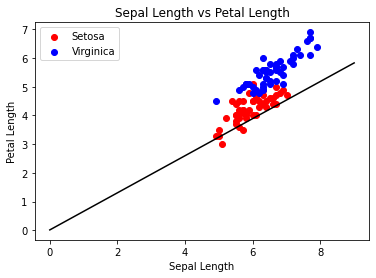

Iteration:  78
Weights:  [   2.    92.  -144.2]


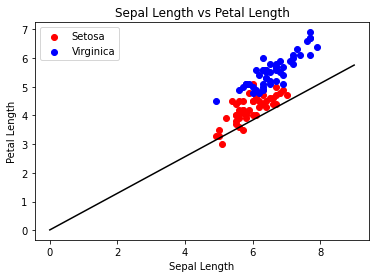

Iteration:  79
Weights:  [   2.    93.  -145.8]


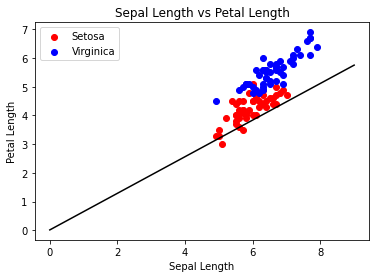

Iteration:  80
Weights:  [   2.    94.  -147.4]


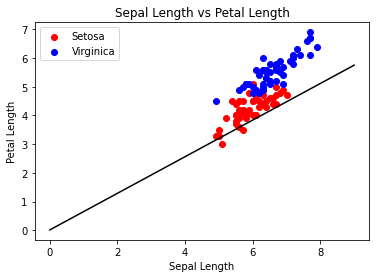

Iteration:  81
Weights:  [   2.    95.2 -149. ]


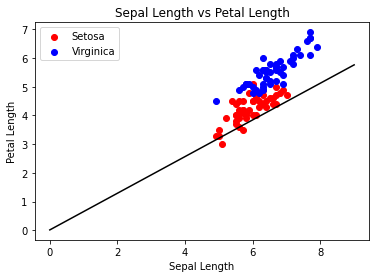

Iteration:  82
Weights:  [   2.    96.4 -150.6]


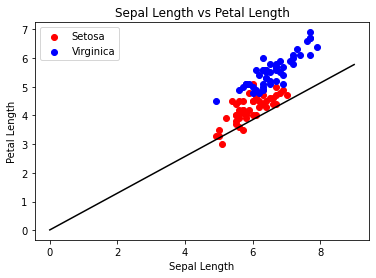

Iteration:  83
Weights:  [   2.    97.6 -152.2]


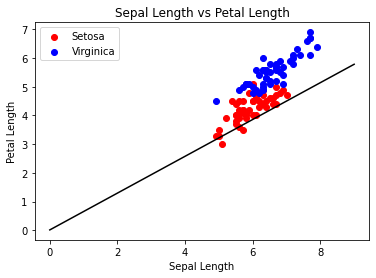

Iteration:  84
Weights:  [   2.    98.8 -153.8]


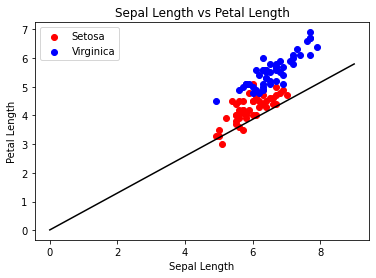

Iteration:  85
Weights:  [   2.   100.2 -155.2]


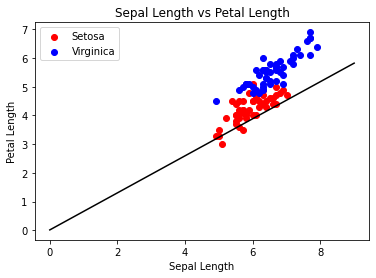

Iteration:  86
Weights:  [   2.   101.4 -156.8]


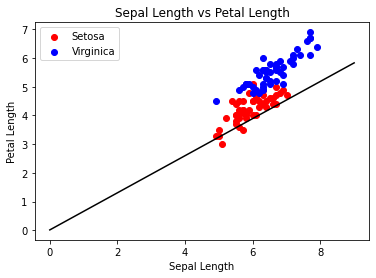

Iteration:  87
Weights:  [   2.   102.6 -158.4]


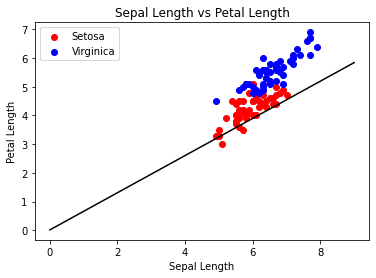

Iteration:  88
Weights:  [   2.   103.8 -160. ]


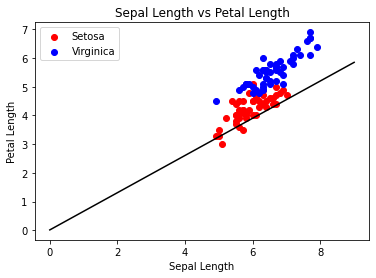

Iteration:  89
Weights:  [   2.   105.  -161.6]


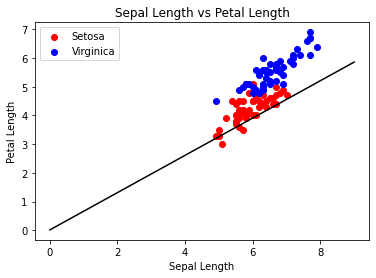

Iteration:  90
Weights:  [   2.   106.2 -163.2]


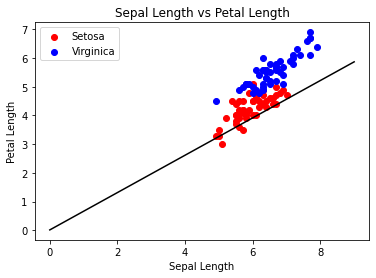

Iteration:  91
Weights:  [   2.   107.4 -164.8]


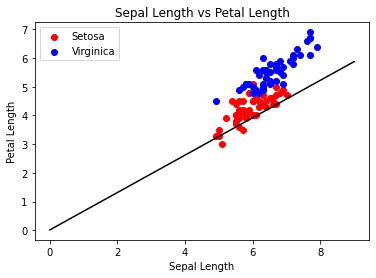

Iteration:  92
Weights:  [   2.   108.6 -166.4]


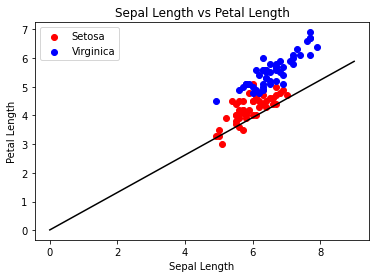

Iteration:  93
Weights:  [   2.   110.  -167.8]


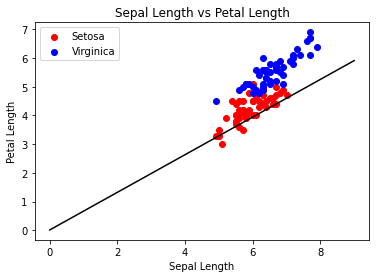

Iteration:  94
Weights:  [   2.   111.2 -169.4]


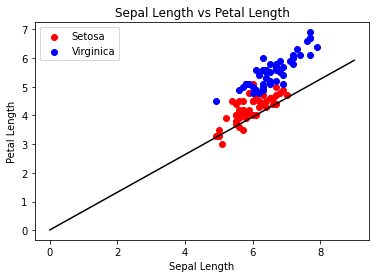

Iteration:  95
Weights:  [   2.   112.4 -171. ]


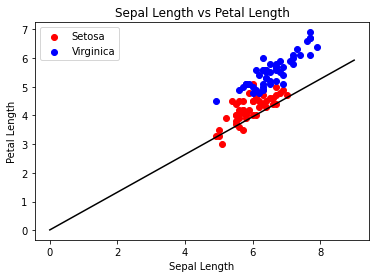

Iteration:  96
Weights:  [   2.   113.6 -172.6]


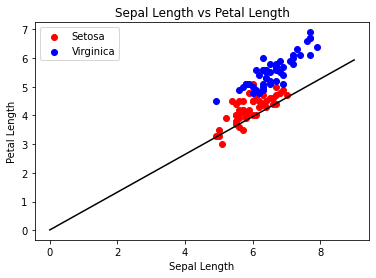

Iteration:  97
Weights:  [   2.   114.8 -174.2]


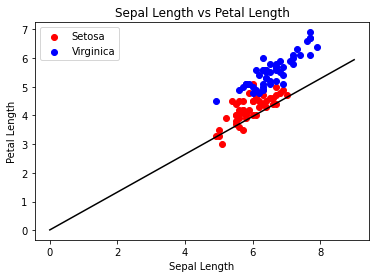

Iteration:  98
Weights:  [   2.   116.  -175.8]


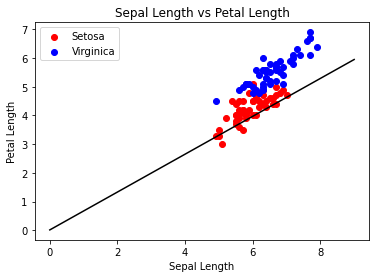

Iteration:  99
Weights:  [   2.   117.2 -177.4]


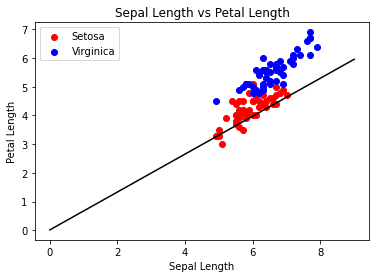

Iteration:  100
Weights:  [   2.   118.4 -179. ]


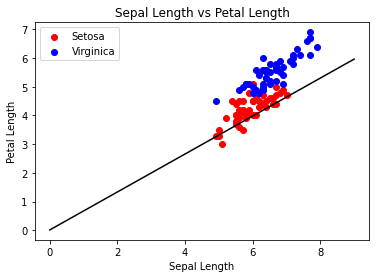

Iteration:  101
Weights:  [   2.   119.8 -180.4]


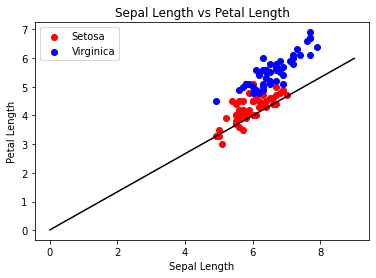

Iteration:  102
Weights:  [   2.  121. -182.]


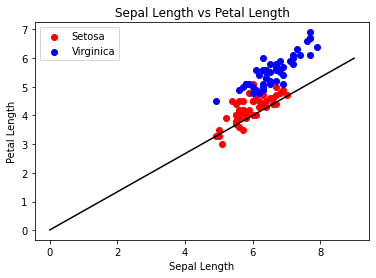

Iteration:  103
Weights:  [   2.   122.2 -183.6]


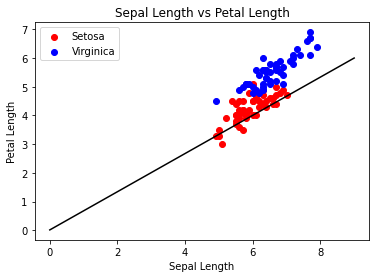

Iteration:  104
Weights:  [   2.   123.4 -185.2]


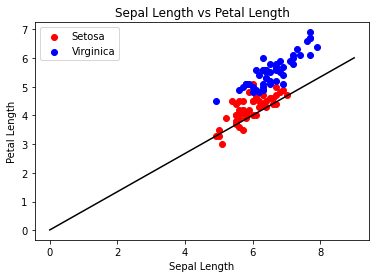

Iteration:  105
Weights:  [   2.   124.6 -186.8]


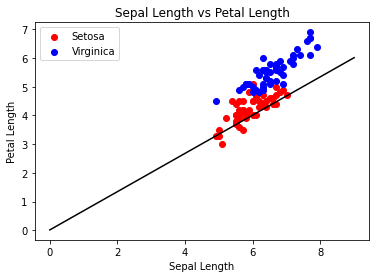

Iteration:  106
Weights:  [   2.   125.8 -188.4]


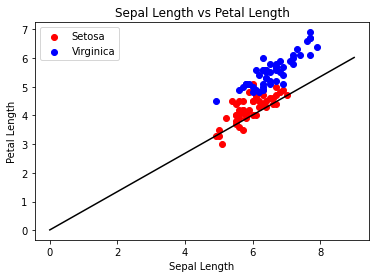

Iteration:  107
Weights:  [   2.  127. -190.]


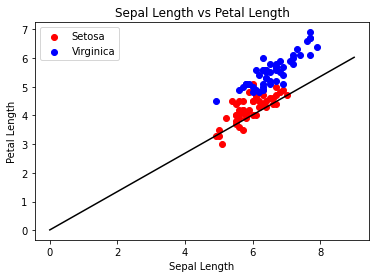

Iteration:  108
Weights:  [   2.   128.2 -191.6]


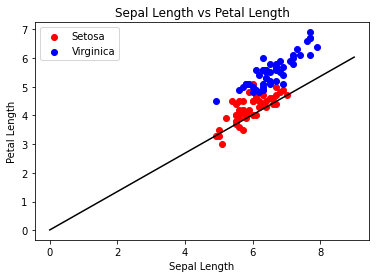

Iteration:  109
Weights:  [   2.   129.6 -193. ]


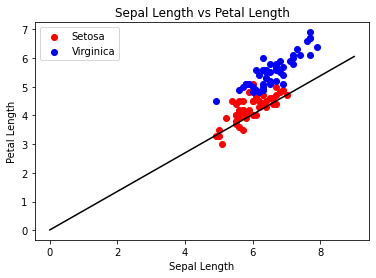

Iteration:  110
Weights:  [   2.   128.4 -195.4]


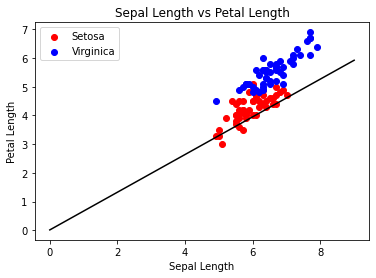

Iteration:  111
Weights:  [   2.   125.8 -199. ]


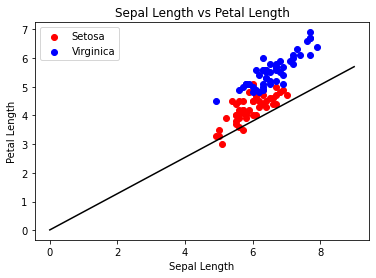

Iteration:  112
Weights:  [   4.   137.6 -192.6]


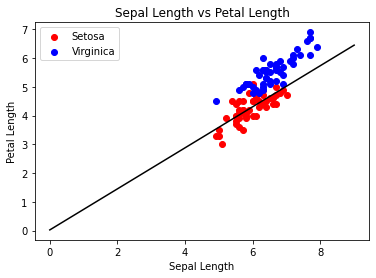

Iteration:  113
Weights:  [   4.   135.8 -195.4]


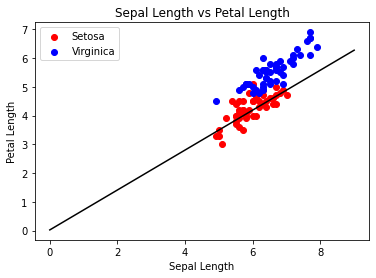

Iteration:  114
Weights:  [   4.   135.2 -197.8]


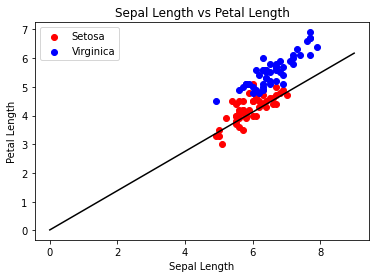

Iteration:  115
Weights:  [   4.   135.  -199.8]


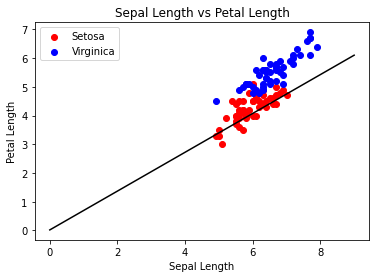

Iteration:  116
Weights:  [   4.   133.8 -202.2]


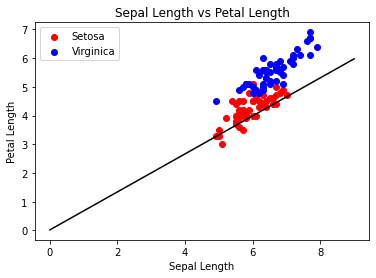

Iteration:  117
Weights:  [   4.   131.2 -205.8]


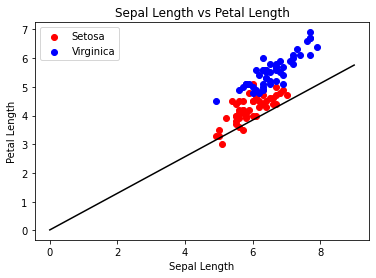

Iteration:  118
Weights:  [   6.   143.  -199.4]


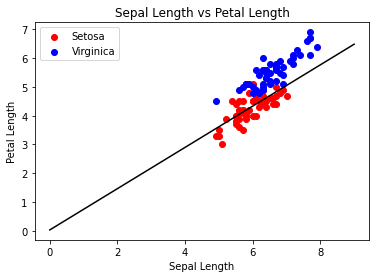

Iteration:  119
Weights:  [   6.   141.2 -202.2]


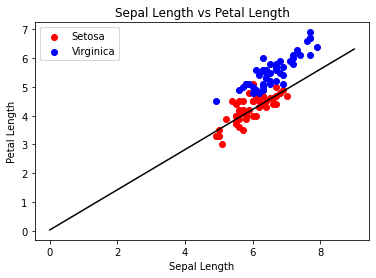

Iteration:  120
Weights:  [   6.   141.2 -204. ]


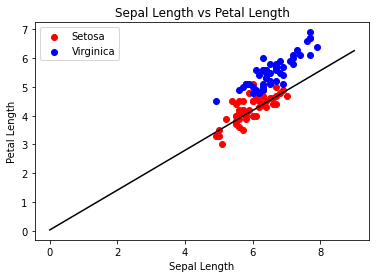

Iteration:  121
Weights:  [   6.   140.6 -206.4]


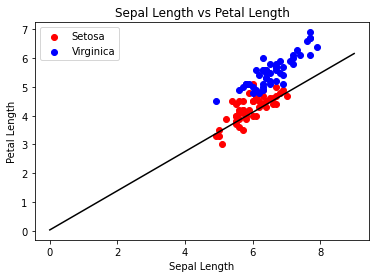

Iteration:  122
Weights:  [   6.   140.6 -208.4]


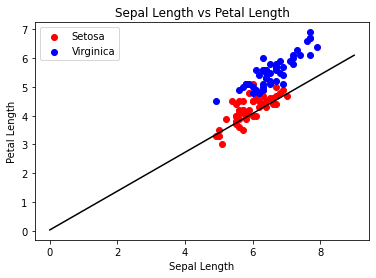

Iteration:  123
Weights:  [   6.   136.8 -212.4]


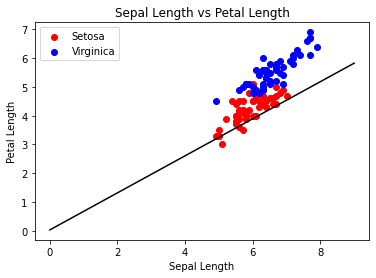

Iteration:  124
Weights:  [   8.   147.4 -207.6]


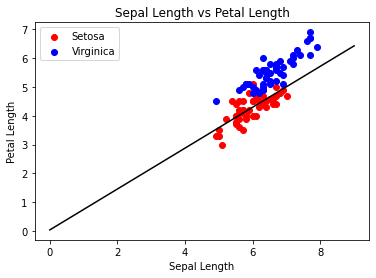

Iteration:  125
Weights:  [   8.  145. -211.]


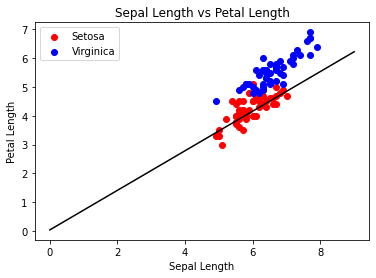

Iteration:  126
Weights:  [   8.   144.8 -213. ]


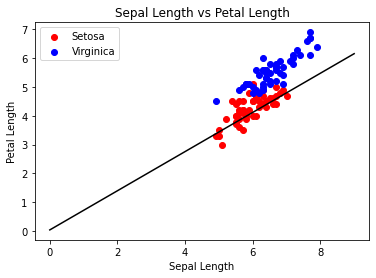

Iteration:  127
Weights:  [   8.  141. -217.]


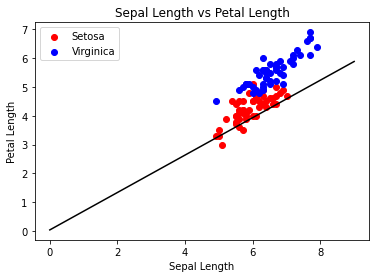

Iteration:  128
Weights:  [  10.   151.6 -212.2]


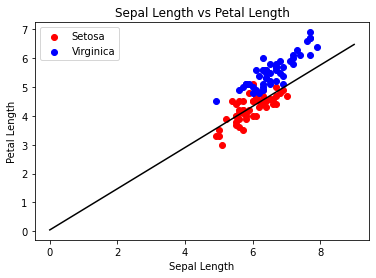

Iteration:  129
Weights:  [  10.   149.8 -215. ]


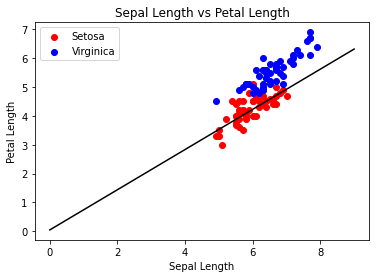

Iteration:  130
Weights:  [  10.   150.8 -216. ]


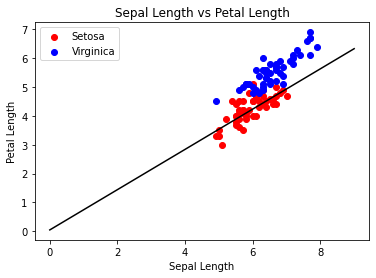

Iteration:  131
Weights:  [  10.   151.8 -217. ]


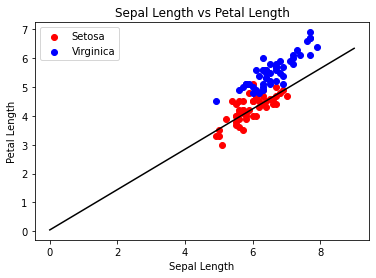

Iteration:  132
Weights:  [  10.   152.8 -218. ]


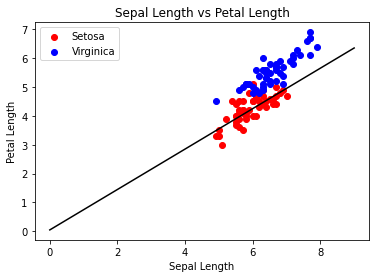

Iteration:  133
Weights:  [  10.   153.8 -219. ]


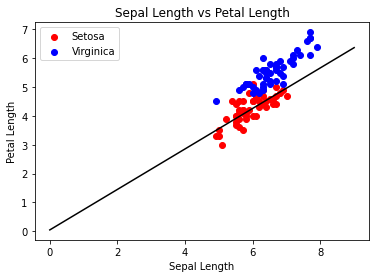

Iteration:  134
Weights:  [  10.   154.8 -220. ]


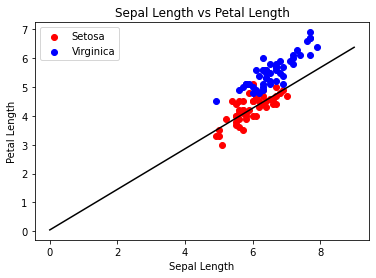

Iteration:  135
Weights:  [  10.   152.8 -223. ]


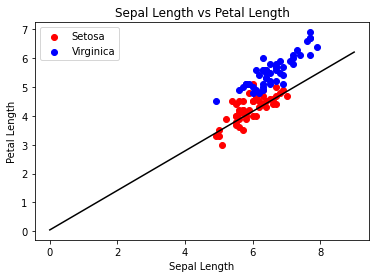

Iteration:  136
Weights:  [  10.  149. -227.]


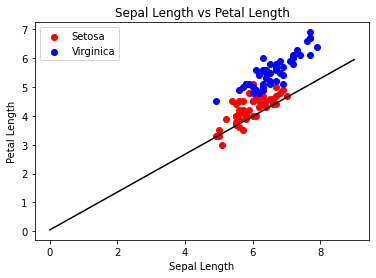

Iteration:  137
Weights:  [  12.   160.6 -220.4]


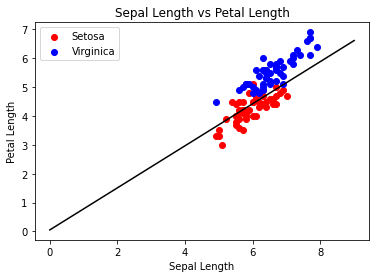

Iteration:  138
Weights:  [  12.   159.4 -221.6]


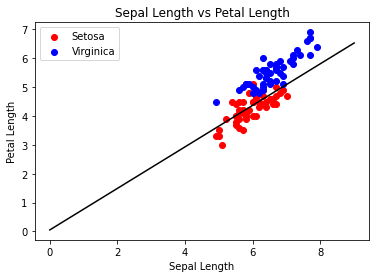

Iteration:  139
Weights:  [  12.   158.2 -222.8]


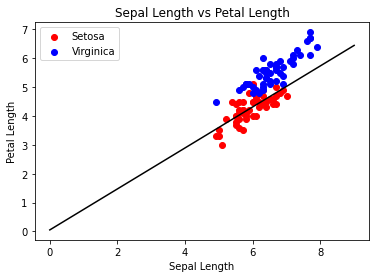

Iteration:  140
Weights:  [  12.   155.8 -226.2]


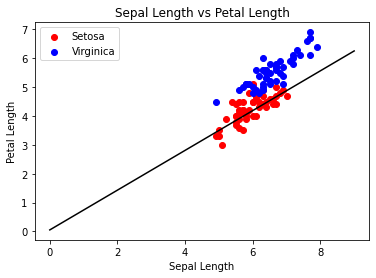

Iteration:  141
Weights:  [  12.   152.  -230.2]


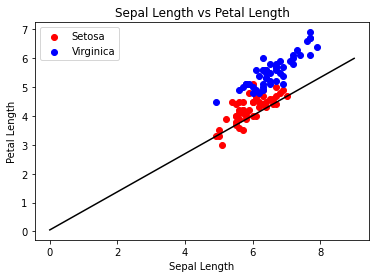

Iteration:  142
Weights:  [  14.   163.2 -223.6]


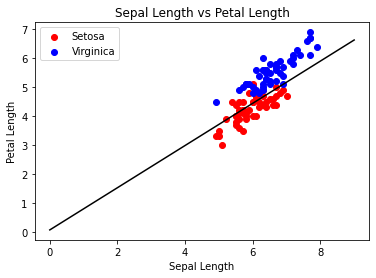

Iteration:  143
Weights:  [  14.   162.  -224.8]


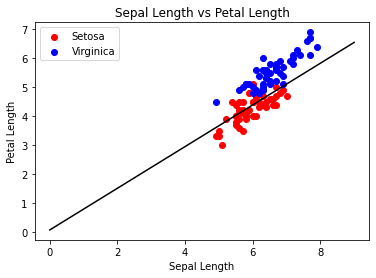

Iteration:  144
Weights:  [  14.   160.8 -226. ]


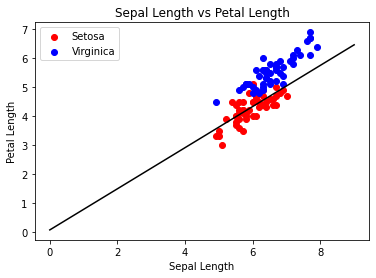

Iteration:  145
Weights:  [  14.   158.4 -229.4]


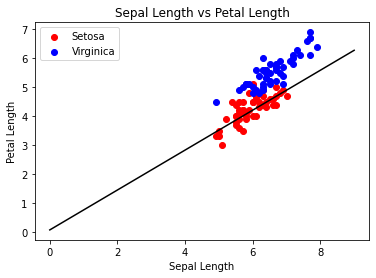

Iteration:  146
Weights:  [  14.   154.4 -233.4]


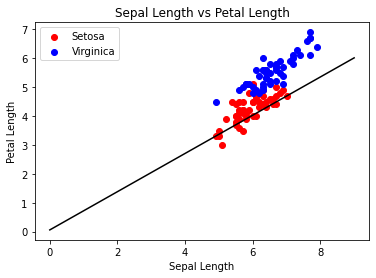

Iteration:  147
Weights:  [  14.   151.8 -237. ]


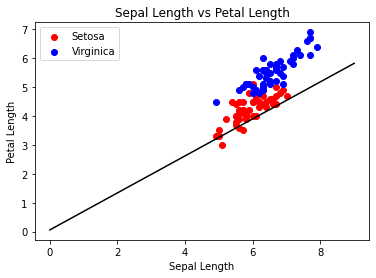

Iteration:  148
Weights:  [  16.   164.6 -228.8]


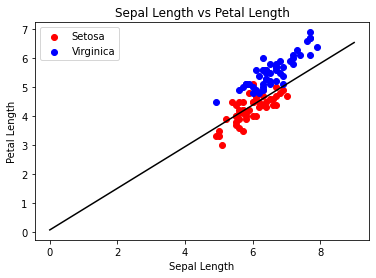

Iteration:  149
Weights:  [  16.   163.4 -230. ]


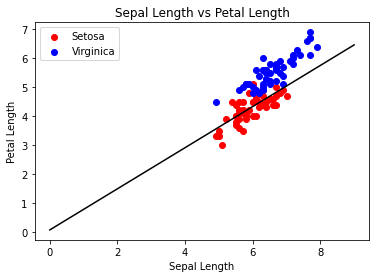

Iteration:  150
Weights:  [  16.   161.  -233.4]


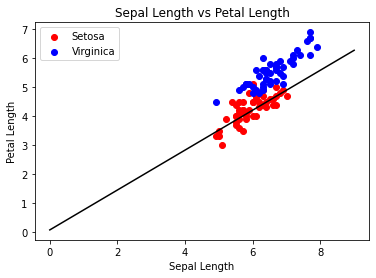

Iteration:  151
Weights:  [  16.   157.2 -237.4]


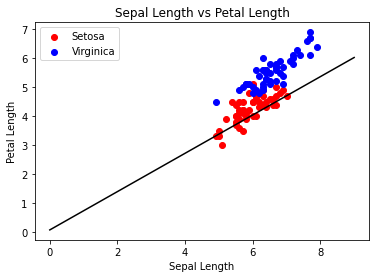

Iteration:  152
Weights:  [  18.   167.6 -231.2]


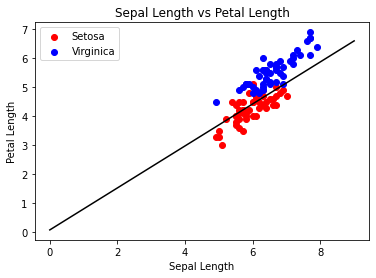

Iteration:  153
Weights:  [  18.   166.4 -232.4]


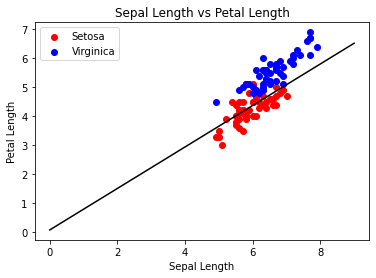

Iteration:  154
Weights:  [  18.   165.  -234.2]


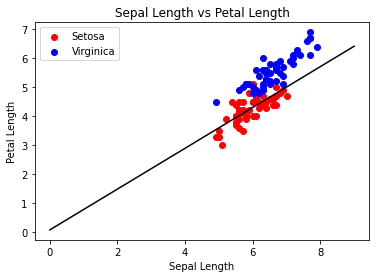

Iteration:  155
Weights:  [  18.   162.6 -237.6]


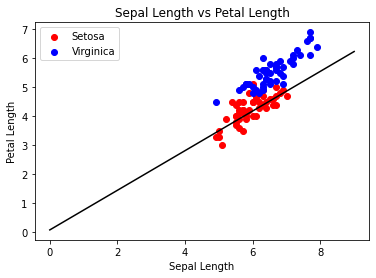

Iteration:  156
Weights:  [  18.   158.8 -241.6]


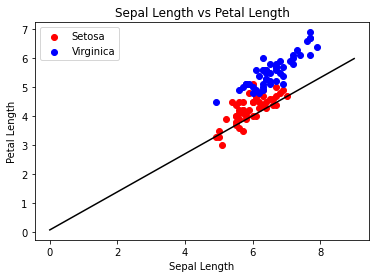

Iteration:  157
Weights:  [  20.   170.4 -235. ]


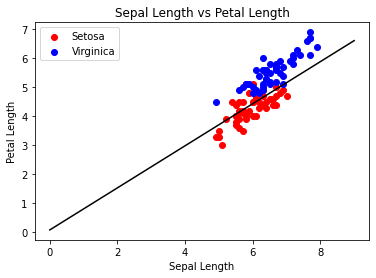

Iteration:  158
Weights:  [  20.   169.2 -236.2]


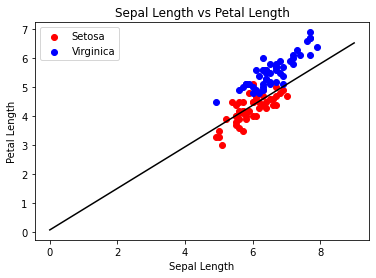

Iteration:  159
Weights:  [  20.   167.8 -238. ]


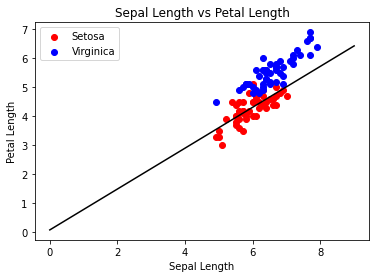

Iteration:  160
Weights:  [  20.  162. -243.]


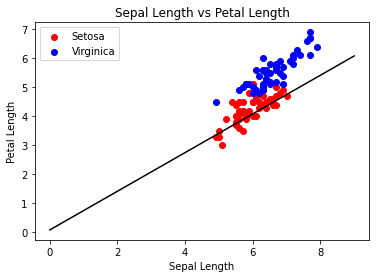

Iteration:  161
Weights:  [  20.   158.6 -247. ]


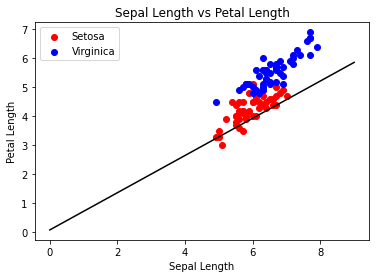

Iteration:  162
Weights:  [  22.   171.4 -238.8]


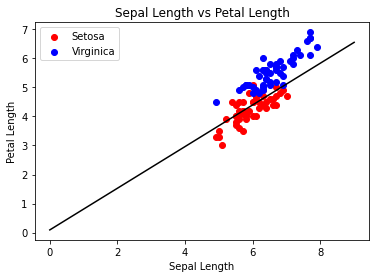

Iteration:  163
Weights:  [  22.   170.  -240.6]


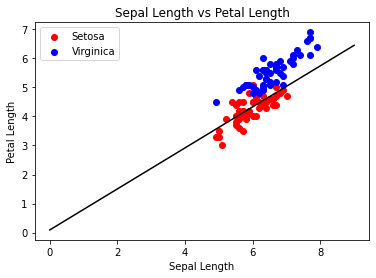

Iteration:  164
Weights:  [  22.   167.6 -244. ]


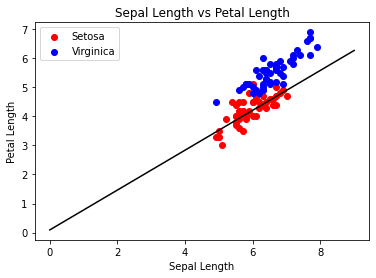

Iteration:  165
Weights:  [  22.   163.8 -248. ]


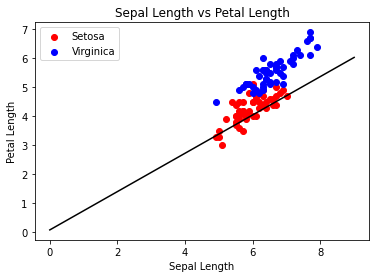

Iteration:  166
Weights:  [  24.   174.2 -241.8]


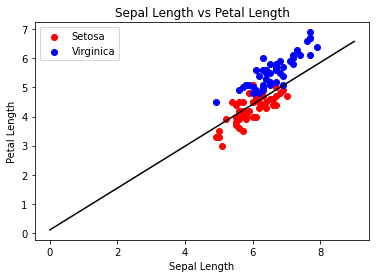

Iteration:  167
Weights:  [  24.  173. -243.]


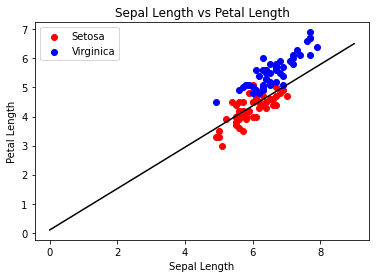

Iteration:  168
Weights:  [  24.   171.6 -244.8]


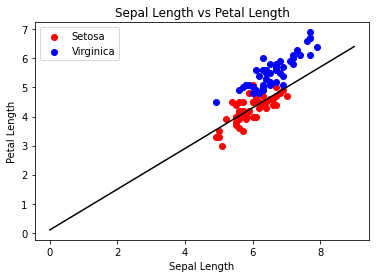

Iteration:  169
Weights:  [  24.   165.8 -249.8]


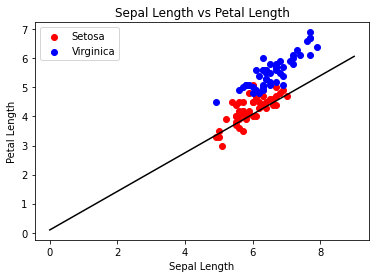

Iteration:  170
Weights:  [  26.   176.2 -243.6]


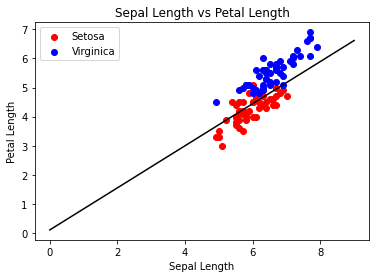

Iteration:  171
Weights:  [  26.   175.  -244.8]


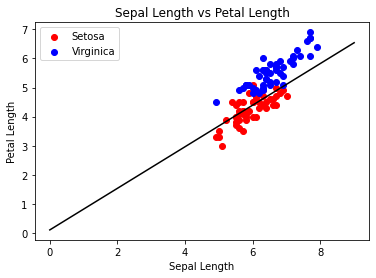

Iteration:  172
Weights:  [  26.   173.6 -246.6]


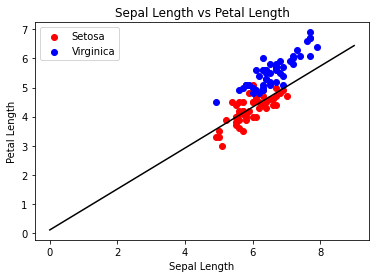

Iteration:  173
Weights:  [  26.   167.8 -251.6]


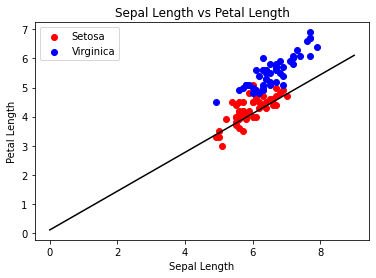

Iteration:  174
Weights:  [  26.   164.4 -255.6]


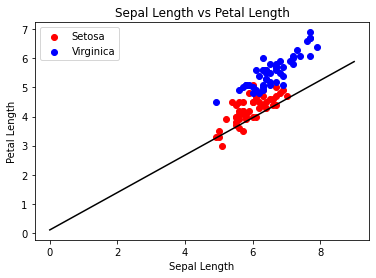

Iteration:  175
Weights:  [  28.   177.2 -247.4]


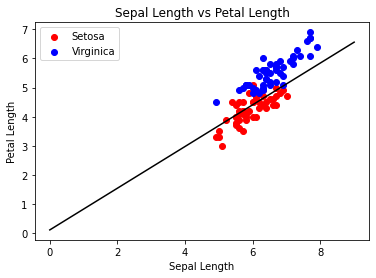

Iteration:  176
Weights:  [  28.   175.8 -249.2]


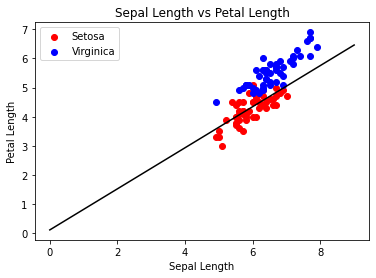

Iteration:  177
Weights:  [  28.   170.  -254.2]


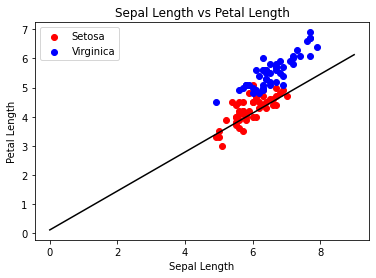

Iteration:  178
Weights:  [  28.   166.6 -258.2]


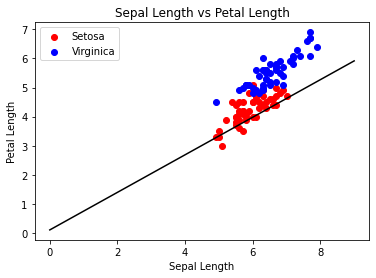

Iteration:  179
Weights:  [  30.   179.4 -250. ]


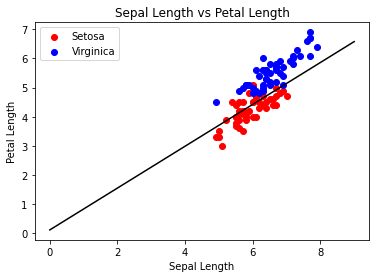

Iteration:  180
Weights:  [  30.   178.2 -251.2]


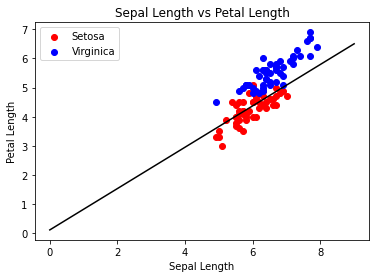

Iteration:  181
Weights:  [  30.   176.8 -253. ]


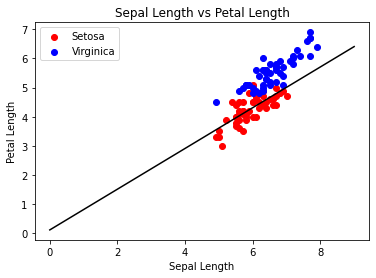

Iteration:  182
Weights:  [  30.   171.2 -258. ]


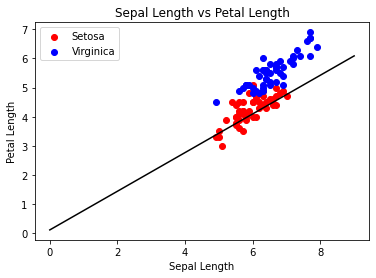

Iteration:  183
Weights:  [  30.   167.8 -262. ]


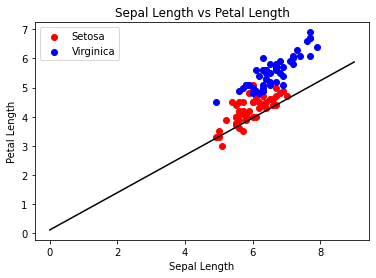

Iteration:  184
Weights:  [  32.   180.6 -253.8]


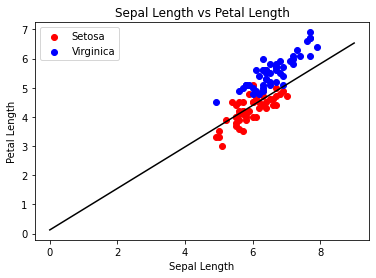

Iteration:  185
Weights:  [  32.   179.2 -255.6]


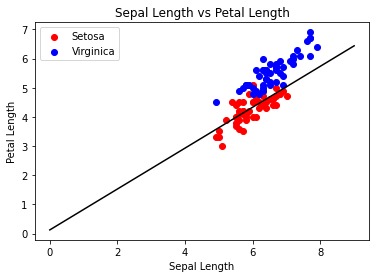

Iteration:  186
Weights:  [  32.   173.4 -260.6]


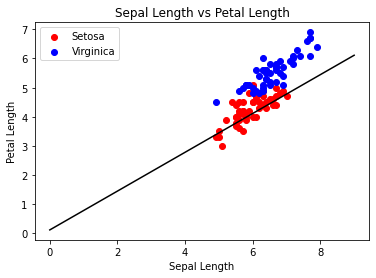

Iteration:  187
Weights:  [  32.   170.  -264.6]


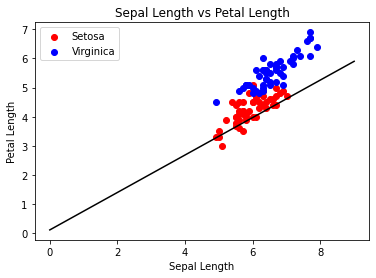

Iteration:  188
Weights:  [  34.   182.8 -256.4]


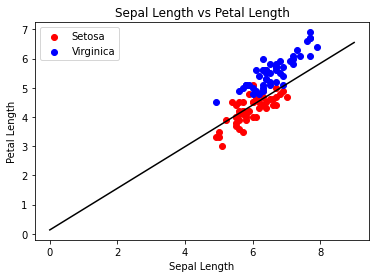

Iteration:  189
Weights:  [  34.   181.4 -258.2]


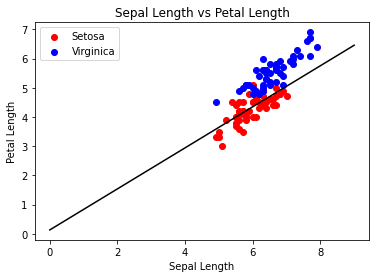

Iteration:  190
Weights:  [  34.   175.6 -263.2]


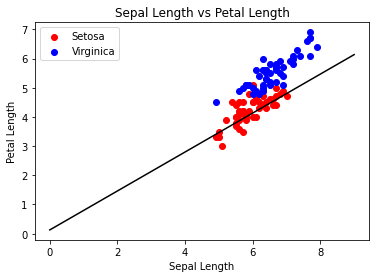

Iteration:  191
Weights:  [  34.   172.2 -267.2]


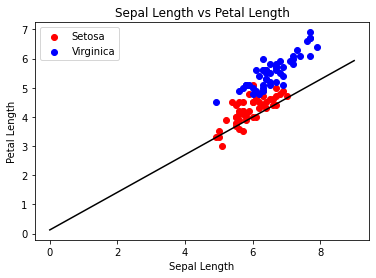

Iteration:  192
Weights:  [  36.  185. -259.]


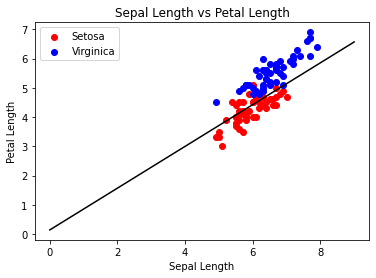

Iteration:  193
Weights:  [  36.   183.6 -260.8]


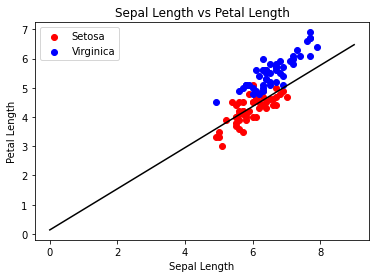

Iteration:  194
Weights:  [  36.   179.4 -264.4]


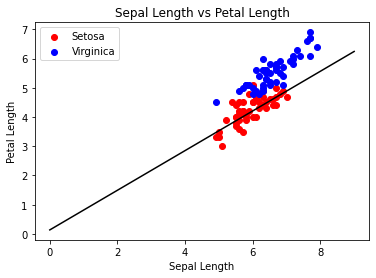

Iteration:  195
Weights:  [  36.   175.6 -268.4]


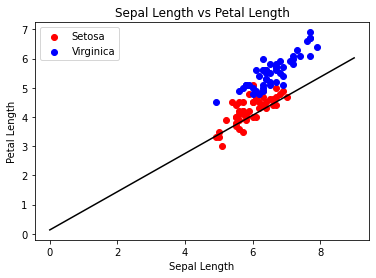

Iteration:  196
Weights:  [  36.   173.4 -270.8]


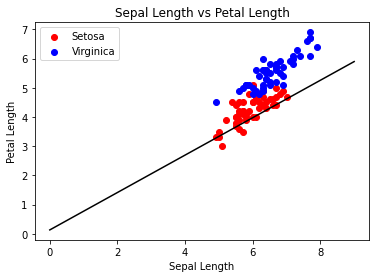

Iteration:  197
Weights:  [  38.   186.2 -262.6]


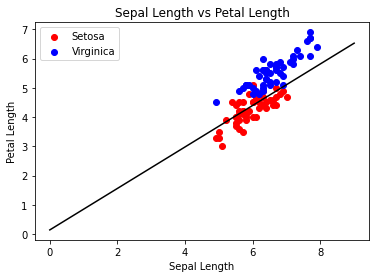

Iteration:  198
Weights:  [  38.   184.8 -264.4]


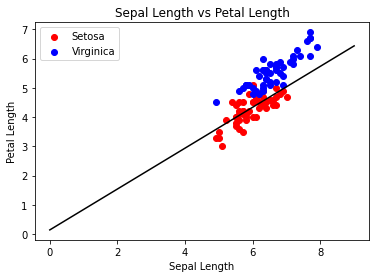

Iteration:  199
Weights:  [  38.   179.  -269.4]


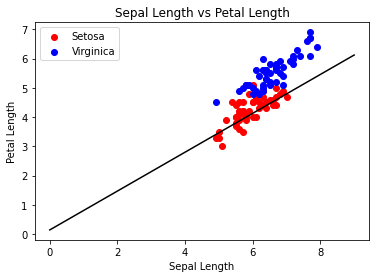

Iteration:  200
Weights:  [  38.   175.6 -273.4]


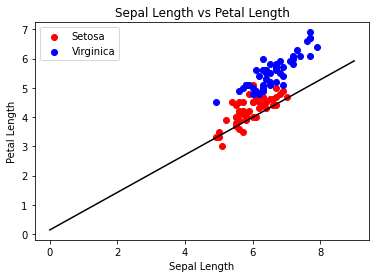

Iteration:  201
Weights:  [  40.   188.4 -265.2]


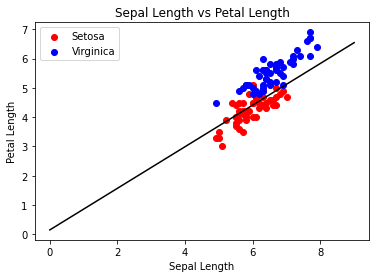

Iteration:  202
Weights:  [  40.  187. -267.]


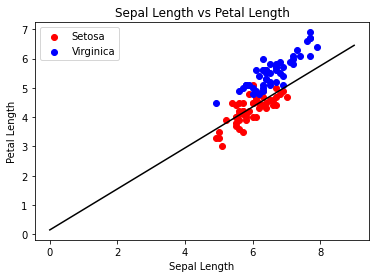

Iteration:  203
Weights:  [  40.   183.  -270.4]


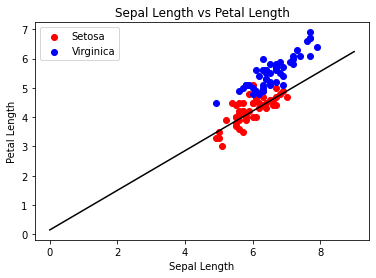

Iteration:  204
Weights:  [  40.   179.6 -274.4]


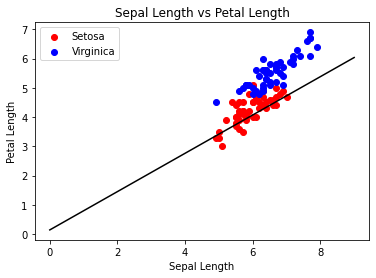

Iteration:  205
Weights:  [  40.   177.4 -276.8]


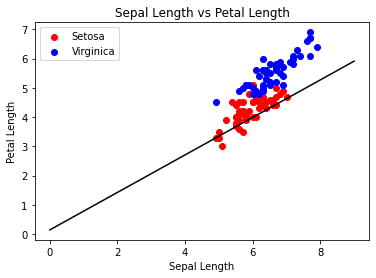

Iteration:  206
Weights:  [  42.   190.2 -268.6]


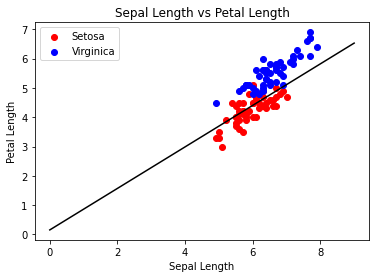

Iteration:  207
Weights:  [  42.   188.8 -270.4]


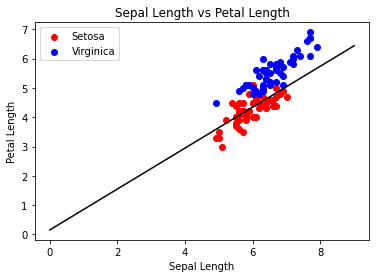

Iteration:  208
Weights:  [  42.   183.  -275.4]


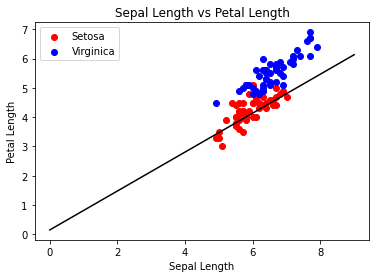

Iteration:  209
Weights:  [  42.   179.6 -279.4]


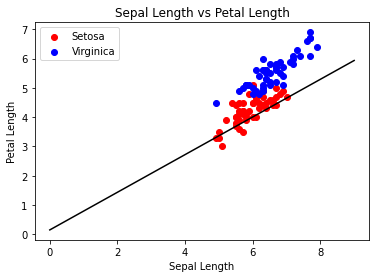

Iteration:  210
Weights:  [  44.   192.4 -271.2]


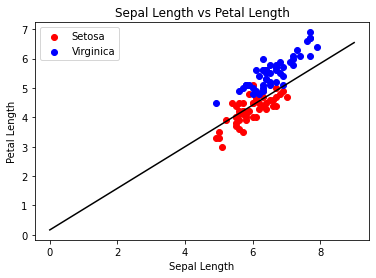

Iteration:  211
Weights:  [  44.  191. -273.]


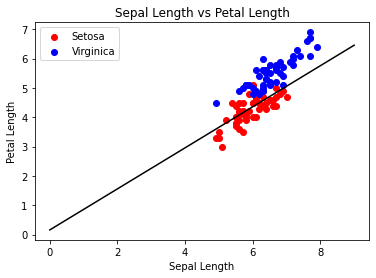

Iteration:  212
Weights:  [  44.   187.  -276.4]


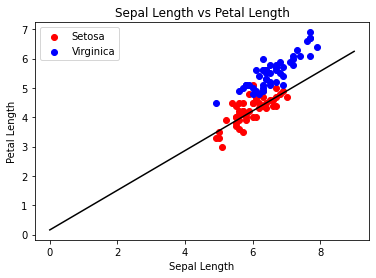

Iteration:  213
Weights:  [  44.   183.6 -280.4]


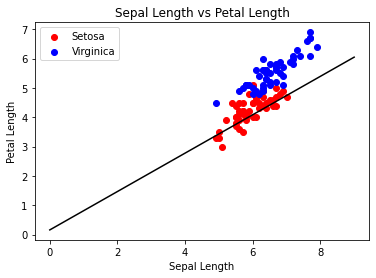

Iteration:  214
Weights:  [  44.   181.4 -282.8]


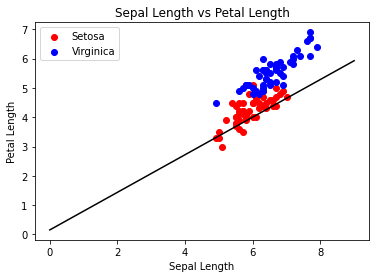

Iteration:  215
Weights:  [  46.   194.  -275.2]


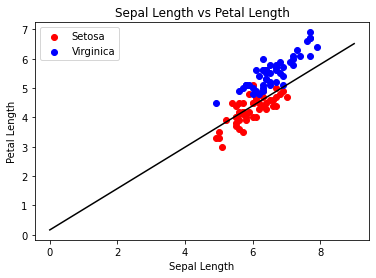

Iteration:  216
Weights:  [  46.   192.6 -277. ]


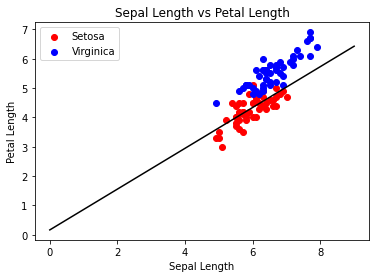

Iteration:  217
Weights:  [  46.  187. -282.]


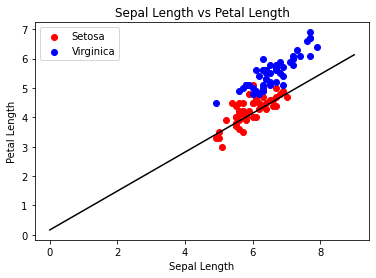

Iteration:  218
Weights:  [  46.   184.8 -284.4]


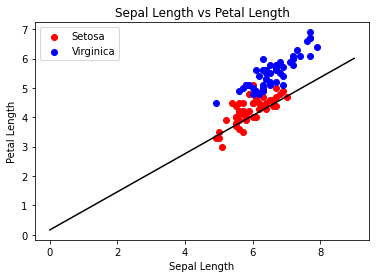

Iteration:  219
Weights:  [  48.   196.4 -276.6]


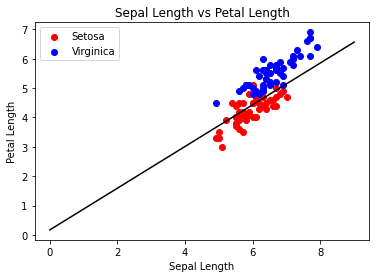

Iteration:  220
Weights:  [  48.   195.  -278.4]


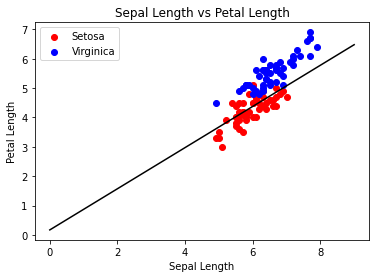

Iteration:  221
Weights:  [  48.   191.  -281.8]


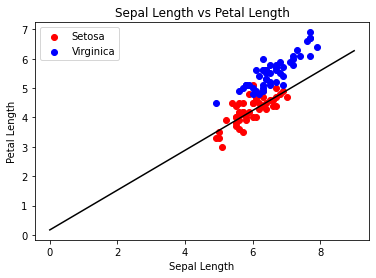

Iteration:  222
Weights:  [  48.   188.2 -285. ]


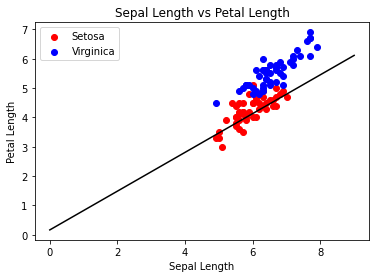

Iteration:  223
Weights:  [  48.   186.  -287.4]


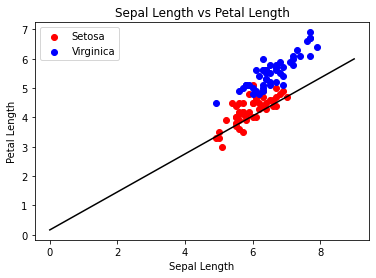

Iteration:  224
Weights:  [  50.   198.8 -279.2]


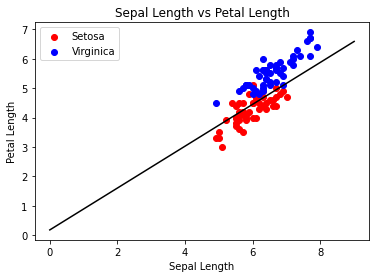

Iteration:  225
Weights:  [  50.   197.4 -281. ]


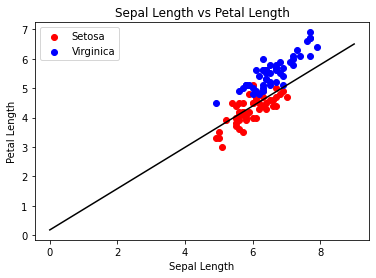

Iteration:  226
Weights:  [  50.   193.2 -284.6]


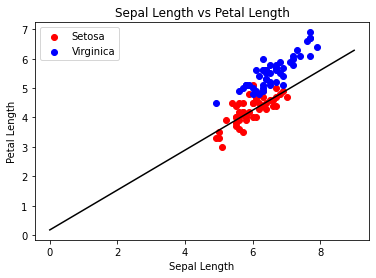

Iteration:  227
Weights:  [  50.   190.4 -287.8]


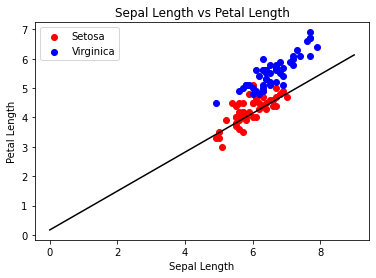

Iteration:  228
Weights:  [  50.   188.2 -290.2]


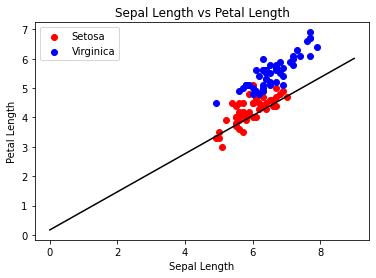

Iteration:  229
Weights:  [  52.   199.8 -282.4]


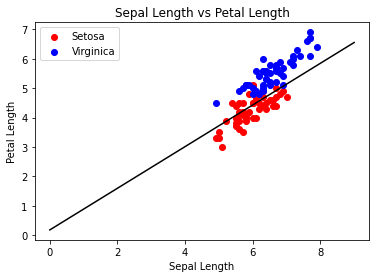

Iteration:  230
Weights:  [  52.   198.4 -284.2]


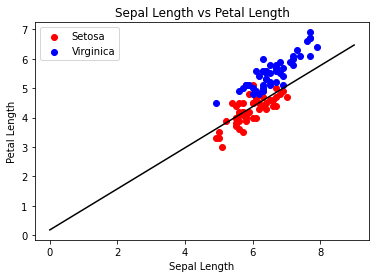

Iteration:  231
Weights:  [  52.   194.4 -287.6]


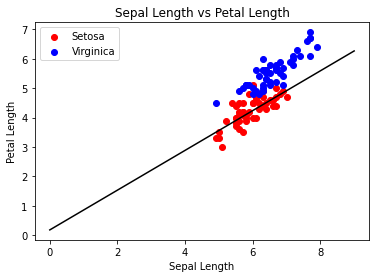

Iteration:  232
Weights:  [  52.   191.6 -290.8]


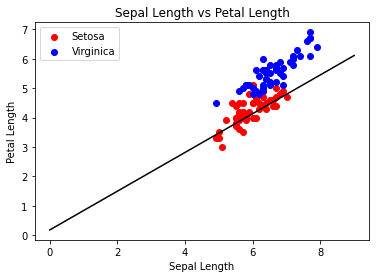

Iteration:  233
Weights:  [  52.   189.4 -293.2]


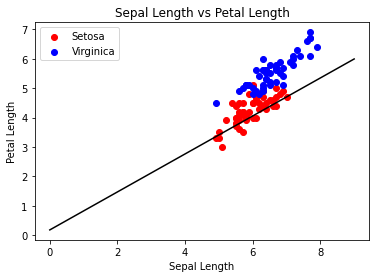

Iteration:  234
Weights:  [  54.   202.2 -285. ]


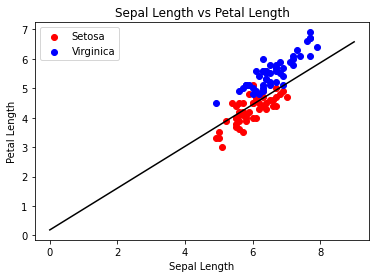

Iteration:  235
Weights:  [  54.   200.8 -286.8]


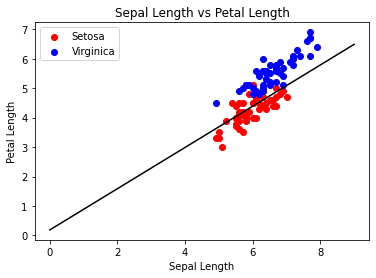

Iteration:  236
Weights:  [  54.   196.8 -290.2]


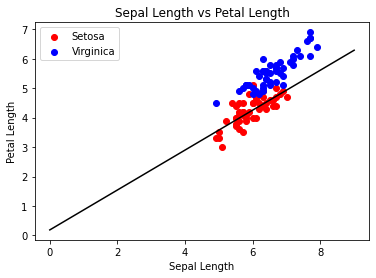

Iteration:  237
Weights:  [  54.   194.  -293.4]


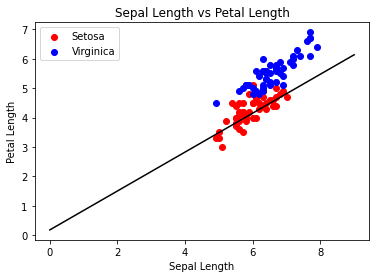

Iteration:  238
Weights:  [  54.   191.8 -295.8]


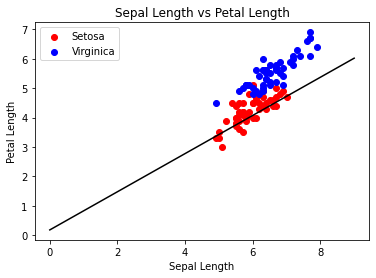

Iteration:  239
Weights:  [  56.   203.2 -288.6]


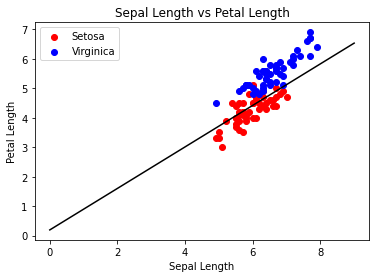

Iteration:  240
Weights:  [  56.   199.2 -292. ]


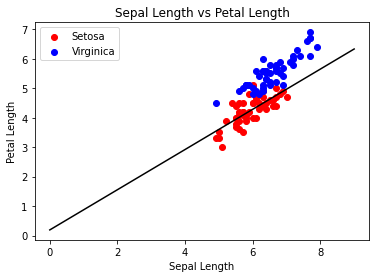

Iteration:  241
Weights:  [  56.   196.2 -295.2]


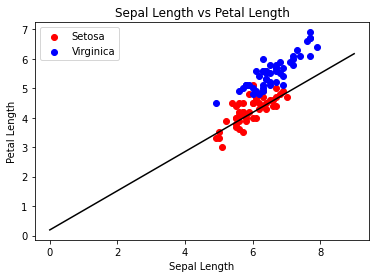

Iteration:  242
Weights:  [  56.   194.  -297.6]


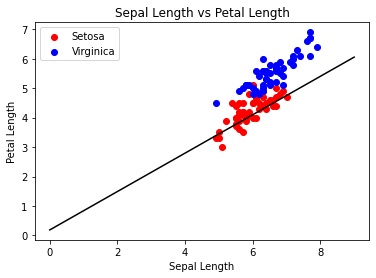

Iteration:  243
Weights:  [  58.   205.6 -289.8]


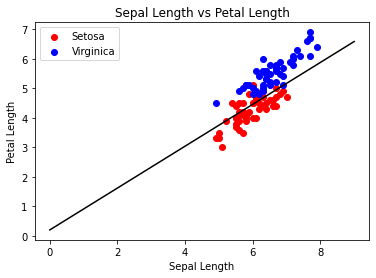

Iteration:  244
Weights:  [  58.   204.2 -291.6]


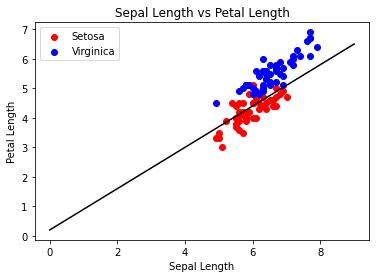

Iteration:  245
Weights:  [  58.   200.  -295.2]


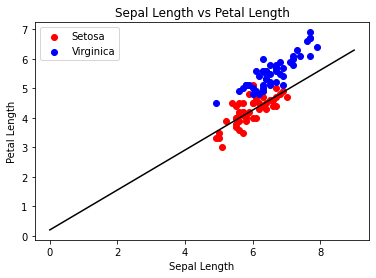

Iteration:  246
Weights:  [  58.   197.2 -298.4]


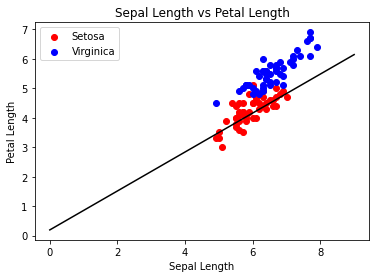

Iteration:  247
Weights:  [  58.   195.  -300.8]


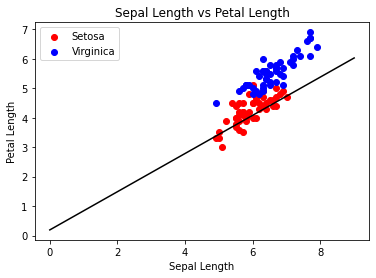

Iteration:  248
Weights:  [  60.   206.4 -293.6]


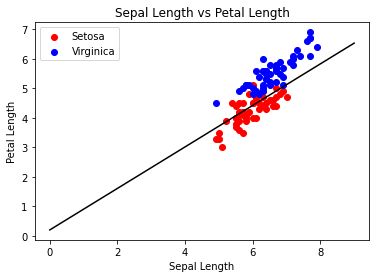

Iteration:  249
Weights:  [  60.   202.8 -296.6]


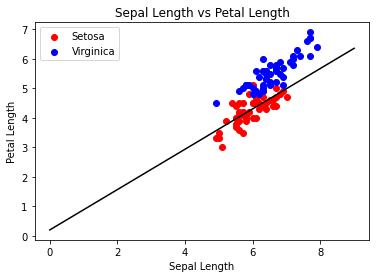

Iteration:  250
Weights:  [  60.   197.6 -301.6]


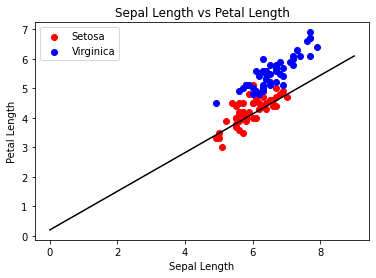

Iteration:  251
Weights:  [  60.   195.4 -304. ]


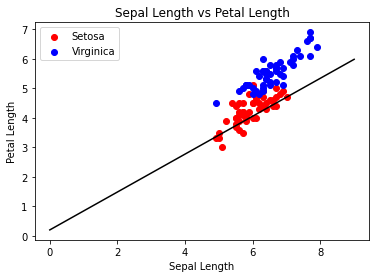

Iteration:  252
Weights:  [  62.   208.  -296.4]


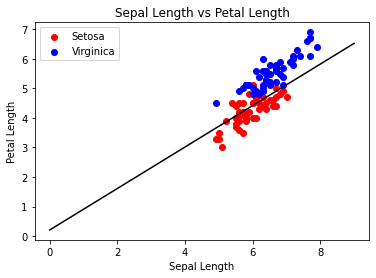

Iteration:  253
Weights:  [  62.   203.8 -300. ]


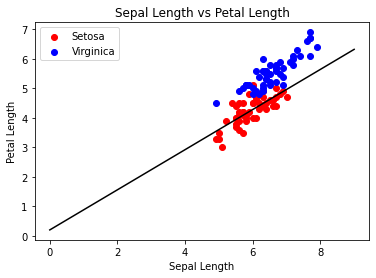

Iteration:  254
Weights:  [  62.   201.  -303.2]


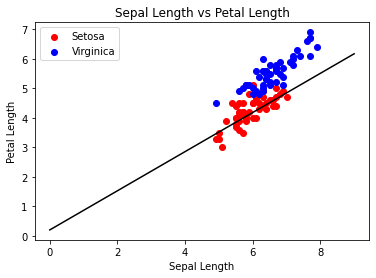

Iteration:  255
Weights:  [  62.   198.8 -305.6]


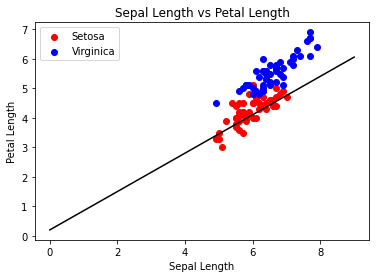

Iteration:  256
Weights:  [  64.   210.4 -297.8]


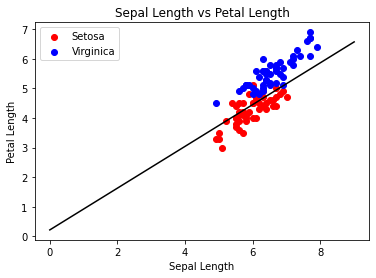

Iteration:  257
Weights:  [  64.   206.4 -301.2]


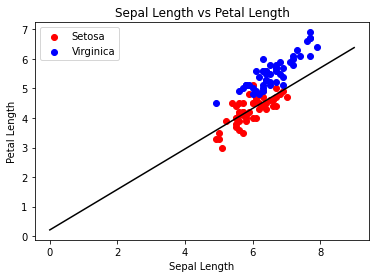

Iteration:  258
Weights:  [  64.   201.2 -306.2]


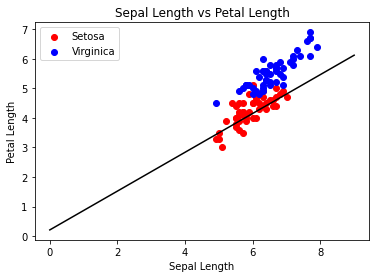

Iteration:  259
Weights:  [  64.   199.  -308.6]


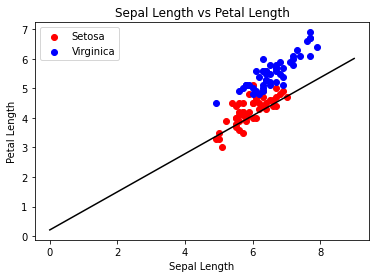

Iteration:  260
Weights:  [  66.   207.8 -303. ]


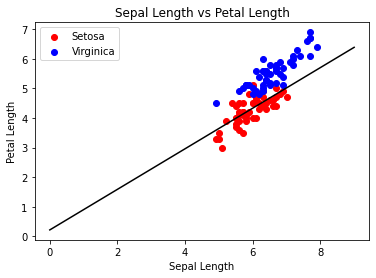

Iteration:  261
Weights:  [  66.   202.6 -308. ]


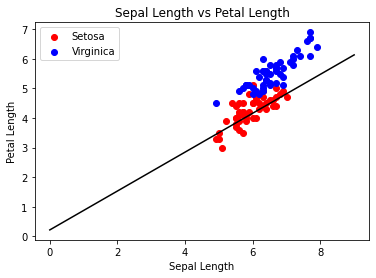

Iteration:  262
Weights:  [  66.   200.4 -310.4]


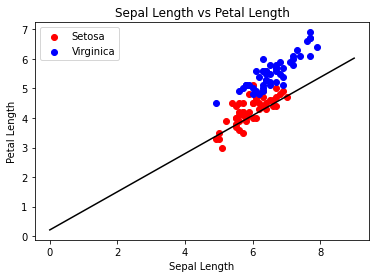

Iteration:  263
Weights:  [  68.   211.8 -303.2]


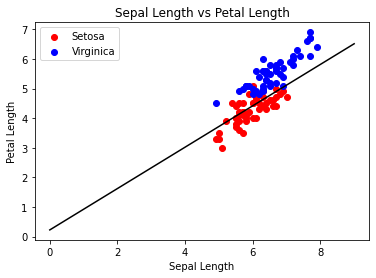

Iteration:  264
Weights:  [  68.   207.6 -306.8]


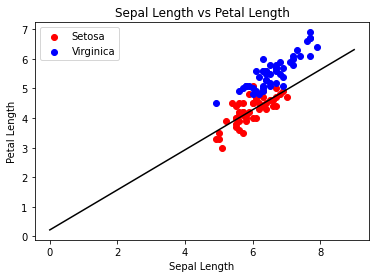

Iteration:  265
Weights:  [  68.   204.8 -310. ]


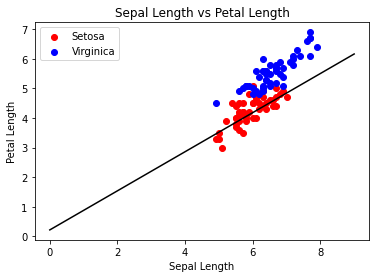

Iteration:  266
Weights:  [  68.   202.6 -312.4]


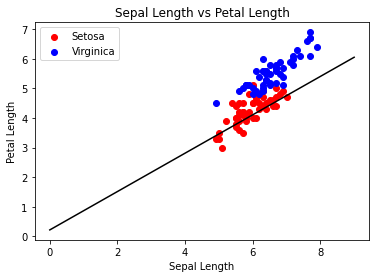

Iteration:  267
Weights:  [  70.   214.  -305.2]


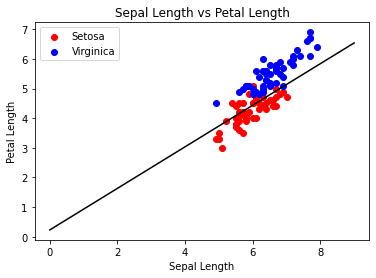

Iteration:  268
Weights:  [  70.   210.4 -308.2]


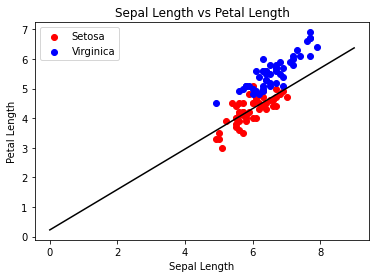

Iteration:  269
Weights:  [  70.   205.2 -313.2]


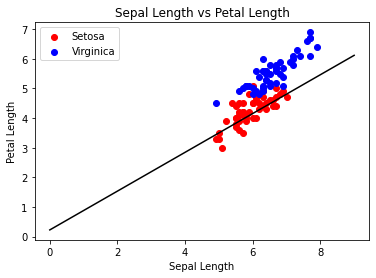

Iteration:  270
Weights:  [  70.   203.  -315.6]


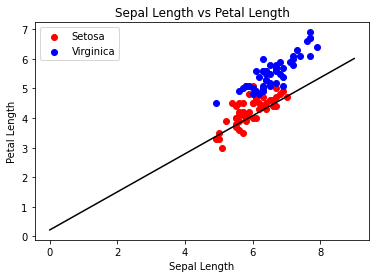

Iteration:  271
Weights:  [  72.   211.8 -310. ]


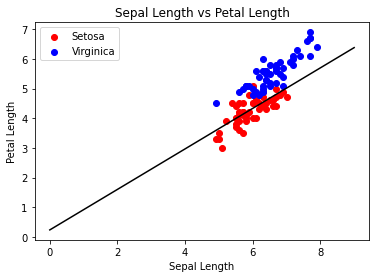

Iteration:  272
Weights:  [  72.   206.6 -315. ]


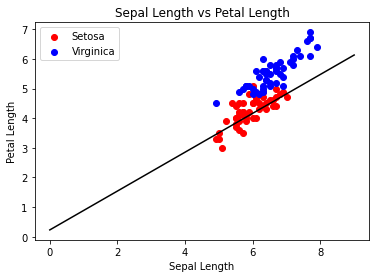

Iteration:  273
Weights:  [  72.   204.4 -317.4]


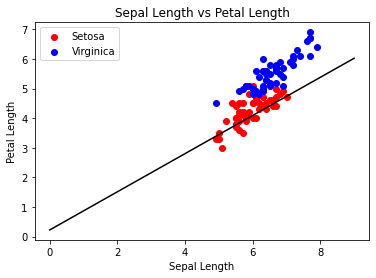

Iteration:  274
Weights:  [  74.   213.2 -311.8]


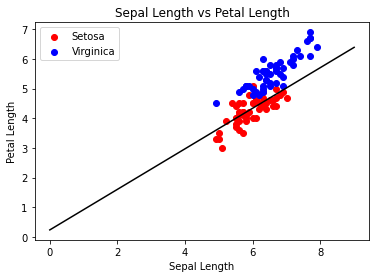

Iteration:  275
Weights:  [  74.   208.  -316.8]


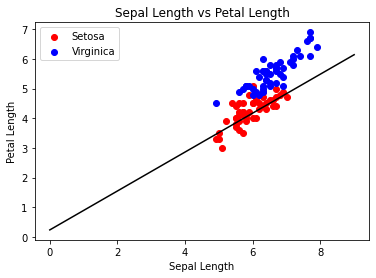

Iteration:  276
Weights:  [  74.   205.8 -319.2]


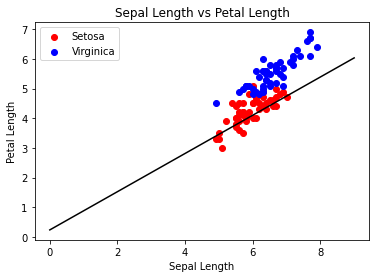

Iteration:  277
Weights:  [  76.   214.6 -313.6]


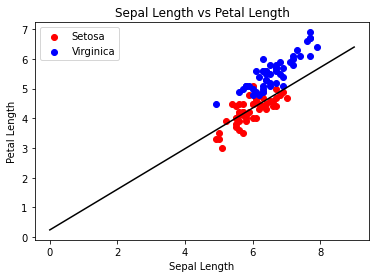

Iteration:  278
Weights:  [  76.   209.6 -317.6]


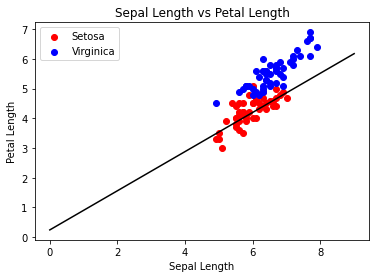

Iteration:  279
Weights:  [  76.   207.4 -320. ]


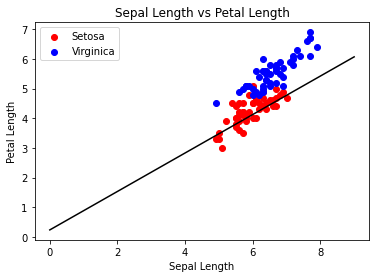

Iteration:  280
Weights:  [  78.   218.8 -312.8]


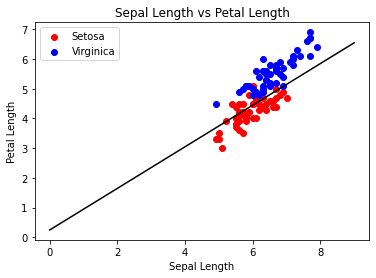

Iteration:  281
Weights:  [  78.   214.8 -316.2]


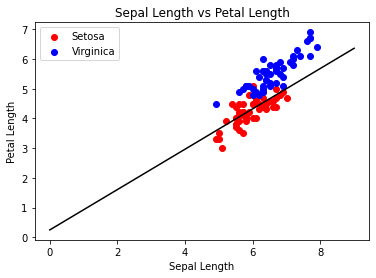

Iteration:  282
Weights:  [  78.   209.6 -321.2]


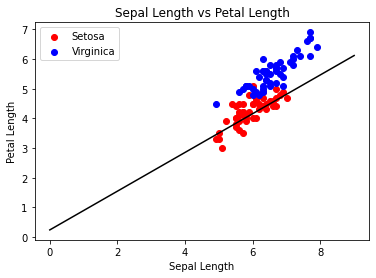

Iteration:  283
Weights:  [  78.   207.4 -323.6]


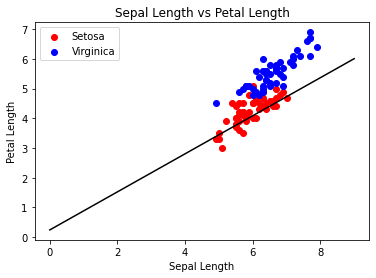

Iteration:  284
Weights:  [  80.   216.2 -318. ]


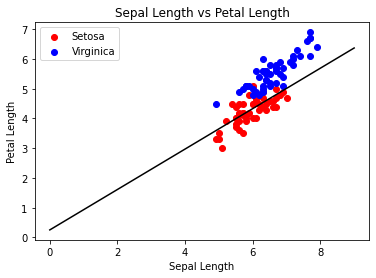

Iteration:  285
Weights:  [  80.  211. -323.]


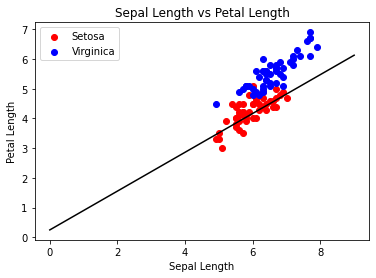

Iteration:  286
Weights:  [  80.   208.8 -325.4]


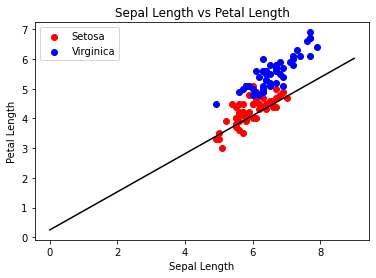

Iteration:  287
Weights:  [  82.   217.6 -319.8]


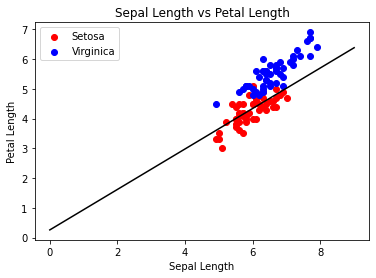

Iteration:  288
Weights:  [  82.   212.4 -324.8]


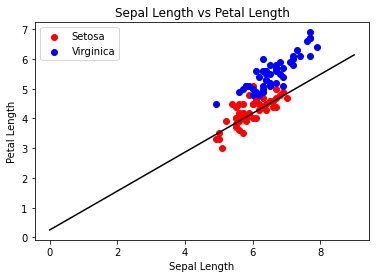

Iteration:  289
Weights:  [  82.   210.2 -327.2]


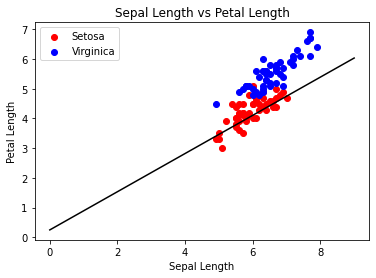

Iteration:  290
Weights:  [  84.   219.  -321.6]


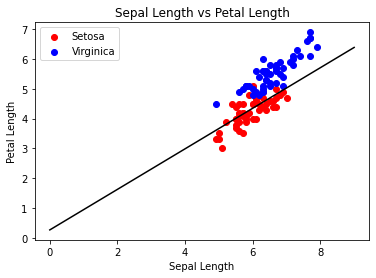

Iteration:  291
Weights:  [  84.   214.  -325.6]


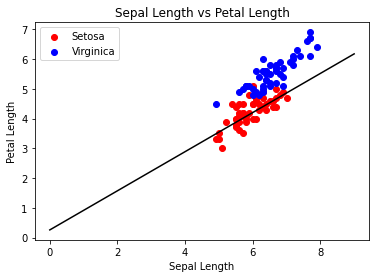

Iteration:  292
Weights:  [  84.   211.8 -328. ]


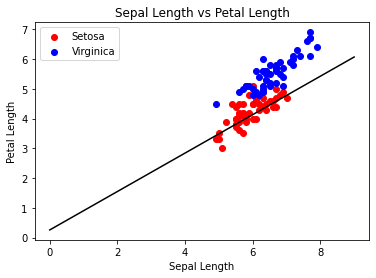

Iteration:  293
Weights:  [  86.   220.6 -322.4]


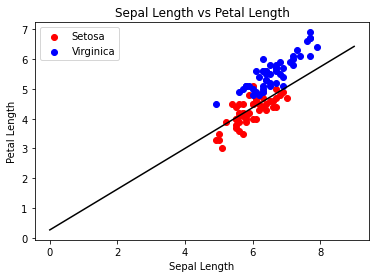

Iteration:  294
Weights:  [  86.   215.6 -326.4]


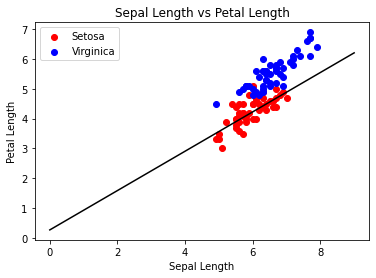

Iteration:  295
Weights:  [  86.   213.4 -328.8]


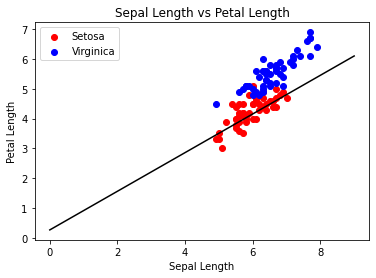

Iteration:  296
Weights:  [  86.   211.2 -331.2]


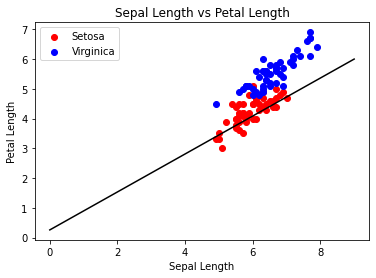

Iteration:  297
Weights:  [  88.   219.8 -325.8]


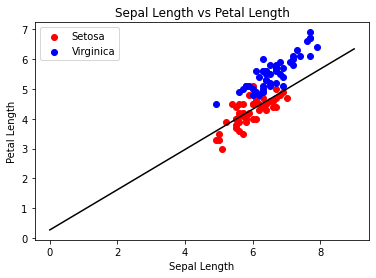

Iteration:  298
Weights:  [  88.   215.8 -329.2]


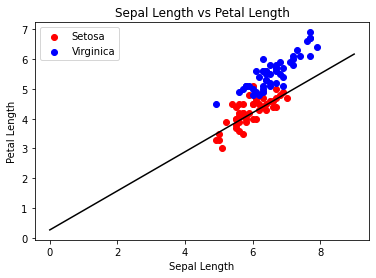

Iteration:  299
Weights:  [  88.   213.6 -331.6]


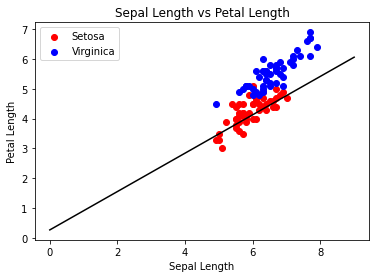

Iteration:  300
Weights:  [  90.   222.4 -326. ]


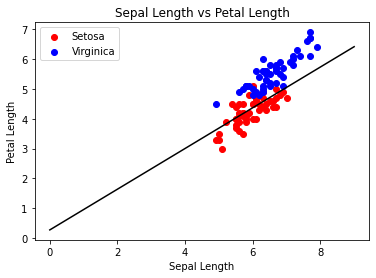

Iteration:  301
Weights:  [  90.   217.4 -330. ]


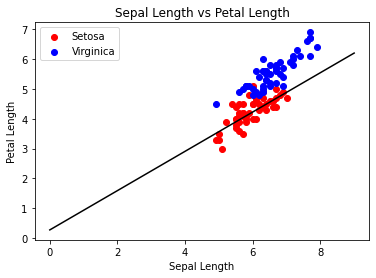

Iteration:  302
Weights:  [  90.   215.2 -332.4]


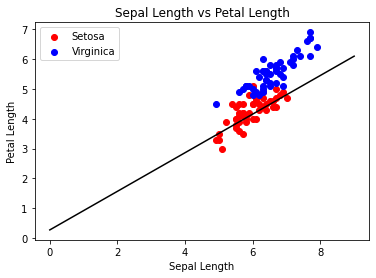

Iteration:  303
Weights:  [  92.   224.  -326.8]


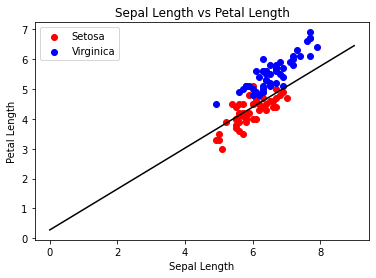

Iteration:  304
Weights:  [  92.   218.6 -330.8]


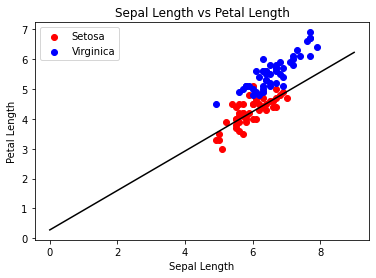

Iteration:  305
Weights:  [  92.   217.4 -332.4]


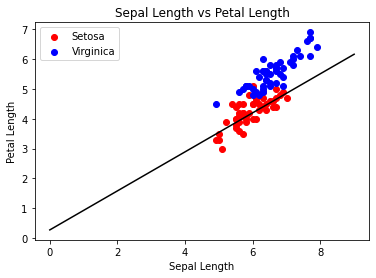

Iteration:  306
Weights:  [  92.   215.2 -334.8]


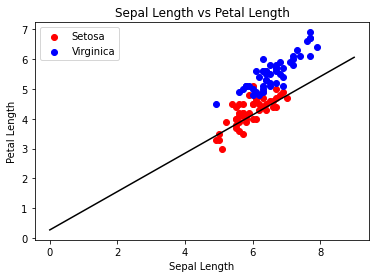

Iteration:  307
Weights:  [  94.   224.  -329.2]


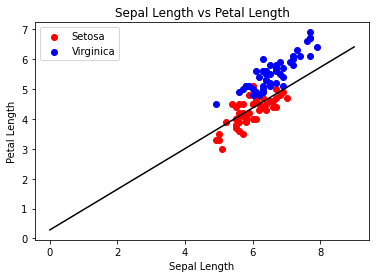

Iteration:  308
Weights:  [  94.   219.  -333.2]


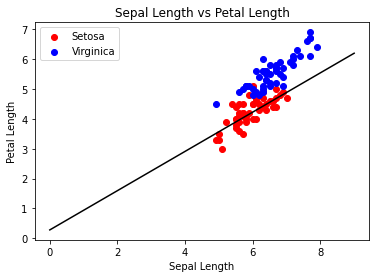

Iteration:  309
Weights:  [  94.   216.8 -335.6]


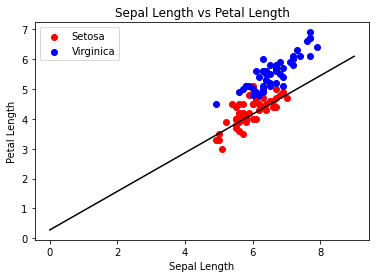

Iteration:  310
Weights:  [  96.   225.6 -330. ]


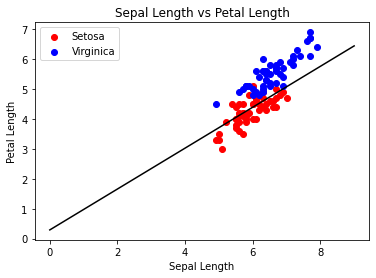

Iteration:  311
Weights:  [  96.   220.6 -334. ]


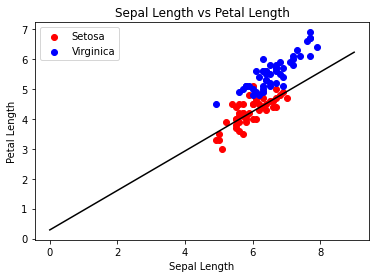

Iteration:  312
Weights:  [  96.   219.4 -335.6]


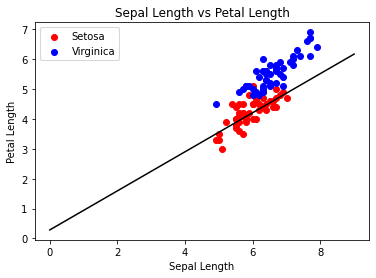

Iteration:  313
Weights:  [  96.   217.2 -338. ]


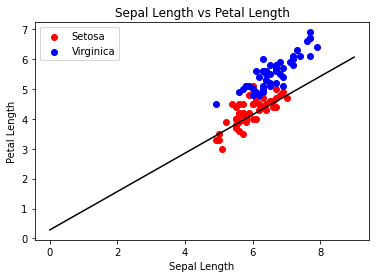

Iteration:  314
Weights:  [  98.   226.  -332.4]


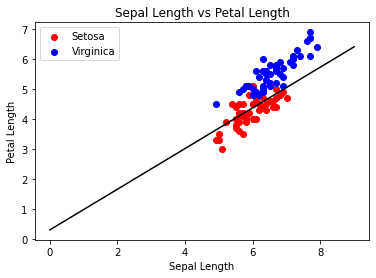

Iteration:  315
Weights:  [  98.   221.  -336.4]


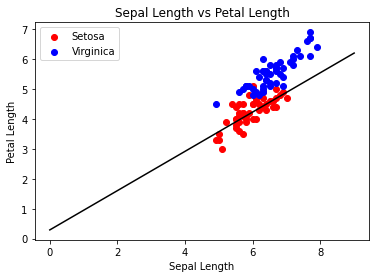

Iteration:  316
Weights:  [  98.   218.8 -338.8]


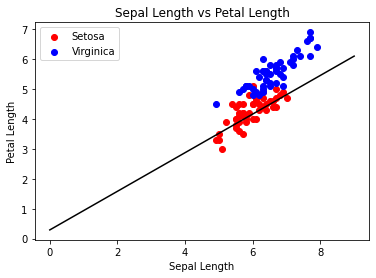

Iteration:  317
Weights:  [ 100.   227.6 -333.2]


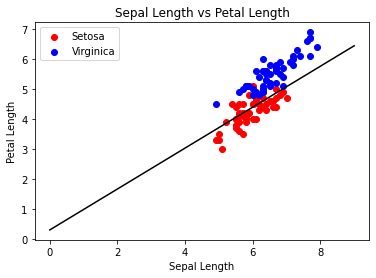

Iteration:  318
Weights:  [ 100.   222.6 -337.2]


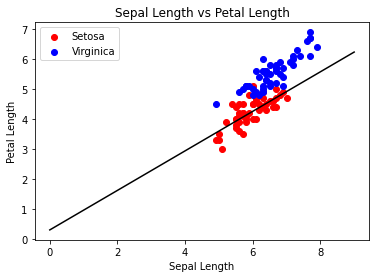

Iteration:  319
Weights:  [ 100.   221.4 -338.8]


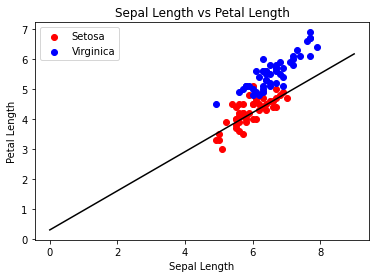

Iteration:  320
Weights:  [ 100.   219.2 -341.2]


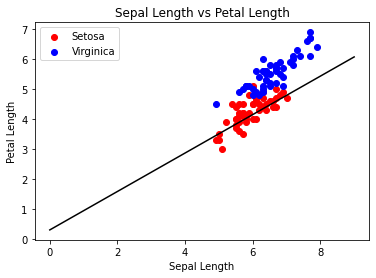

Iteration:  321
Weights:  [ 102.   228.  -335.6]


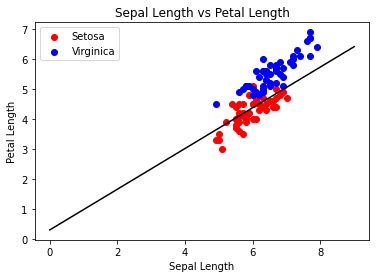

Iteration:  322
Weights:  [ 102.   223.  -339.6]


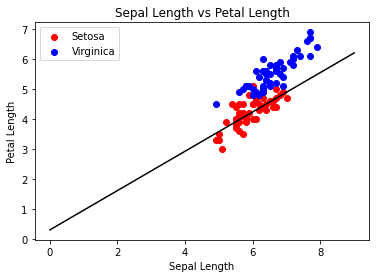

Iteration:  323
Weights:  [ 102.   221.8 -341.2]


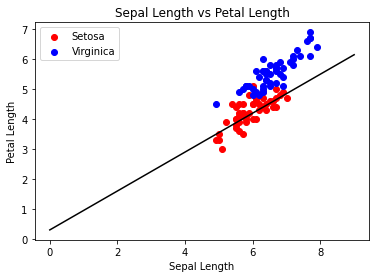

Iteration:  324
Weights:  [ 102.   219.6 -343.6]


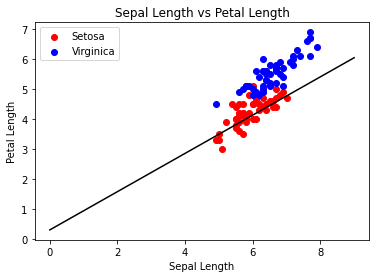

Iteration:  325
Weights:  [ 104.   228.4 -338. ]


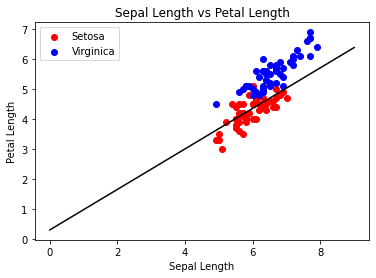

Iteration:  326
Weights:  [ 104.   223.4 -342. ]


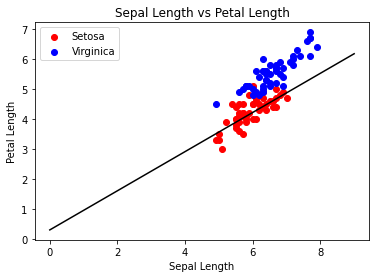

Iteration:  327
Weights:  [ 104.   221.2 -344.4]


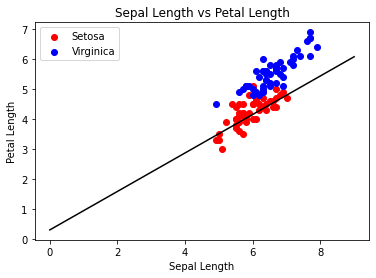

Iteration:  328
Weights:  [ 106.   230.  -338.8]


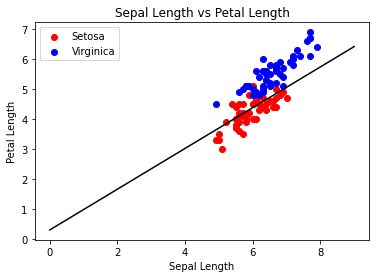

Iteration:  329
Weights:  [ 106.   225.  -342.8]


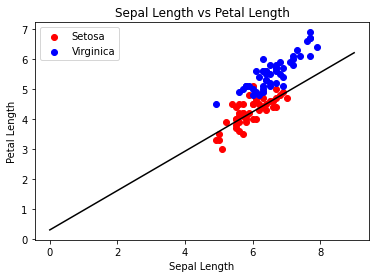

Iteration:  330
Weights:  [ 106.   223.8 -344.4]


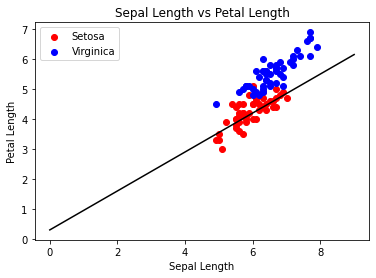

Iteration:  331
Weights:  [ 106.   221.6 -346.8]


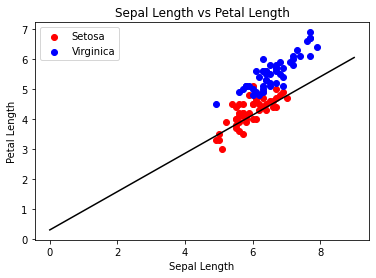

Iteration:  332
Weights:  [ 108.   230.4 -341.2]


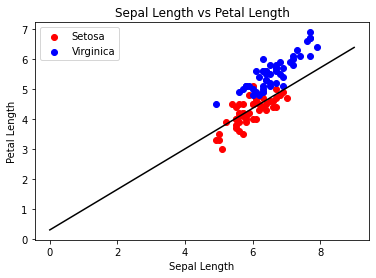

Iteration:  333
Weights:  [ 108.   225.4 -345.2]


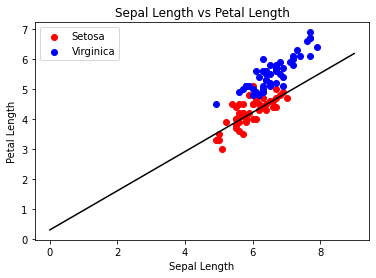

Iteration:  334
Weights:  [ 108.   223.2 -347.6]


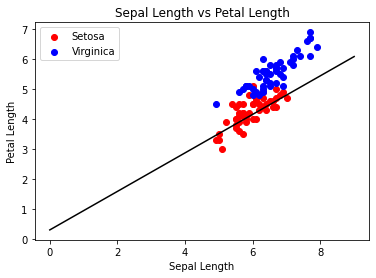

Iteration:  335
Weights:  [ 110.  232. -342.]


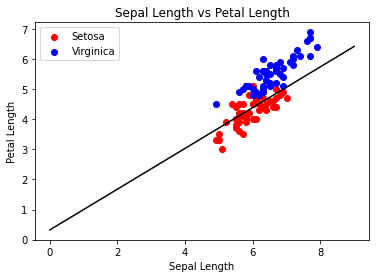

Iteration:  336
Weights:  [ 110.  227. -346.]


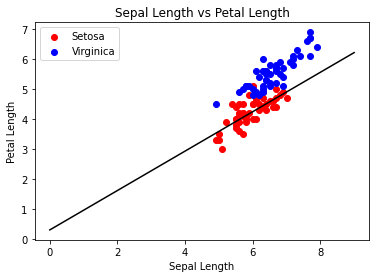

Iteration:  337
Weights:  [ 110.   225.8 -347.6]


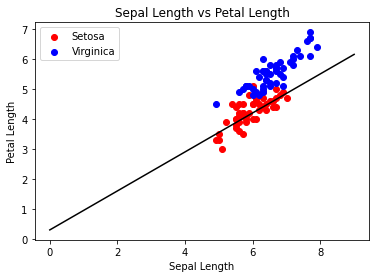

Iteration:  338
Weights:  [ 110.   223.6 -350. ]


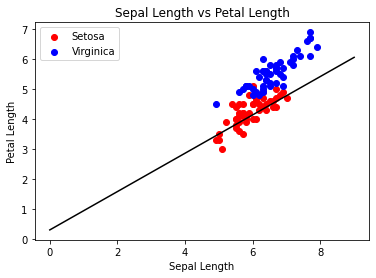

Iteration:  339
Weights:  [ 112.   232.4 -344.4]


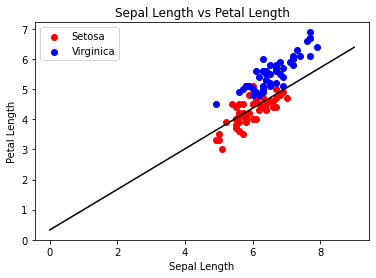

Iteration:  340
Weights:  [ 112.   227.4 -348.4]


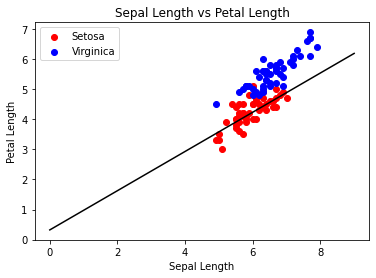

Iteration:  341
Weights:  [ 112.   225.2 -350.8]


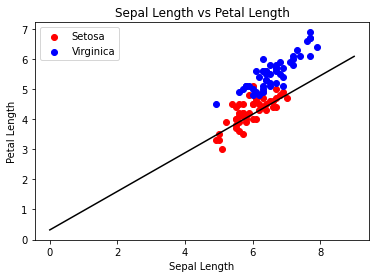

Iteration:  342
Weights:  [ 114.   234.  -345.2]


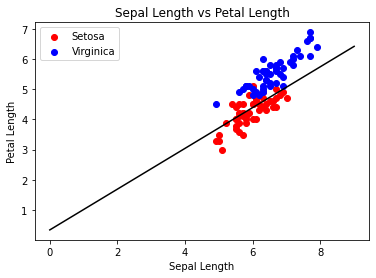

Iteration:  343
Weights:  [ 114.   229.  -349.2]


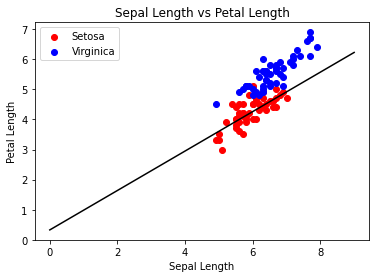

Iteration:  344
Weights:  [ 114.   227.8 -350.8]


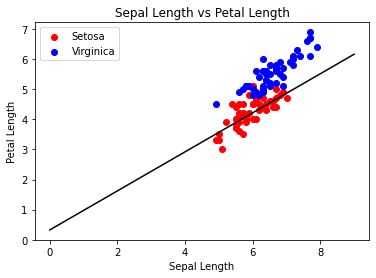

Iteration:  345
Weights:  [ 114.   225.6 -353.2]


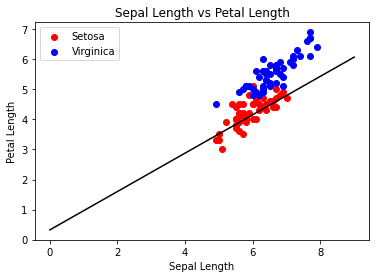

Iteration:  346
Weights:  [ 116.   234.4 -347.6]


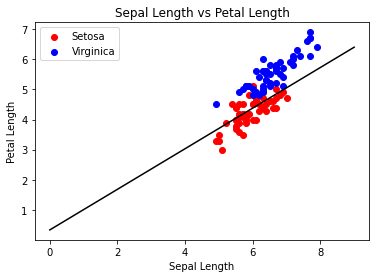

Iteration:  347
Weights:  [ 116.   229.4 -351.6]


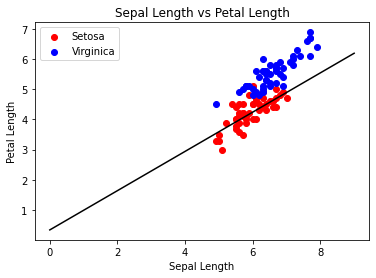

Iteration:  348
Weights:  [ 116.   228.2 -353.2]


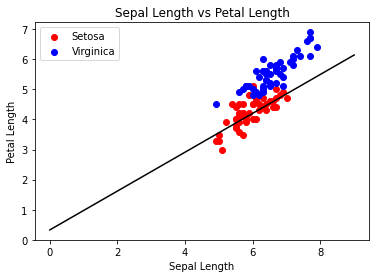

Iteration:  349
Weights:  [ 118.   237.2 -347. ]


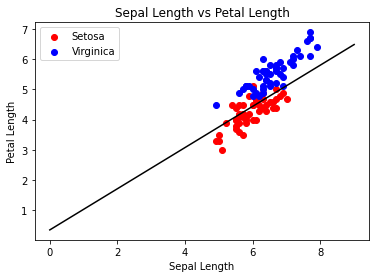

Iteration:  350
Weights:  [ 118.   233.2 -350.4]


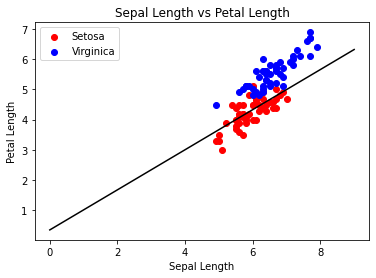

Iteration:  351
Weights:  [ 118.   229.2 -353.8]


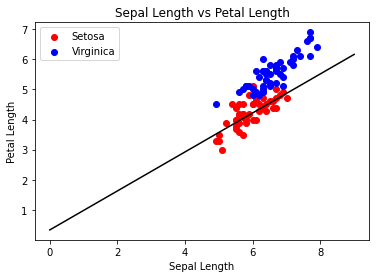

Iteration:  352
Weights:  [ 118.   227.  -356.2]


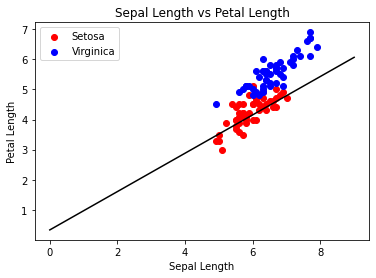

Iteration:  353
Weights:  [ 120.   235.8 -350.6]


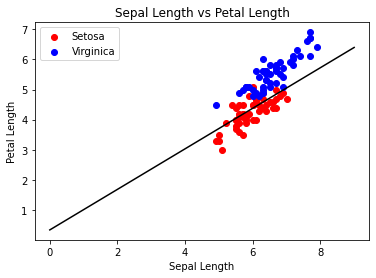

Iteration:  354
Weights:  [ 120.   233.4 -352.4]


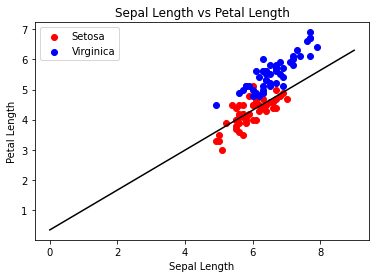

Iteration:  355
Weights:  [ 120.   229.4 -355.8]


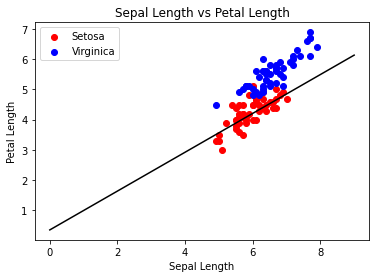

Iteration:  356
Weights:  [ 122.   238.2 -350.2]


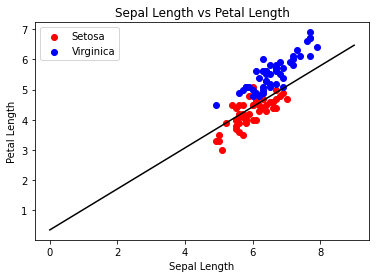

Iteration:  357
Weights:  [ 122.   234.6 -353.6]


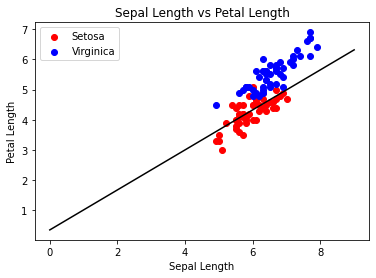

Iteration:  358
Weights:  [ 122.   230.6 -357. ]


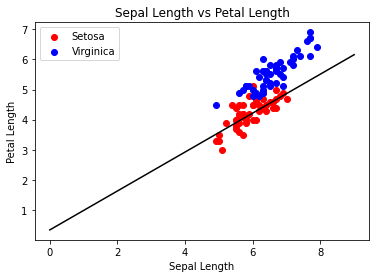

Iteration:  359
Weights:  [ 124.   239.6 -350.8]


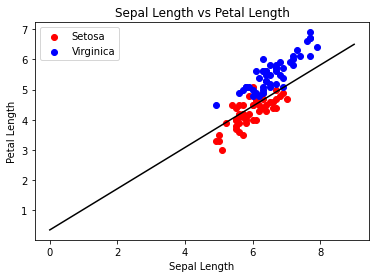

Iteration:  360
Weights:  [ 124.   235.6 -354.2]


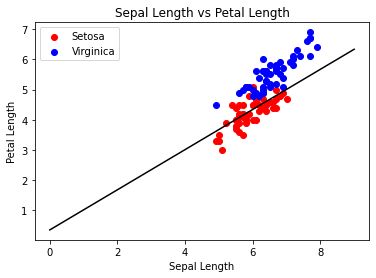

Iteration:  361
Weights:  [ 124.   231.8 -356.6]


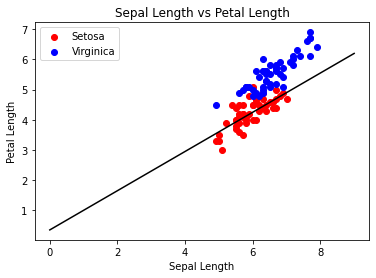

Iteration:  362
Weights:  [ 124.   230.6 -358.2]


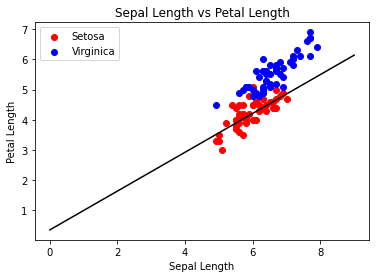

Iteration:  363
Weights:  [ 126.   239.4 -352.6]


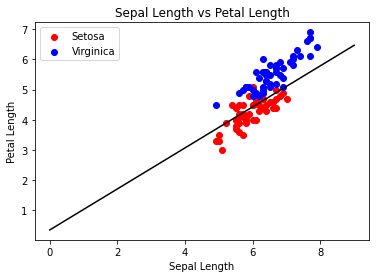

Iteration:  364
Weights:  [ 126.   235.8 -356. ]


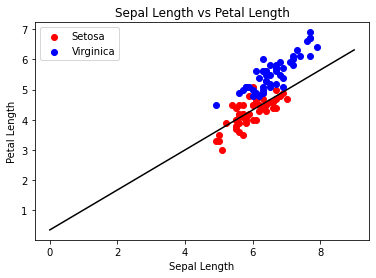

Iteration:  365
Weights:  [ 126.   231.8 -359.4]


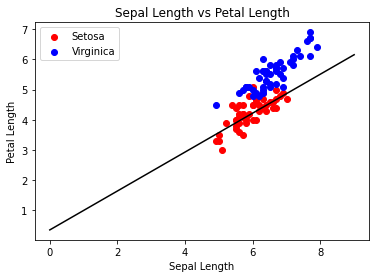

Iteration:  366
Weights:  [ 128.   240.8 -353.2]


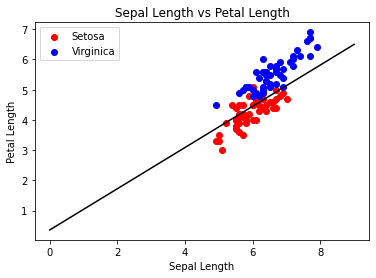

Iteration:  367
Weights:  [ 128.   236.8 -356.6]


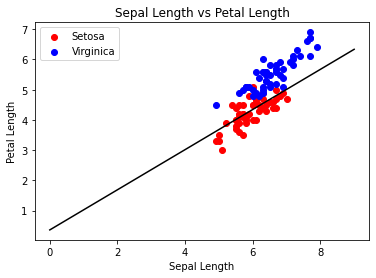

Iteration:  368
Weights:  [ 128.  233. -359.]


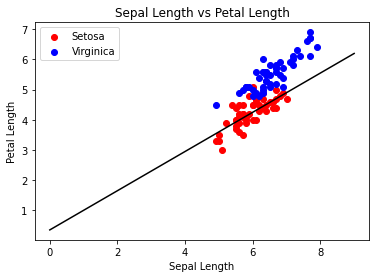

Iteration:  369
Weights:  [ 128.   231.8 -360.6]


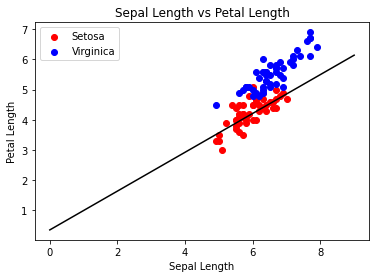

Iteration:  370
Weights:  [ 130.   240.6 -355. ]


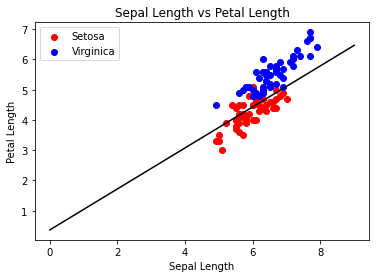

Iteration:  371
Weights:  [ 130.   237.  -358.4]


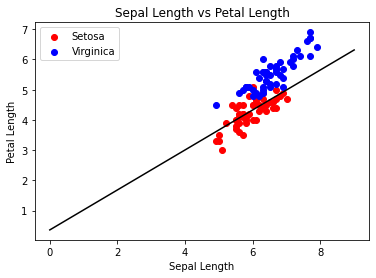

Iteration:  372
Weights:  [ 130.   233.  -361.8]


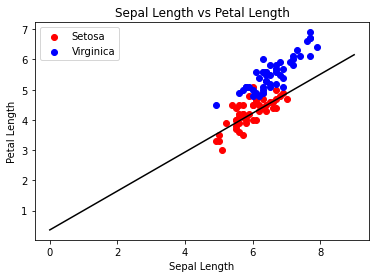

Iteration:  373
Weights:  [ 132.   242.  -355.6]


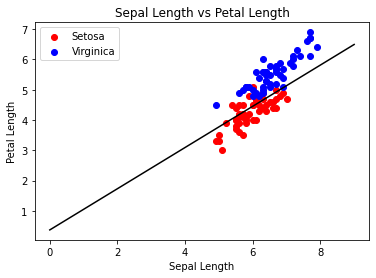

Iteration:  374
Weights:  [ 132.  238. -359.]


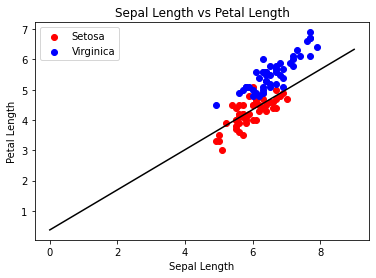

Iteration:  375
Weights:  [ 132.   234.2 -361.4]


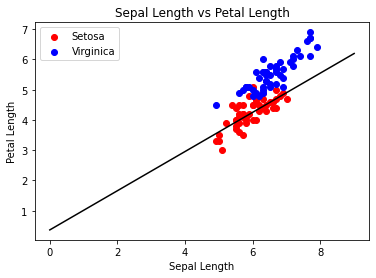

Iteration:  376
Weights:  [ 132.  233. -363.]


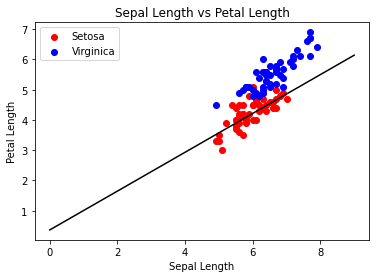

Iteration:  377
Weights:  [ 134.   241.8 -357.4]


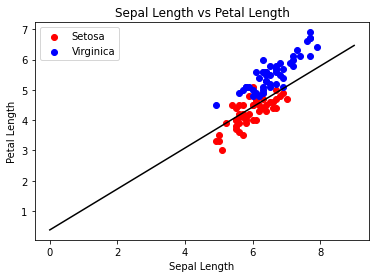

Iteration:  378
Weights:  [ 134.   238.2 -360.8]


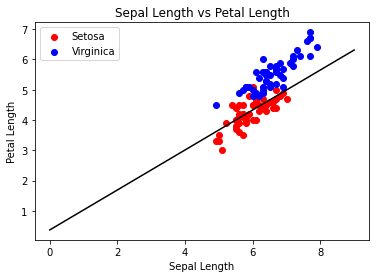

Iteration:  379
Weights:  [ 134.   234.4 -363.2]


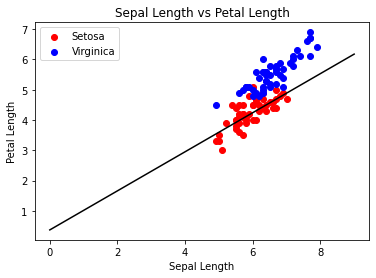

Iteration:  380
Weights:  [ 134.   232.2 -365.6]


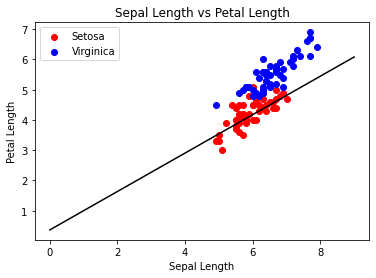

Iteration:  381
Weights:  [ 136.  241. -360.]


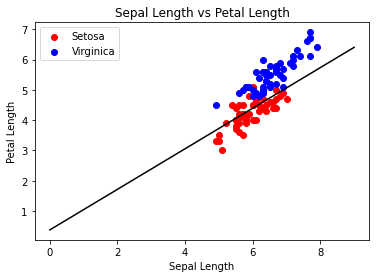

Iteration:  382
Weights:  [ 136.   238.6 -361.8]


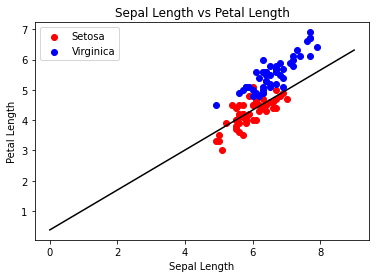

Iteration:  383
Weights:  [ 136.   234.8 -364.2]


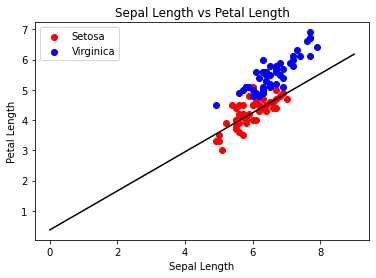

Iteration:  384
Weights:  [ 136.   232.6 -366.6]


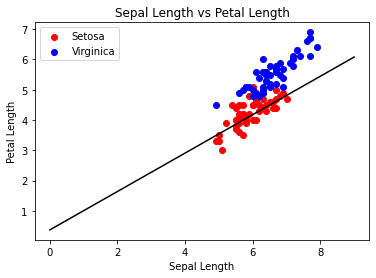

Iteration:  385
Weights:  [ 138.   241.4 -361. ]


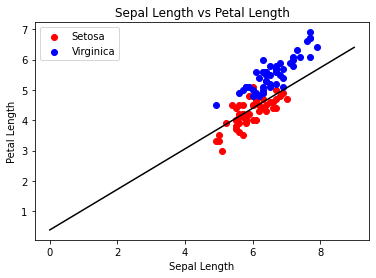

Iteration:  386
Weights:  [ 138.   239.  -362.8]


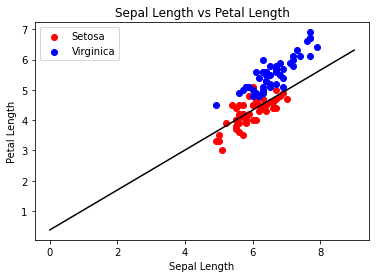

Iteration:  387
Weights:  [ 138.   235.2 -365.2]


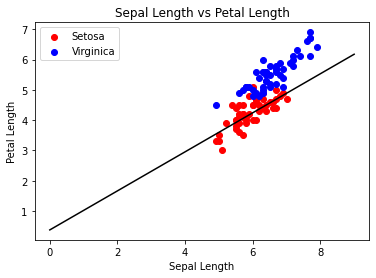

Iteration:  388
Weights:  [ 140.   244.2 -359. ]


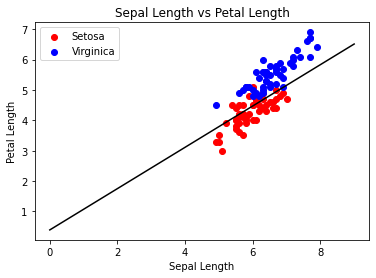

Iteration:  389
Weights:  [ 140.   240.  -362.6]


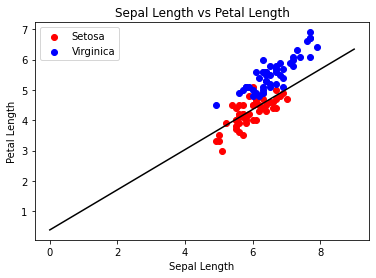

Iteration:  390
Weights:  [ 140.   236.2 -365. ]


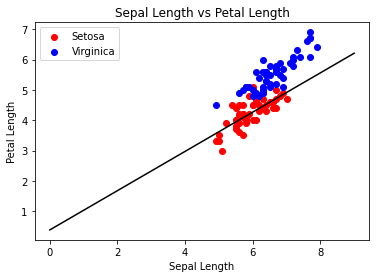

Iteration:  391
Weights:  [ 140.   235.  -366.6]


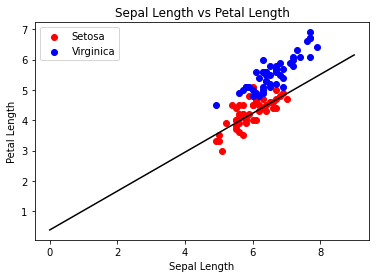

Iteration:  392
Weights:  [ 142.   244.  -360.4]


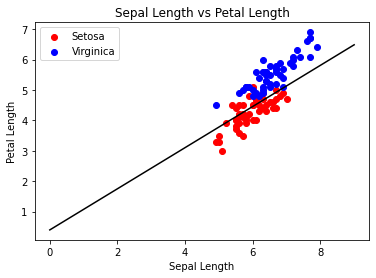

Iteration:  393
Weights:  [ 142.   240.2 -364. ]


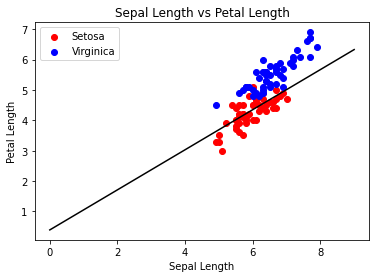

Iteration:  394
Weights:  [ 142.   236.4 -366.4]


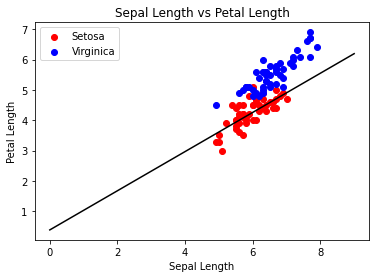

Iteration:  395
Weights:  [ 142.   235.2 -368. ]


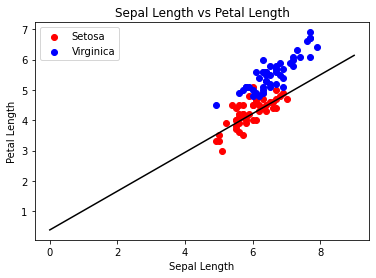

Iteration:  396
Weights:  [ 144.   244.  -362.4]


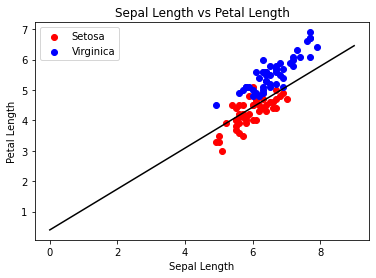

Iteration:  397
Weights:  [ 144.   240.4 -365.8]


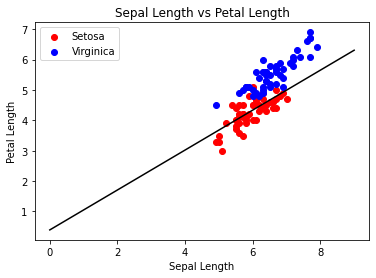

Iteration:  398
Weights:  [ 144.   236.6 -368.2]


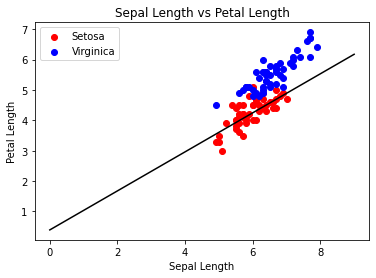

Iteration:  399
Weights:  [ 144.   235.4 -369.8]


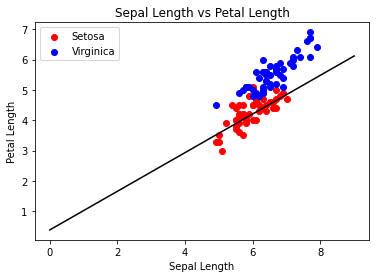

Iteration:  400
Weights:  [ 146.   244.2 -364.2]


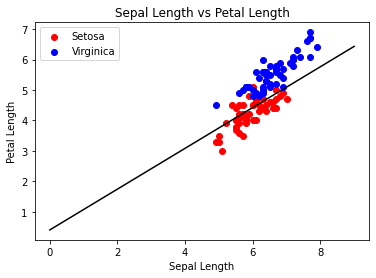

Iteration:  401
Weights:  [ 146.   239.2 -368.2]


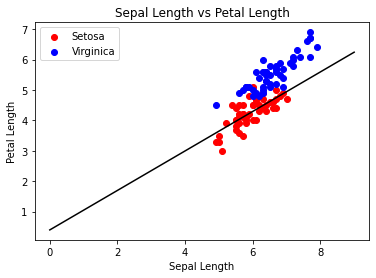

Iteration:  402
Weights:  [ 146.   238.  -369.8]


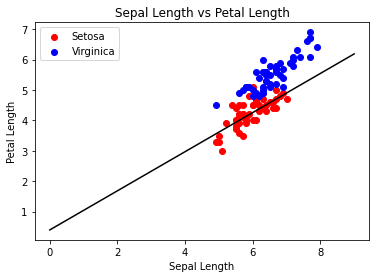

Iteration:  403
Weights:  [ 146.   236.8 -371.4]


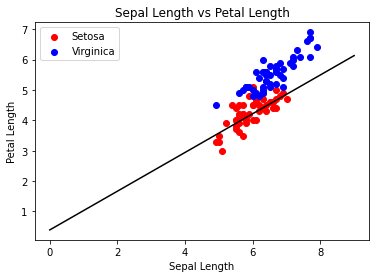

Iteration:  404
Weights:  [ 148.   245.6 -365.8]


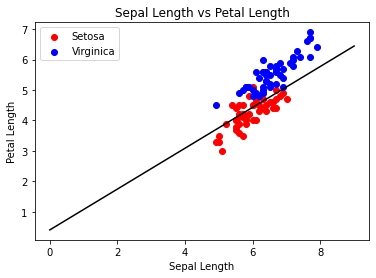

Iteration:  405
Weights:  [ 148.   242.  -369.2]


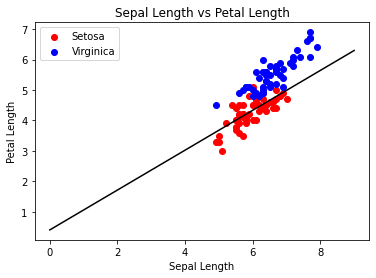

Iteration:  406
Weights:  [ 148.   238.2 -371.6]


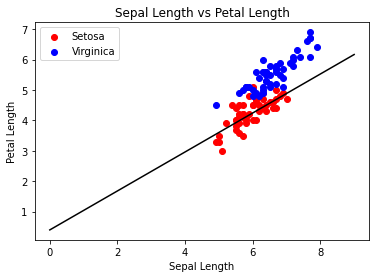

Iteration:  407
Weights:  [ 148.   237.  -373.2]


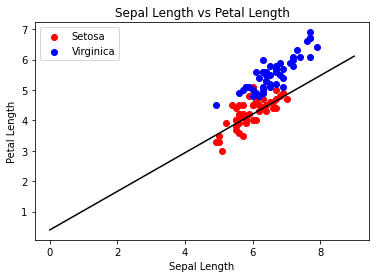

Iteration:  408
Weights:  [ 150.   245.8 -367.6]


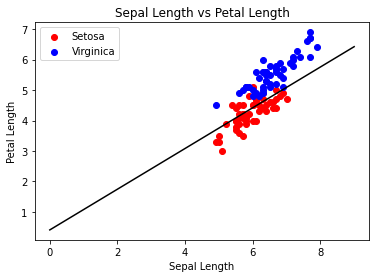

Iteration:  409
Weights:  [ 150.   243.2 -369.6]


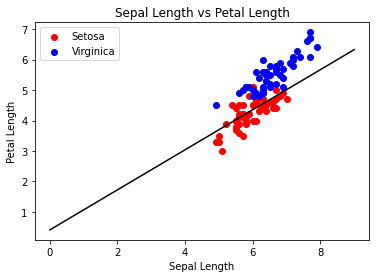

Iteration:  410
Weights:  [ 150.   239.4 -372. ]


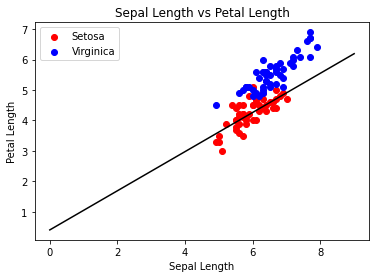

Iteration:  411
Weights:  [ 150.   238.2 -373.6]


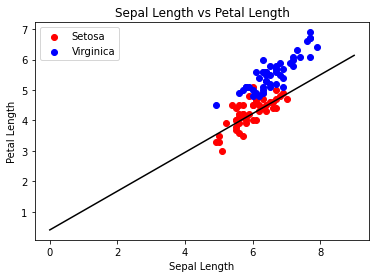

Iteration:  412
Weights:  [ 152.  247. -368.]


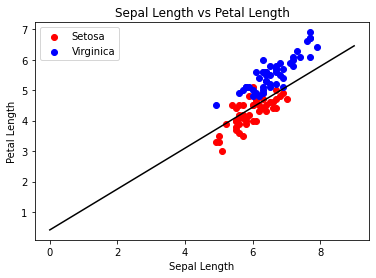

Iteration:  413
Weights:  [ 152.   243.4 -371.4]


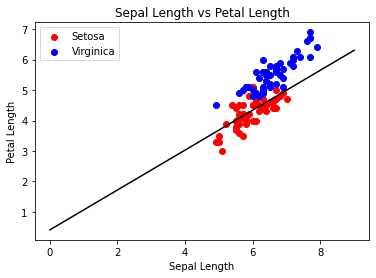

Iteration:  414
Weights:  [ 152.   239.6 -373.8]


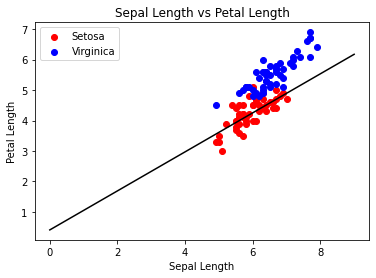

Iteration:  415
Weights:  [ 152.   238.4 -375.4]


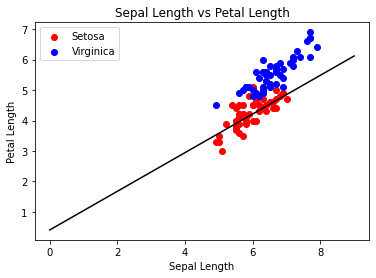

Iteration:  416
Weights:  [ 154.   247.2 -369.8]


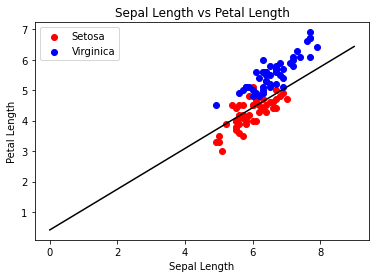

Iteration:  417
Weights:  [ 154.   242.2 -373.8]


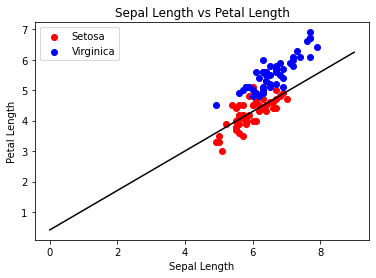

Iteration:  418
Weights:  [ 154.   241.  -375.4]


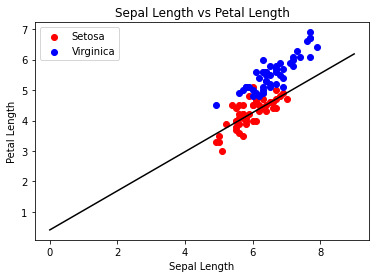

Iteration:  419
Weights:  [ 154.   239.8 -377. ]


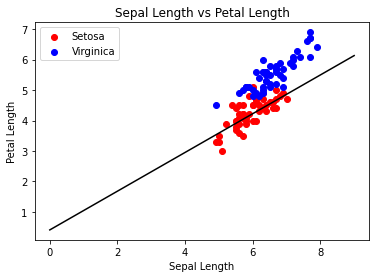

Iteration:  420
Weights:  [ 156.   248.6 -371.4]


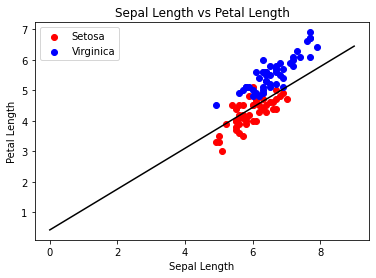

Iteration:  421
Weights:  [ 156.   245.  -374.8]


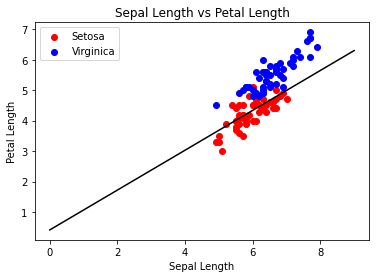

Iteration:  422
Weights:  [ 156.   241.2 -377.2]


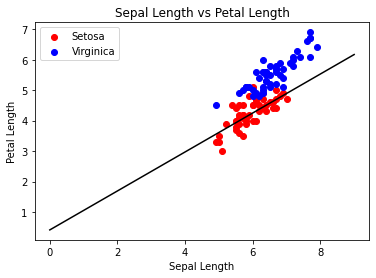

Iteration:  423
Weights:  [ 156.   240.  -378.8]


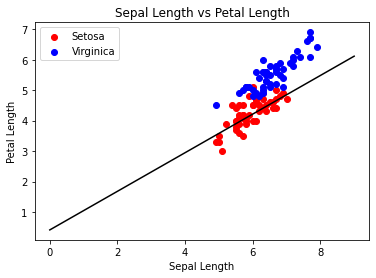

Iteration:  424
Weights:  [ 158.   248.8 -373.2]


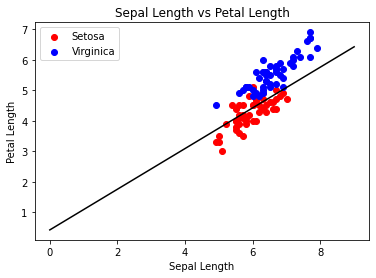

Iteration:  425
Weights:  [ 158.   246.4 -375. ]


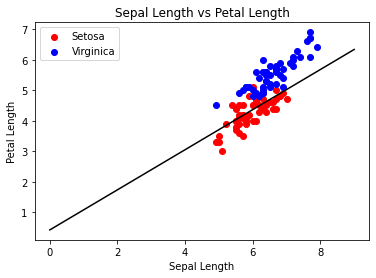

Iteration:  426
Weights:  [ 158.   242.6 -377.4]


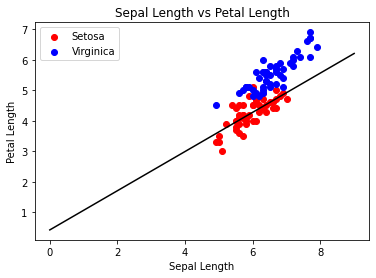

Iteration:  427
Weights:  [ 158.   241.4 -379. ]


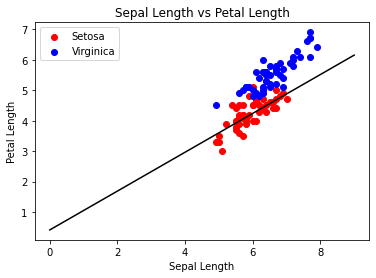

Iteration:  428
Weights:  [ 160.   250.2 -373.4]


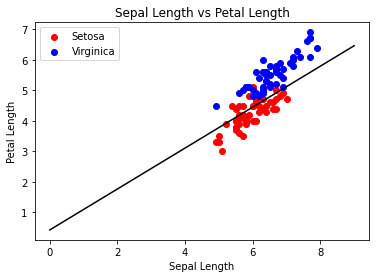

Iteration:  429
Weights:  [ 160.   246.6 -376.8]


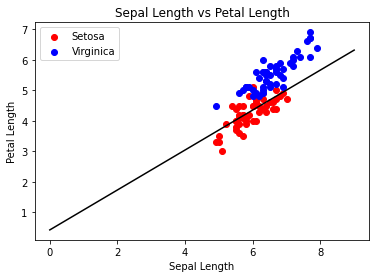

Iteration:  430
Weights:  [ 160.   242.8 -379.2]


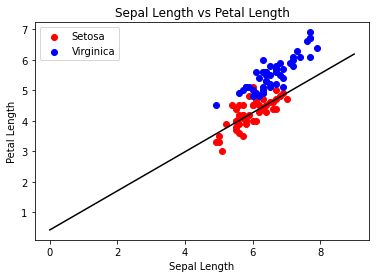

Iteration:  431
Weights:  [ 160.   241.6 -380.8]


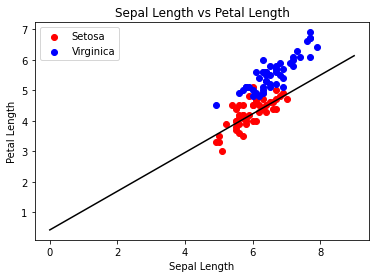

Iteration:  432
Weights:  [ 162.   250.4 -375.2]


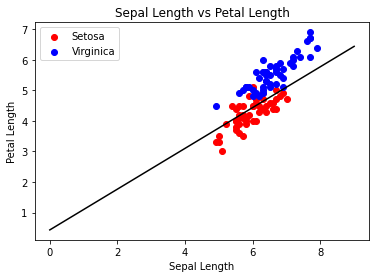

Iteration:  433
Weights:  [ 162.   247.8 -377.2]


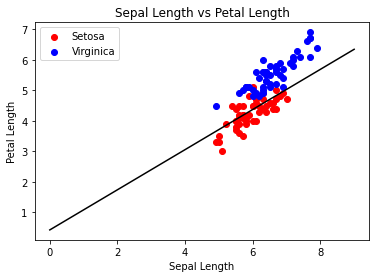

Iteration:  434
Weights:  [ 162.   244.  -379.6]


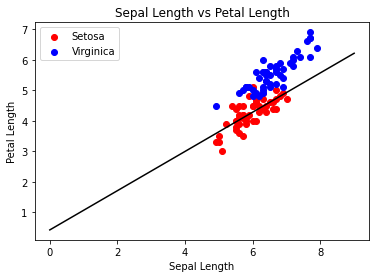

Iteration:  435
Weights:  [ 162.   242.8 -381.2]


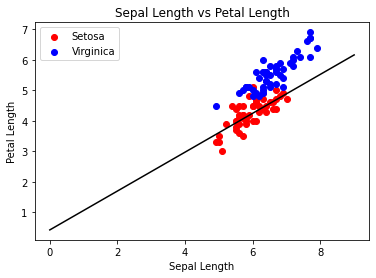

Iteration:  436
Weights:  [ 164.   252.8 -374.2]


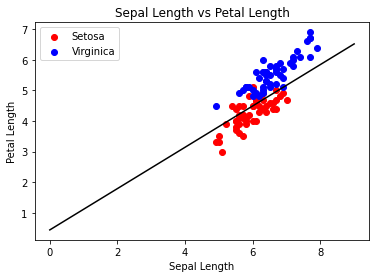

Iteration:  437
Weights:  [ 164.   249.2 -377.2]


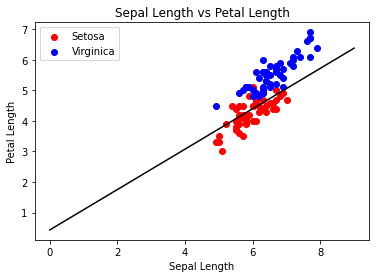

Iteration:  438
Weights:  [ 164.   245.4 -379.6]


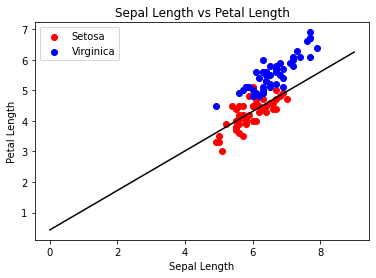

Iteration:  439
Weights:  [ 164.   244.2 -381.2]


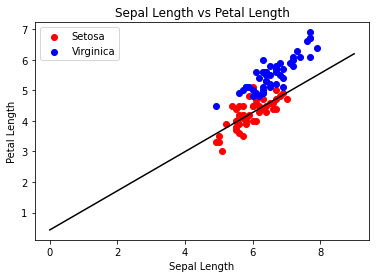

Iteration:  440
Weights:  [ 164.   243.  -382.8]


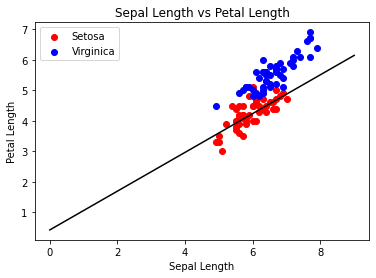

Iteration:  441
Weights:  [ 166.   251.8 -377.2]


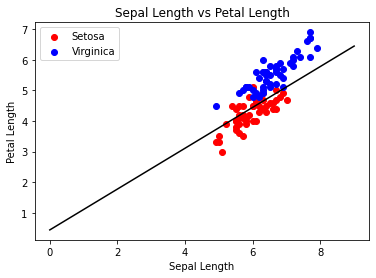

Iteration:  442
Weights:  [ 166.   248.2 -380.6]


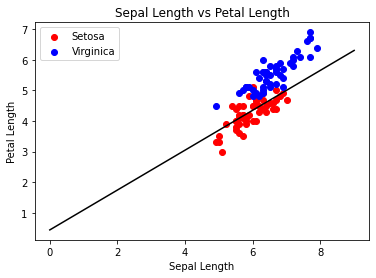

Iteration:  443
Weights:  [ 166.   244.4 -383. ]


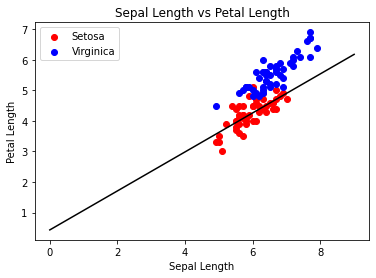

Iteration:  444
Weights:  [ 166.   240.6 -386.2]


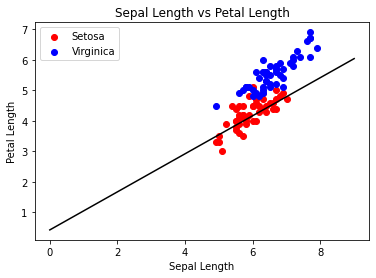

Iteration:  445
Weights:  [ 168.   249.6 -380.8]


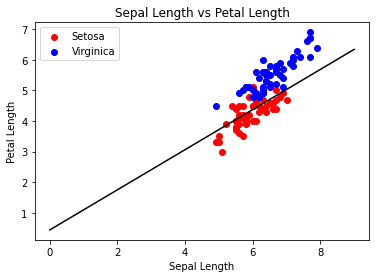

Iteration:  446
Weights:  [ 168.   245.8 -383.2]


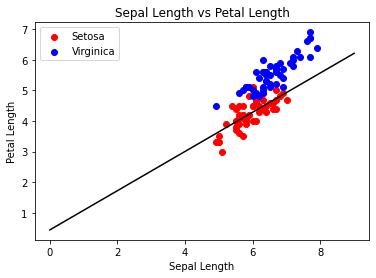

Iteration:  447
Weights:  [ 168.   244.6 -384.8]


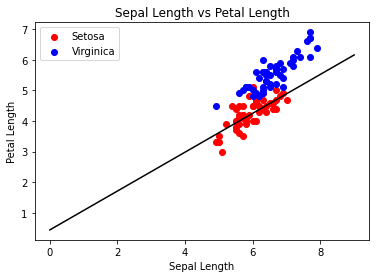

Iteration:  448
Weights:  [ 170.   254.6 -377.8]


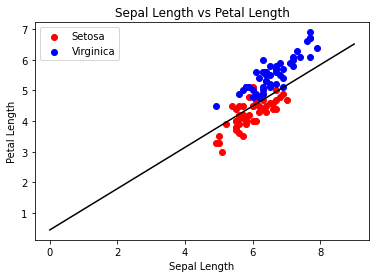

Iteration:  449
Weights:  [ 170.   251.  -380.8]


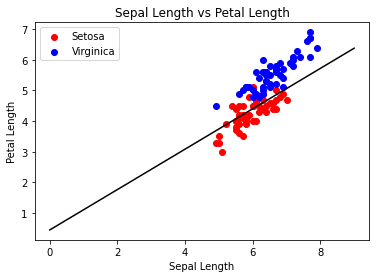

Iteration:  450
Weights:  [ 170.   247.2 -383.2]


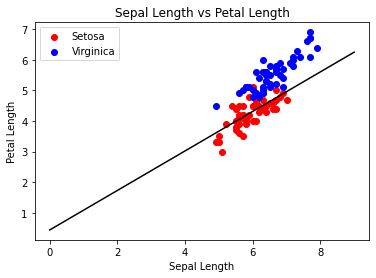

Iteration:  451
Weights:  [ 170.   246.  -384.8]


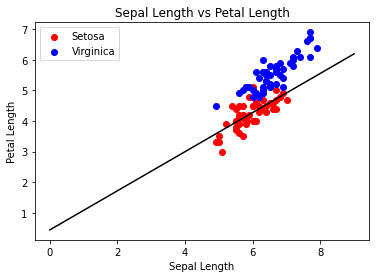

Iteration:  452
Weights:  [ 170.   244.8 -386.4]


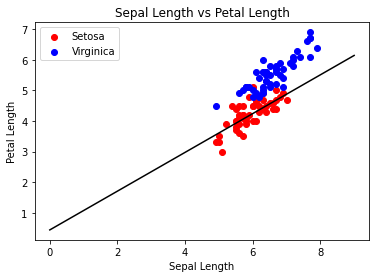

Iteration:  453
Weights:  [ 172.   253.6 -380.8]


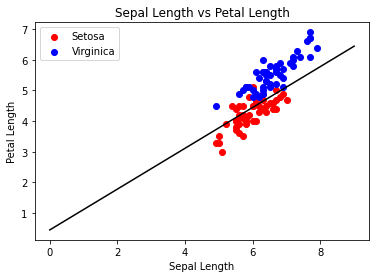

Iteration:  454
Weights:  [ 172.   251.  -382.8]


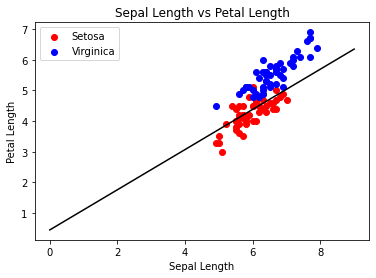

Iteration:  455
Weights:  [ 172.   247.2 -385.2]


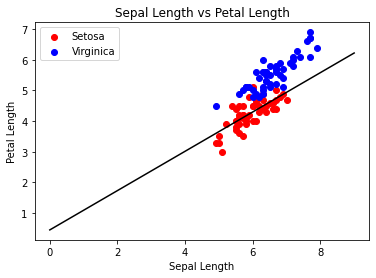

Iteration:  456
Weights:  [ 172.   246.  -386.8]


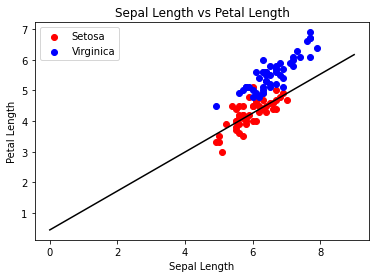

Iteration:  457
Weights:  [ 172.   242.2 -390. ]


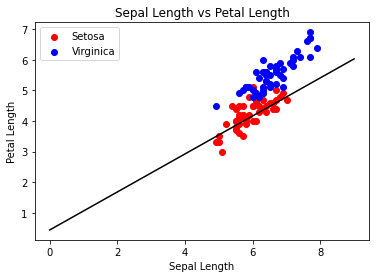

Iteration:  458
Weights:  [ 174.   251.2 -384.6]


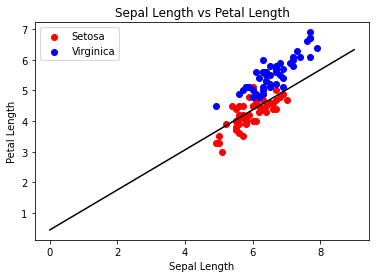

Iteration:  459
Weights:  [ 174.   247.4 -387. ]


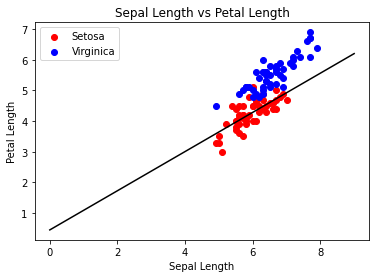

Iteration:  460
Weights:  [ 174.   246.2 -388.6]


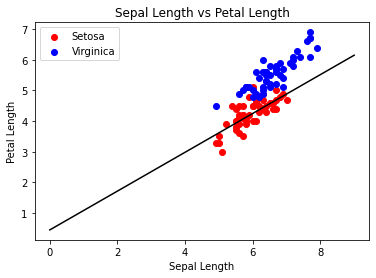

Iteration:  461
Weights:  [ 176.   256.2 -381.6]


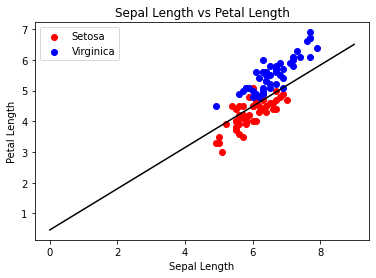

Iteration:  462
Weights:  [ 176.   252.4 -385.2]


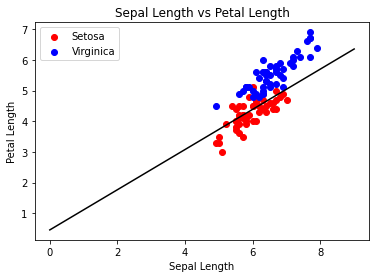

Iteration:  463
Weights:  [ 176.   248.6 -387.6]


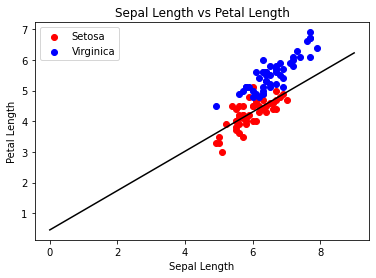

Iteration:  464
Weights:  [ 176.   247.4 -389.2]


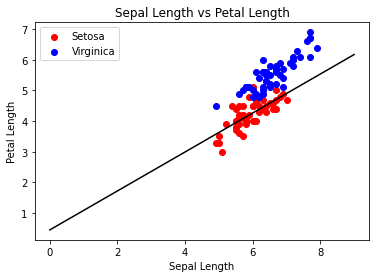

Iteration:  465
Weights:  [ 176.   243.6 -392.4]


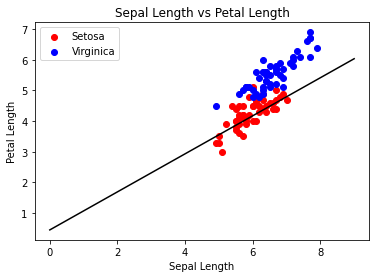

Iteration:  466
Weights:  [ 178.   252.6 -387. ]


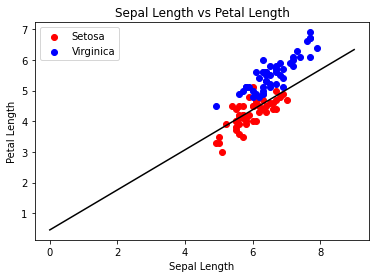

Iteration:  467
Weights:  [ 178.   248.8 -389.4]


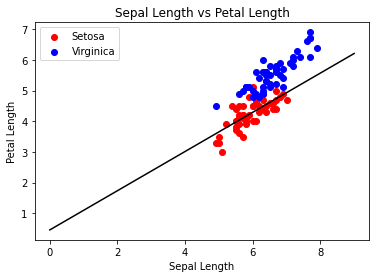

Iteration:  468
Weights:  [ 178.   247.6 -391. ]


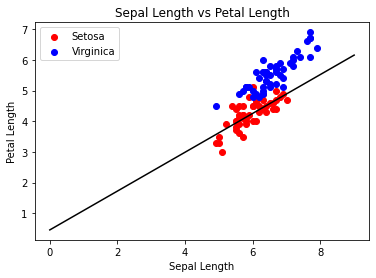

Iteration:  469
Weights:  [ 180.   257.6 -384. ]


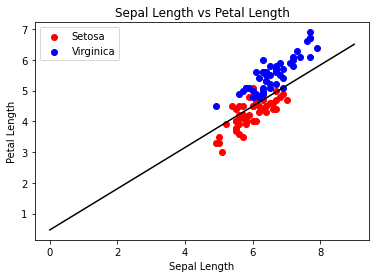

Iteration:  470
Weights:  [ 180.  254. -387.]


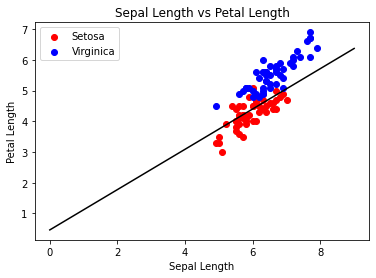

Iteration:  471
Weights:  [ 180.   250.2 -389.4]


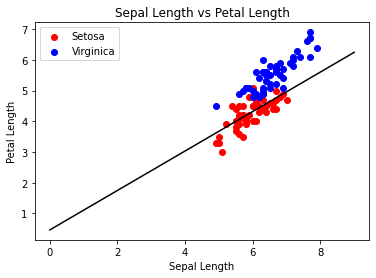

Iteration:  472
Weights:  [ 180.  249. -391.]


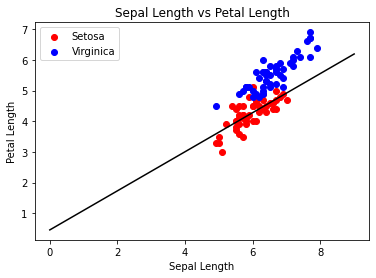

Iteration:  473
Weights:  [ 180.   245.2 -394.2]


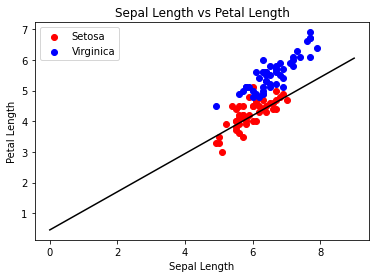

Iteration:  474
Weights:  [ 182.   254.2 -388.8]


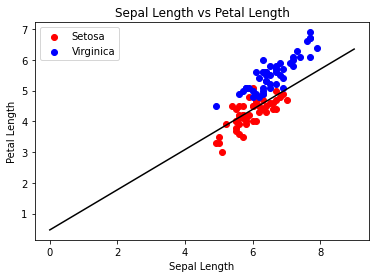

Iteration:  475
Weights:  [ 182.   250.4 -391.2]


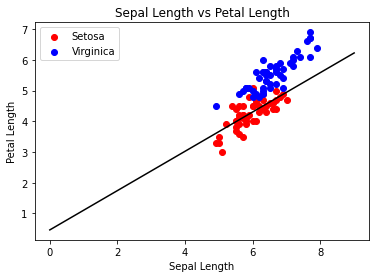

Iteration:  476
Weights:  [ 182.   249.2 -392.8]


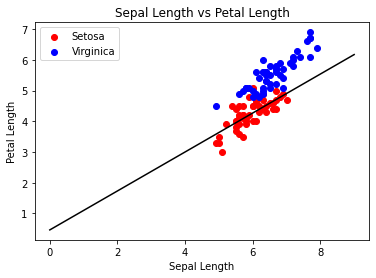

Iteration:  477
Weights:  [ 182.   245.4 -396. ]


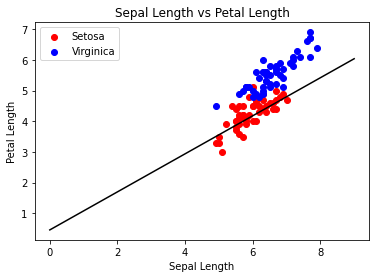

Iteration:  478
Weights:  [ 184.   254.4 -390.6]


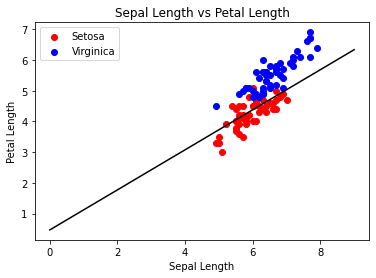

Iteration:  479
Weights:  [ 184.   250.6 -393. ]


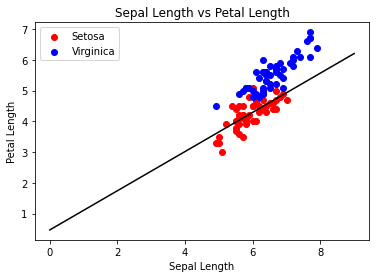

Iteration:  480
Weights:  [ 184.   249.4 -394.6]


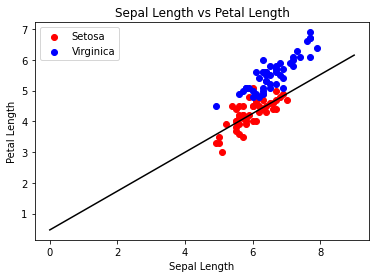

Iteration:  481
Weights:  [ 186.   259.4 -387.6]


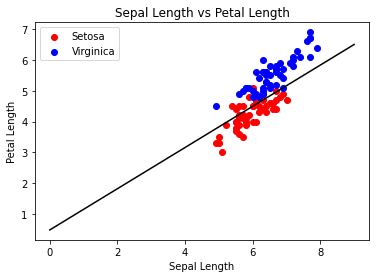

Iteration:  482
Weights:  [ 186.   255.8 -390.6]


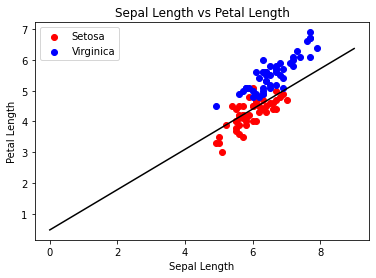

Iteration:  483
Weights:  [ 186.  252. -393.]


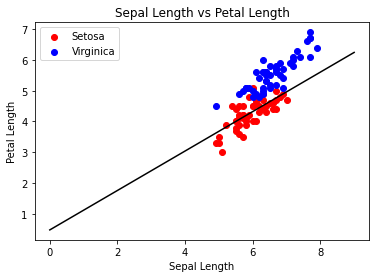

Iteration:  484
Weights:  [ 186.   250.8 -394.6]


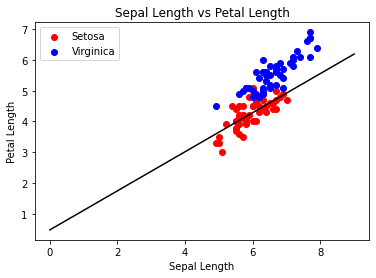

Iteration:  485
Weights:  [ 186.   247.  -397.8]


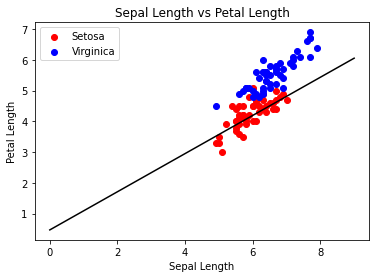

Iteration:  486
Weights:  [ 188.   256.  -392.4]


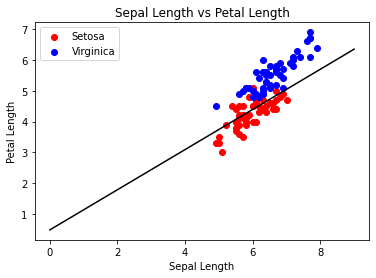

Iteration:  487
Weights:  [ 188.   252.2 -394.8]


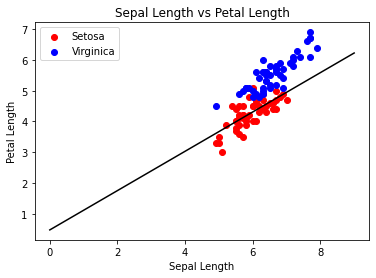

Iteration:  488
Weights:  [ 188.   251.  -396.4]


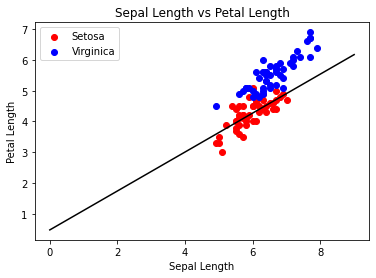

Iteration:  489
Weights:  [ 188.   247.2 -399.6]


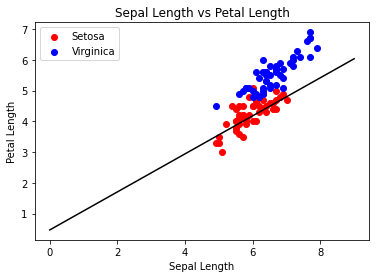

Iteration:  490
Weights:  [ 190.   256.2 -394.2]


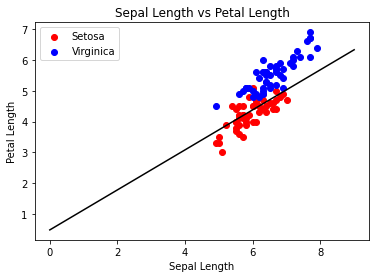

Iteration:  491
Weights:  [ 190.   252.4 -396.6]


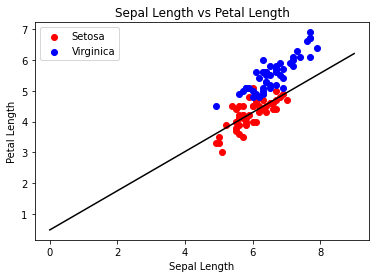

Iteration:  492
Weights:  [ 190.   251.2 -398.2]


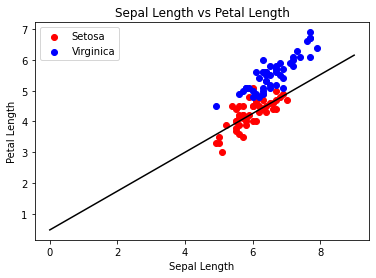

Iteration:  493
Weights:  [ 192.   261.2 -391.2]


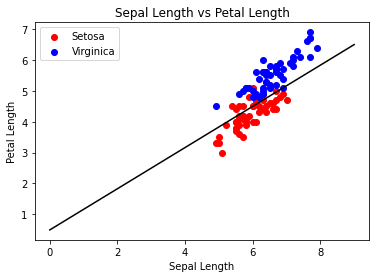

Iteration:  494
Weights:  [ 192.   257.6 -394.2]


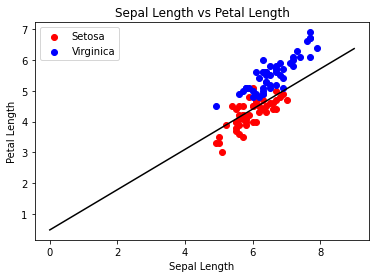

Iteration:  495
Weights:  [ 192.   253.8 -396.6]


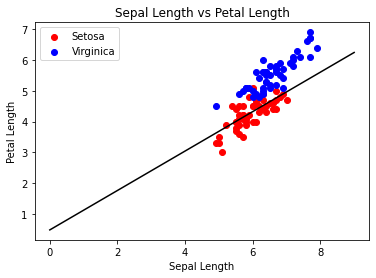

Iteration:  496
Weights:  [ 192.   252.6 -398.2]


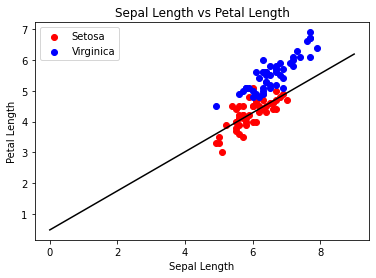

Iteration:  497
Weights:  [ 192.   248.8 -401.4]


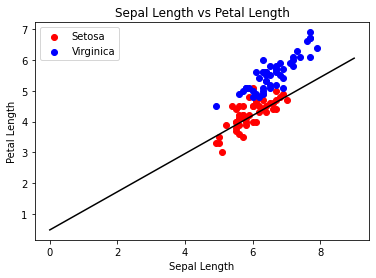

Iteration:  498
Weights:  [ 194.   257.8 -396. ]


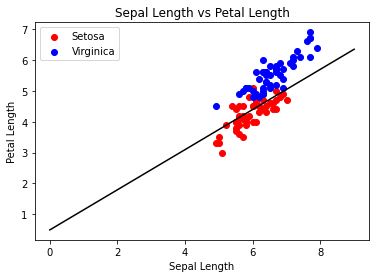

Iteration:  499
Weights:  [ 194.   254.  -398.4]


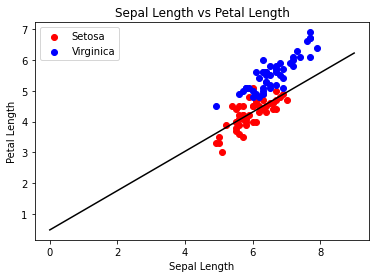

Iteration:  500
Weights:  [ 194.   252.8 -400. ]


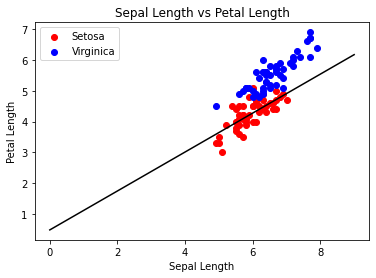

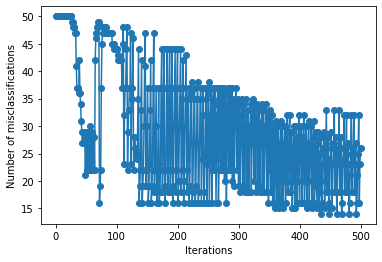

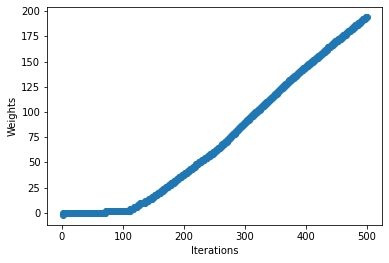

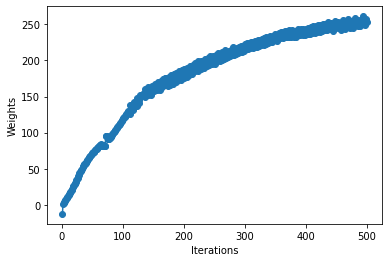

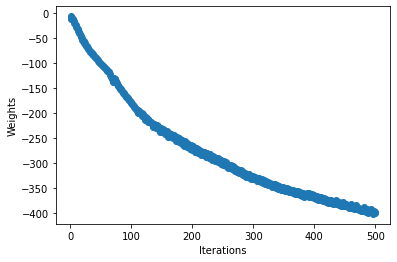

In [ ]:
# Revisit the code and adjust it such that it can choose the best iteration and weights according to the minimal misclassification error (this is called pocket algorithm).

# Run the perceptron algorithm for specific number of iterations (*** Hint : choose larger number of iterations for this problem (e.g. 100).).

# Show how the decision boundary is changing while the weights are being updated.

# Plot the misclassification error.

n_iter=500
fit(n_iter, X, y)


---

**Report the final weights for the classifier.**
> Final weights for 50 iterations: [0, 71, -100.8]

> Final weights for 500 iterations: [194, 252.8, -400]


---
